# Physiological Sepsis Phenotyping for Pitt Data 
## Step 3: Phenotypic features and Modeling




In [1]:
# pip install scikit-learn==1.4.2 imbalanced-learn==0.12.0

In [2]:
import sklearn
print(sklearn.__version__)

import imblearn
print(imblearn.__version__)

1.4.2
0.12.0


In [1]:
import pandas as pd
from datetime import datetime
import os
import numpy as np
from scipy.io import loadmat
import glob
import json
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm

from tc_physiophenotypic_feature_analysis import *

In [2]:








df_Sepsis_latest_wTarget = pd.read_csv('Data_folder/df_step2_TS_pitts_s3_MEDIANimp_physiomarkers_2016-2022_wTargets_v8.csv')
df_allFIN0 = pd.read_csv('Data_folder/df_step2_TS_pitts_s3_phenotypePredictedSegments_v8_ftt.csv')

In [3]:
df_allFIN0.shape, df_Sepsis_latest_wTarget.shape

((2185, 76), (26749, 1196))

# Presepsis block analysis: Model development (Classification and Regression)

Xgboost

In [4]:
df_Sepsis_latest_wTarget.columns[:30], df_Sepsis_latest_wTarget.columns[160:]

(Index(['Unnamed: 0.1', 'Unnamed: 0', 'index', 'segmentID', 'waveID', 'fin',
        'year_sepsis', 'studyID', 't_origin', 't_sepsis', 'sofa', 'ppg_class',
        'DN_exists', 'T_rr_ms_mean', 'T_rr_ms_median', 'T_rr_ms_std',
        'T_rr_ms_mad', 'T_rr_ms_iqr', 'T_rr_ms_min', 'T_rr_ms_max',
        'T_rr_ms_p25', 'T_rr_ms_p75', 'T_rr_ms_skewness', 'T_rr_ms_kurtosis',
        'T_rr_ms_entropy', 'T_rr_ms_slope', 'T_rr_ms_autocorr_lag1',
        'T_rr_ms_gini_index', 'T_rr_ms_valid_n', 'HR_bpm_mean'],
       dtype='object'),
 Index(['pr_segment_ms_mad', 'pr_segment_ms_iqr', 'pr_segment_ms_min',
        'pr_segment_ms_max', 'pr_segment_ms_p25', 'pr_segment_ms_p75',
        'pr_segment_ms_skewness', 'pr_segment_ms_kurtosis',
        'pr_segment_ms_entropy', 'pr_segment_ms_slope',
        ...
        'ss7', 'ss2', 'ss1', 'vp28', 'vp7', 'vp2', 'v28', 'v7', 'v2', 'v1'],
       dtype='object', length=1036))

In [5]:
df_Sepsis_latest_wTarget.columns, df_Sepsis_latest_wTarget.shape, df_Sepsis_latest_wTarget.fin.nunique()

(Index(['Unnamed: 0.1', 'Unnamed: 0', 'index', 'segmentID', 'waveID', 'fin',
        'year_sepsis', 'studyID', 't_origin', 't_sepsis',
        ...
        'ss7', 'ss2', 'ss1', 'vp28', 'vp7', 'vp2', 'v28', 'v7', 'v2', 'v1'],
       dtype='object', length=1196),
 (26749, 1196),
 2185)

In [6]:
if any(item == 'age' for item in list(df_Sepsis_latest_wTarget.columns)):
    print("Element is in the list")
else:
    print("Element is not in the list")

Element is not in the list


In [7]:
#df_allFIN.columns, df_allFIN.shape

# Add other demographic and lab features into df_Sepsis_latest_wTarget table

In [ ]:
demo = pd.read_csv('Data_folder/Event_Table/tcdemographics_mladi24_new.csv')
#demo = pd.read_csv('../Sepsis_Phenotyping_Physiomarkers/tcDemographics_pitts.csv')
demo['studyID'] = demo.study_id.copy().astype('str')
demo['fin'] = demo.FIN_study_id.copy().astype('int')
demo.drop_duplicates(inplace=True)
demo.reset_index(inplace=True, drop=True)
demo1 = demo[['fin','studyID','age','sex']]
demo1 = pd.get_dummies(demo1, columns=['sex'], drop_first=True, dtype='int')
demo1

In [9]:
demo.shape, demo.fin.nunique(), demo.studyID.nunique()

((21656, 10), 21589, 19545)

In [10]:
df_Sepsis_latest_wTarget['studyID'] = df_Sepsis_latest_wTarget.studyID.copy().astype('str')
df_Sepsis_latest_wTarget['fin'] = df_Sepsis_latest_wTarget.fin.copy().astype('int')
df_Sepsis_latest_wTarget.merge(demo1, on=['fin'], how='left').age.isnull().sum()

0

In [ ]:
x = df_Sepsis_latest_wTarget[df_Sepsis_latest_wTarget.segmentID==0]
print(x.shape)
x1 = x.merge(demo1, on=['fin'], how='left')#.age.isnull().sum()
x1

In [12]:
x.shape

(2174, 1196)

In [13]:
df_sepsis = pd.read_csv('../Sepsis_PittsSuper_table_2_12_24.csv')
df_sepsis.fin.nunique(), df_sepsis.shape

(4806, (327986, 30))

In [14]:
df_sepsis.merge(demo1, on=['fin'], how='left').age.isnull().sum()

0

In [15]:
df_sepsis.columns

Index(['Unnamed: 0', 'result_val_SpO2', 'result_val_PAO2',
       'result_val_Glasgow_Coma_Score', 'result_val_Mean_blood_pressure',
       'result_val_norepinephrine', 'result_val_DOBUTamine',
       'result_val_DOPamine', 'result_val_EPINEPHrine', 'result_val_Bilirubin',
       'result_val_Creatinine', 'result_val_Platelets', 'result_val_FIO2',
       'FIN', 'val_cardio', 'val_cardio_mod', 'val_neuro', 'val_hep',
       'val_renal', 'val_coag', 'PF', 'val_resp', 'SF', 'val_resp_sa', 'sofa',
       'delta_24hr_sofa', 'hourly', 't_sepsis', 't_sepsis_diff', 'fin'],
      dtype='object')

In [16]:
1645-854

791

In [17]:
791/1645

0.4808510638297872

In [ ]:
df_Sepsis_latest_wTarget = df_Sepsis_latest_wTarget.merge(demo1, on=['fin'], how='left')
df_Sepsis_latest_wTarget = df_Sepsis_latest_wTarget[~df_Sepsis_latest_wTarget.age.isnull()]
df_Sepsis_latest_wTarget['sex_Male'] = df_Sepsis_latest_wTarget['sex_Male'].astype(int)
df_Sepsis_latest_wTarget

## Load labs and vital sign features

In [ ]:
path = '../pitts_emr_data'
labs1 = pd.read_csv(path + '/labs_Albumin.csv', low_memory=False)
labs2 = pd.read_csv(path + '/labs_AlkPhos.csv', low_memory=False)
labs3 = pd.read_csv(path + '/labs_ALT.csv', low_memory=False)
labs4 = pd.read_csv(path + '/labs_ArterialPh.csv', low_memory=False)
labs5 = pd.read_csv(path + '/labs_AST.csv', low_memory=False)
labs6 = pd.read_csv(path + '/labs_BaseDeficitArterial.csv', low_memory=False)
labs7 = pd.read_csv(path + '/labs_Bicarb.csv', low_memory=False)
labs8 = pd.read_csv(path + '/labs_BNP.csv', low_memory=False)
labs9 = pd.read_csv(path + '/labs_BUN.csv', low_memory=False)
labs10 = pd.read_csv(path + '/labs_Calcium.csv', low_memory=False)
labs11 = pd.read_csv(path + '/labs_Chloride.csv', low_memory=False)
labs12 = pd.read_csv(path + '/labs_Cr.csv', low_memory=False)
labs13 = pd.read_csv(path + '/labs_Glucose.csv', low_memory=False)
labs14 = pd.read_csv(path + '/labs_Hgb.csv', low_memory=False)
labs15 = pd.read_csv(path + '/labs_iCal.csv', low_memory=False)
labs16 = pd.read_csv(path + '/labs_INR.csv', low_memory=False)
labs17 = pd.read_csv(path + '/labs_Lactate.csv', low_memory=False)
labs18 = pd.read_csv(path + '/labs_Neut_perc.csv', low_memory=False)
labs19 = pd.read_csv(path + '/labs_PaO2.csv', low_memory=False)
labs20 = pd.read_csv(path + '/labs_Platelets.csv', low_memory=False)
labs21 = pd.read_csv(path + '/labs_PTT.csv', low_memory=False)
labs22 = pd.read_csv(path + '/labs_Sodium.csv', low_memory=False)
labs23 = pd.read_csv(path + '/labs_totalBl.csv', low_memory=False)
labs24 = pd.read_csv(path + '/labs_Troponin.csv', low_memory=False)
labs25 = pd.read_csv(path + '/labs_WBC.csv', low_memory=False)
labs26 = pd.read_csv(path + '/labs_Potassium.csv', low_memory=False)

df_labs = pd.concat([labs1,labs2,labs3,labs4,labs5,labs6,labs7,labs8,labs9,labs10,labs11,
     labs12,labs13,labs14,labs15,labs16,labs17,labs18,labs19,labs20,labs21,labs22,labs23,
     labs24,labs25,labs26])

df_labs['fin'] = df_labs.FIN_study_id.values
df_labs['studyID'] = df_labs.study_id.values
df_labs = df_labs[['fin', 'studyID','EVENT_DATE', 'eUTCOffset', 'ORDERED_AS','EVENT_DISP', 'RESULT_VAL', 'RESULT_UNIT', 'Labs']]
df_labs.drop_duplicates(inplace=True)
df_labs

In [22]:
df_labs['fin'] = df_labs['fin'].astype(int)
df_labs['studyID'] = df_labs['studyID'].astype(str)
df_Sepsis_latest_wTarget['fin'] = df_Sepsis_latest_wTarget['fin'].astype(int)
# df_Sepsis_latest_wTarget['studyID'] = df_Sepsis_latest_wTarget['studyID'].astype(str)

In [23]:
df_labs0 = df_labs[df_labs.fin.isin(df_Sepsis_latest_wTarget.fin)]

In [ ]:
df_labs0

In [27]:
# df_Sepsis_latest_wTarget = df_Sepsis_latest_wTarget.drop(columns=['Unnamed: 0.1', 'Unnamed: 0', 'index', 'waveID',
#        'year_sepsis', 't_origin', 't_sepsis','studyID_y'], axis=1).drop_duplicates()

In [25]:
print("df_labs0['fin'] dtype:", df_labs0['fin'].dtype)
print("df_Sepsis_latest_wTarget['fin'] dtype:", df_Sepsis_latest_wTarget['fin'].dtype)

df_labs0['fin'] dtype: int64
df_Sepsis_latest_wTarget['fin'] dtype: int64


In [25]:
df_labs1 = df_labs0.merge(df_Sepsis_latest_wTarget, how='left', on=['fin']) #,'studyID'

In [ ]:
# results = []

# chunk_size = 10000
# for i in range(0, df_labs0.shape[0], chunk_size):
#     chunk = df_labs0.iloc[i:i+chunk_size]
#     merged = chunk.merge(df_Sepsis_latest_wTarget, how='left', on='fin')
#     results.append(merged)

# df_labs1 = pd.concat(results, ignore_index=True)

In [ ]:
# import dask.dataframe as dd

# ddf_labs0 = dd.from_pandas(df_labs0, npartitions=10)
# ddf_Sepsis = dd.from_pandas(df_Sepsis_latest_wTarget, npartitions=1)

# merged = ddf_labs0.merge(ddf_Sepsis, how='left', on='fin')
# df_labs1 = merged.compute()

In [ ]:
df_labs_f = df_labs1[~df_labs1['Unnamed: 0'].isnull()]
df_labs_f['EVENT_DATE'] = pd.to_datetime(df_labs_f['EVENT_DATE'])
df_labs_f['t_sepsis'] = pd.to_datetime(df_labs_f['t_sepsis'])
# PT/INR Correction
df_labs_f['Labs'][(df_labs_f.Labs=='INR') & (df_labs_f.RESULT_UNIT=='sec')] = 'PT'
df_labs_f

In [ ]:
df_labs_f['EVENT_DATE'] = pd.to_datetime(df_labs_f['EVENT_DATE'])
df_labs_f['t_sepsis'] = pd.to_datetime(df_labs_f['t_sepsis'])

In [ ]:
df_labs_f['del_T_labs'] = df_labs_f['t_sepsis'] - df_labs_f['EVENT_DATE'] 
df_labs_f['del_T_labs'][df_labs_f['del_T_labs']<pd.Timedelta(days=0)] = pd.Timedelta(days=100) #Garbage value
ufin = df_labs_f.fin.unique()
ulabs = df_labs_f.Labs.unique()

df_X = pd.DataFrame()
for i in tqdm(ufin):
    df_i = df_labs_f[df_labs_f.fin == i]
    records = []
    for k in ulabs:
        df_ik = df_i[df_i.Labs == k]
        if not df_ik.empty:
            try:
                min_row = df_ik.loc[df_ik.del_T_labs.idxmin()]
                records.append(min_row)
            except ValueError:
                pass  # In case idxmin fails

    if records:
        df_Y = pd.DataFrame(records)
        pivoted_df = df_Y.pivot_table(
            index=[],      # or use another unique identifier if available
            columns='Labs',
            values='RESULT_VAL',
            aggfunc='first'                  # in case of duplicates, pick the first
        ).reset_index()

        z = pd.DataFrame([], columns=ulabs)
        z = pd.concat([z, pivoted_df], ignore_index=True)
        df_Z = pd.concat([pd.DataFrame(df_Y.iloc[0]).T.reset_index(), z], axis=1)
        df_Z.drop(['index','studyID_y','EVENT_DATE', 'eUTCOffset','ORDERED_AS','EVENT_DISP','RESULT_VAL','RESULT_UNIT','Labs','del_T_labs'], axis=1, inplace=True)
        df_X = pd.concat([df_X, df_Z], ignore_index=True)

df_X

In [ ]:
ind = list(df_X.columns).index('Albumin')
for j in list(df_X.iloc[:,ind:].columns):
    # Step 1: Convert valid strings to numeric, coerce errors to NaN
    df_X[j] = pd.to_numeric(df_X[j], errors='coerce')
    # Step 2: Impute NaNs with the mean
    df_X[j].fillna(df_X[j].mean(), inplace=True)

In [ ]:
df_X

In [ ]:
vitals1 = pd.read_csv(path + '/vitals_fio2.csv', low_memory=False)
vitals2 = pd.read_csv(path + '/vitals_map.csv', low_memory=False)
vitals3 = pd.read_csv(path + '/vitals_dbp.csv', low_memory=False)
vitals4 = pd.read_csv(path + '/vitals_GCS.csv', low_memory=False)
vitals5 = pd.read_csv(path + '/vitals_PEEP.csv', low_memory=False)
vitals6 = pd.read_csv(path + '/vitals_pulse.csv', low_memory=False)
vitals7 = pd.read_csv(path + '/vitals_resp_rate.csv', low_memory=False)

In [17]:
pd.read_csv(path + '/vitals_sbp.csv', low_memory=False)

FileNotFoundError: [Errno 2] No such file or directory: '../pitts_emr_data/vitals_sbp.csv'

## Add lasso_CV into XGBmodel_phenotype_features_STM_classification and Regression functions with if else

In [27]:
df_X['sex_Male'] = df_X.sex_Male.astype(int)

NameError: name 'df_X' is not defined

In [ ]:
df_X['age'] = df_X['age'].astype(int)

In [19]:
# df_allFIN = df_allFIN0.merge(df_X[['fin','studyID_x','age','sex_Male', 
#         'Albumin', 'AlkPhos', 'ALT', 'ArterialPh', 'AST',
#        'BaseDeficitArterial', 'Bicarb', 'BNP', 'BUN', 'Calcium',
#        'Chloride', 'Creatinine', 'Glucose', 'Hgb', 'iCal', 'INR', 'PT',
#        'Lactate', 'Neut_perc', 'PaO2', 'Platelets', 'PTT', 'Sodium',
#        'Bilirubin_total', 'Troponin', 'WBC', 'Potassium'
#         ]].drop_duplicates(), on=['fin'], how='inner') #df_Sepsis_latest_wTarget
df_allFIN = df_allFIN0.copy()

In [20]:
if any(item == 'studyID_y' for item in list(df_allFIN.columns)):
    print("Element is in the list, discarded it now!")
    df_allFIN.drop(['studyID_y'], axis=1, inplace=True)
elif any(item == 'studyID_x' for item in list(df_allFIN.columns)):
    print("Element is in the list, discarded it now!")
    df_allFIN.drop(['studyID_x'], axis=1, inplace=True)
else:
    print("Element is not in the list")

Element is not in the list


In [ ]:
# vvv = tc_phenotypic_feature_extraction(df=df_allFIN.copy(), block_duration='30min')
# vvv.columns[74:]

In [21]:
df_input = df_allFIN.copy()    

In [22]:
no_discard = []
demo_feat = ['age','sex_Male']
clinical_feat = ['Albumin', 'AlkPhos', 'ALT', 'ArterialPh', 'AST',
       'BaseDeficitArterial', 'Bicarb', 'BNP', 'BUN', 'Calcium',
       'Chloride', 'Creatinine', 'Glucose', 'Hgb', 'iCal', 'INR', 'PT',
       'Lactate', 'Neut_perc', 'PaO2', 'Platelets', 'PTT', 'Sodium',
       'Bilirubin_total', 'Troponin', 'WBC', 'Potassium']
df_input1 = df_input.drop(no_discard, axis=1) # demo_feat + clinical_feat    no_discard

In [23]:
x1.columns[100:]

Index(['P_duration_p25', 'P_duration_p75', 'P_duration_skewness',
       'P_duration_kurtosis', 'P_duration_entropy', 'P_duration_slope',
       'P_duration_autocorr_lag1', 'P_duration_gini_index',
       'P_duration_valid_n', 'QRS_duration_mean',
       ...
       'vp28', 'vp7', 'vp2', 'v28', 'v7', 'v2', 'v1', 'studyID_y', 'age',
       'sex_Male'],
      dtype='object', length=1099)

In [27]:
x1.loc[:, 'ppg_class':'Death28'].isnull().sum()

ppg_class         385
DN_exists          42
T_rr_ms_mean        0
T_rr_ms_median      0
T_rr_ms_std         0
                 ... 
qSOFA_sbp           0
qSOFA_rr            0
qSOFA_gcs           0
qSOFA_total         0
Death28             0
Length: 1162, dtype: int64

<Axes: >

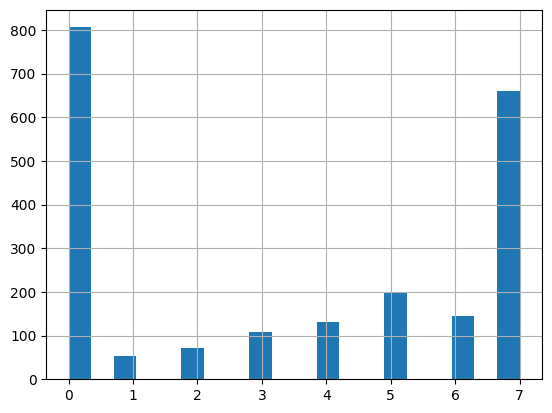

In [25]:
x1.vpfd7.hist(bins=20)

================== PREDICTION OF ss2 WITH FEATURE DATA ==================
Top selected features:
qSOFA_total                0.047776
AUCow_nu_mean              0.020589
st_interval_ms_skewness    0.015677
qSOFA_sbp                  0.014631
Tsys_ms_std                0.011974
                             ...   
AUCow_nu_kurtosis         -0.010528
Delta_A_sp_sp_median      -0.010817
energy_ppg_max            -0.012864
MSE_6                     -0.015087
max_upslope_median        -0.016091
Length: 67, dtype: float64


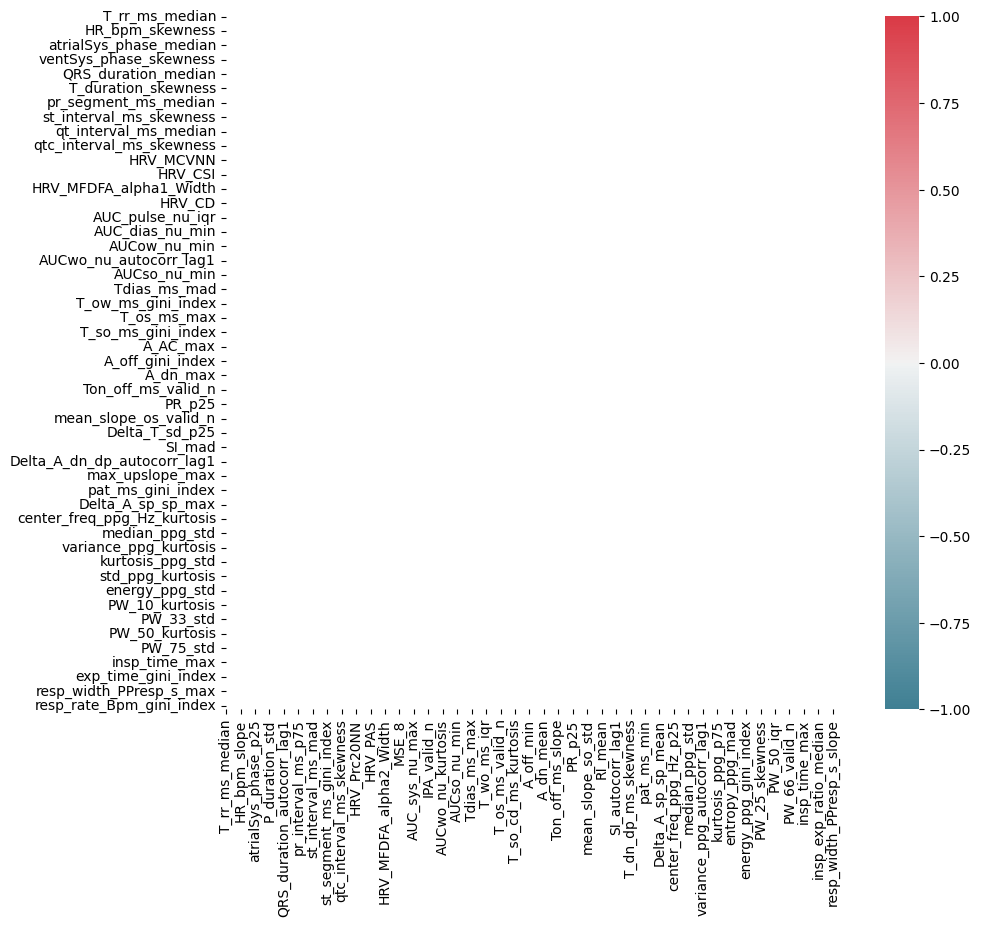

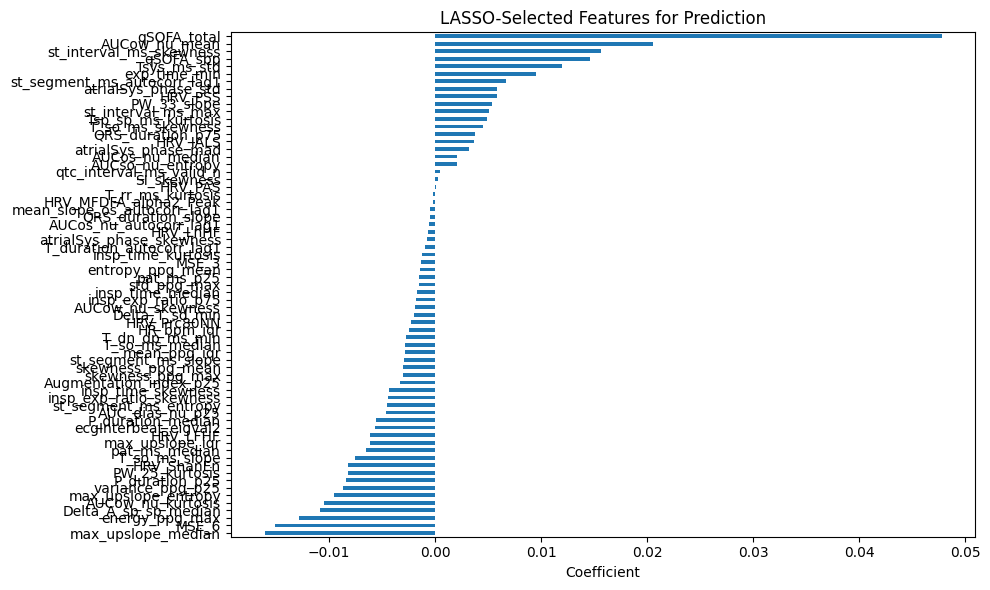

================== FS: With LASSO SELECTED FEATURES ==================

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.706 ± 0.018
precision : 0.370 ± 0.036
recall    : 0.414 ± 0.057
f1        : 0.391 ± 0.045
roc_auc   : 0.647 ± 0.026
pr_auc    : 0.376 ± 0.041


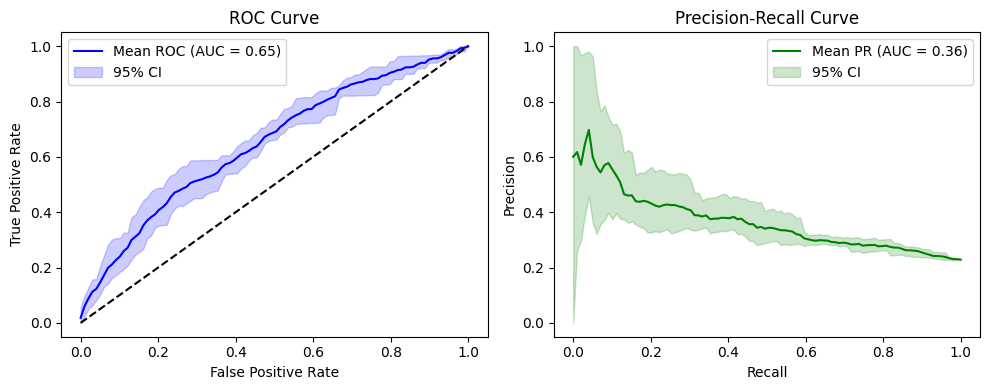


[SHAP] Generating SHAP beeswarm plot for best fold...


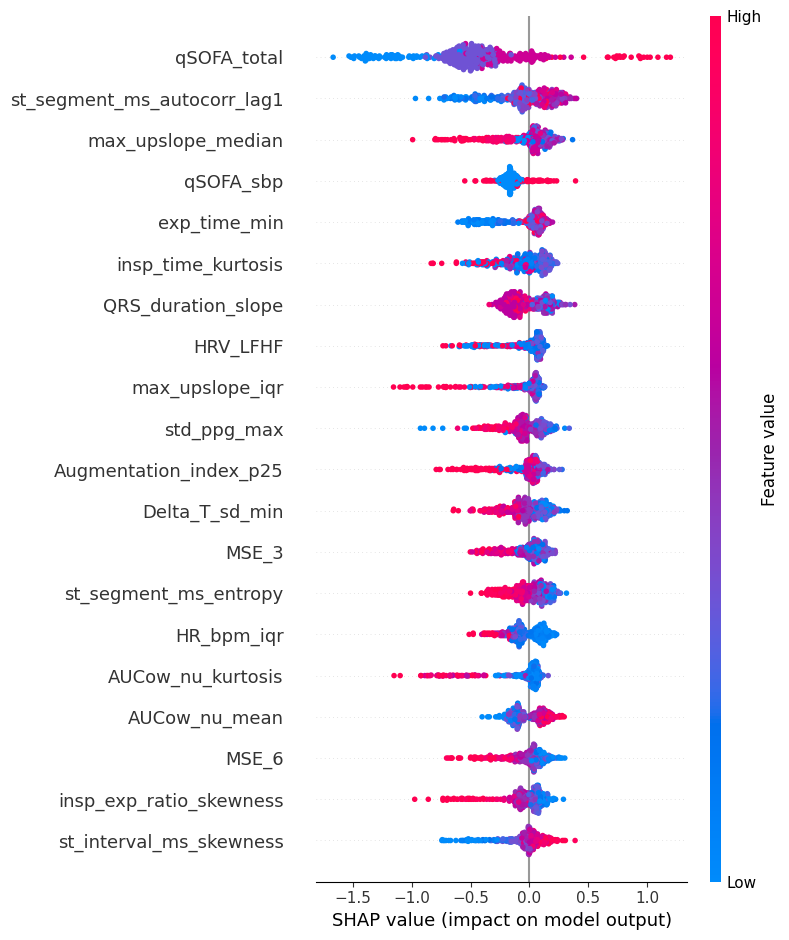

In [28]:
df_feature_wTarget=Block_STO_prediction_anyFeature(df=x1.copy(), eventXdays_postS3onset='ss2', feature_win = ('T_rr_ms_mean','Death28'))

================== PREDICTION OF v2 WITH FEATURE DATA ==================
Top selected features:
qSOFA_total                 0.041319
qSOFA_gcs                   0.022233
dpat_ms_p25                 0.004567
AUCwo_nu_min                0.002272
resp_rate_Bpm_min           0.000700
st_segment_ms_entropy      -0.000861
resp_width_PPresp_s_std    -0.002457
T_dn_dp_ms_max             -0.002549
Tsys_ms_min                -0.002944
T_os_ms_mad                -0.003972
variance_ppg_mad           -0.004703
pr_segment_ms_max          -0.004920
variance_ppg_max           -0.006005
resp_width_PPresp_s_max    -0.006850
exp_time_max               -0.007002
resp_width_PPresp_s_mean   -0.008233
PW_10_std                  -0.011849
std_ppg_max                -0.014859
dtype: float64


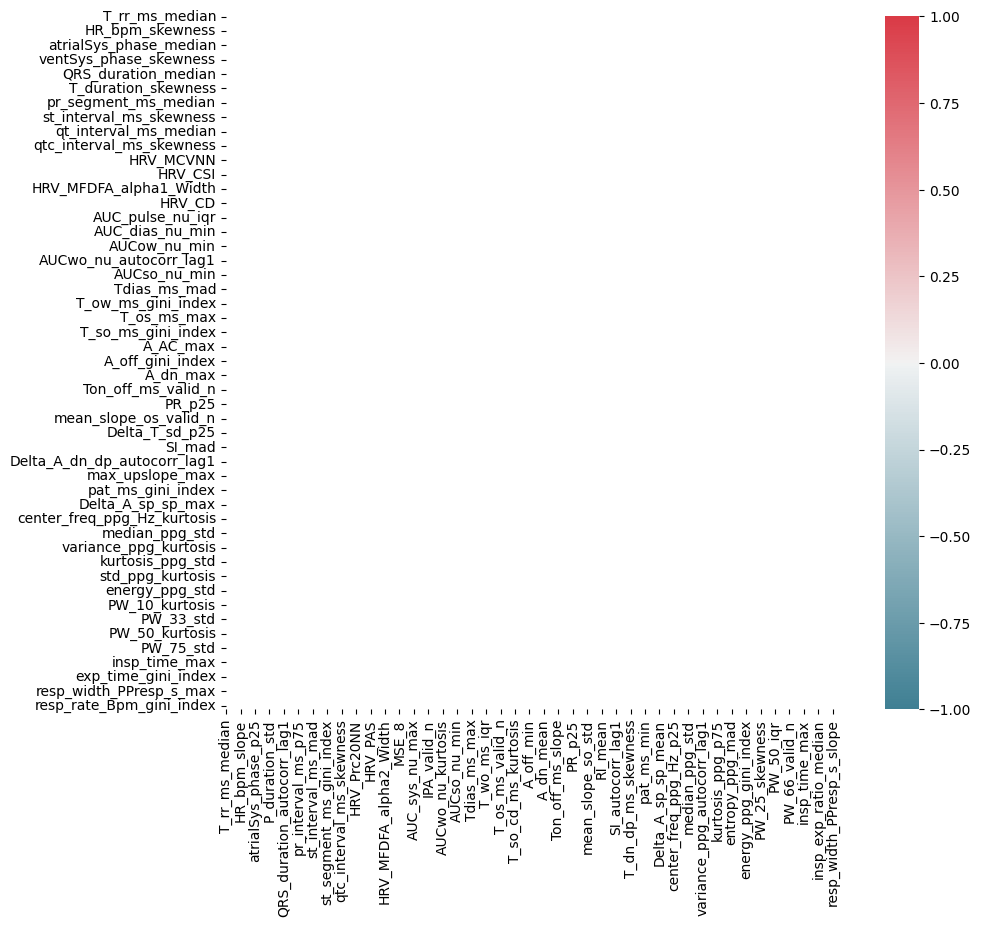

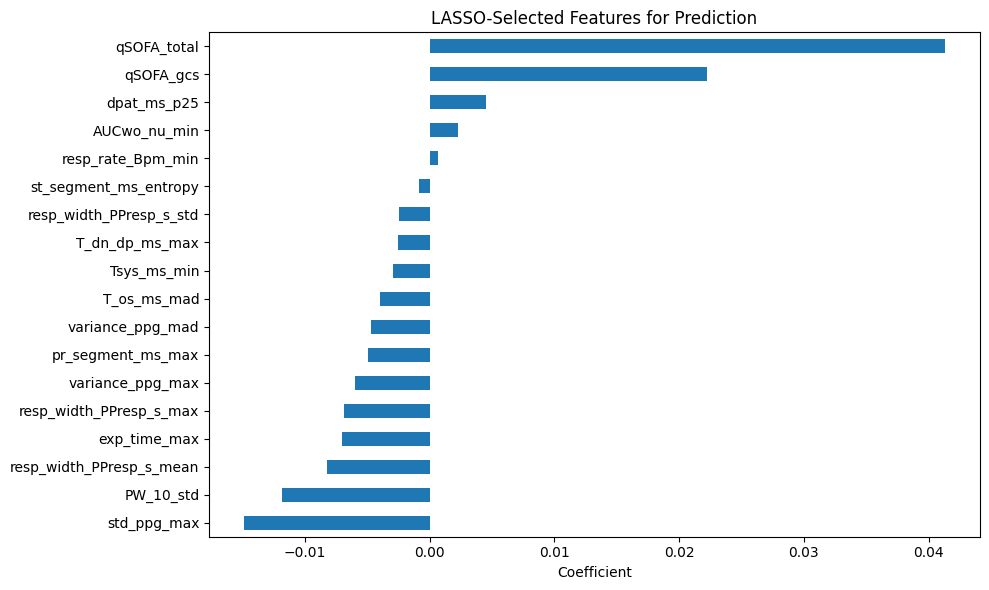

================== FS: With LASSO SELECTED FEATURES ==================

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.592 ± 0.019
precision : 0.447 ± 0.022
recall    : 0.522 ± 0.024
f1        : 0.481 ± 0.022
roc_auc   : 0.610 ± 0.020
pr_auc    : 0.472 ± 0.032


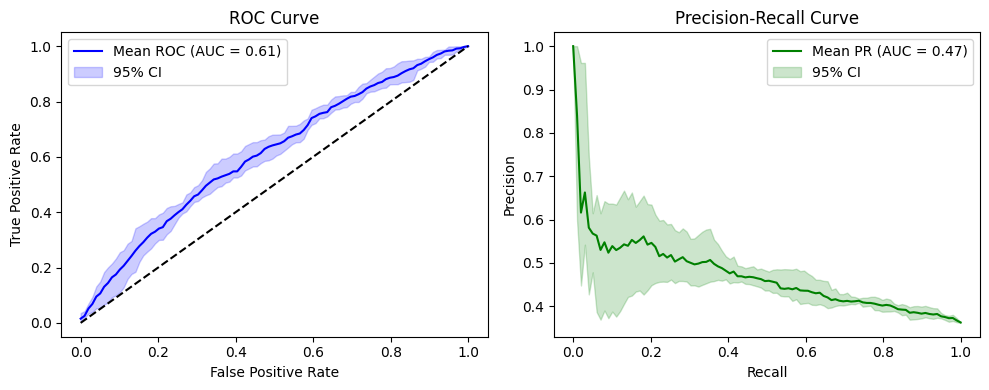


[SHAP] Generating SHAP beeswarm plot for best fold...


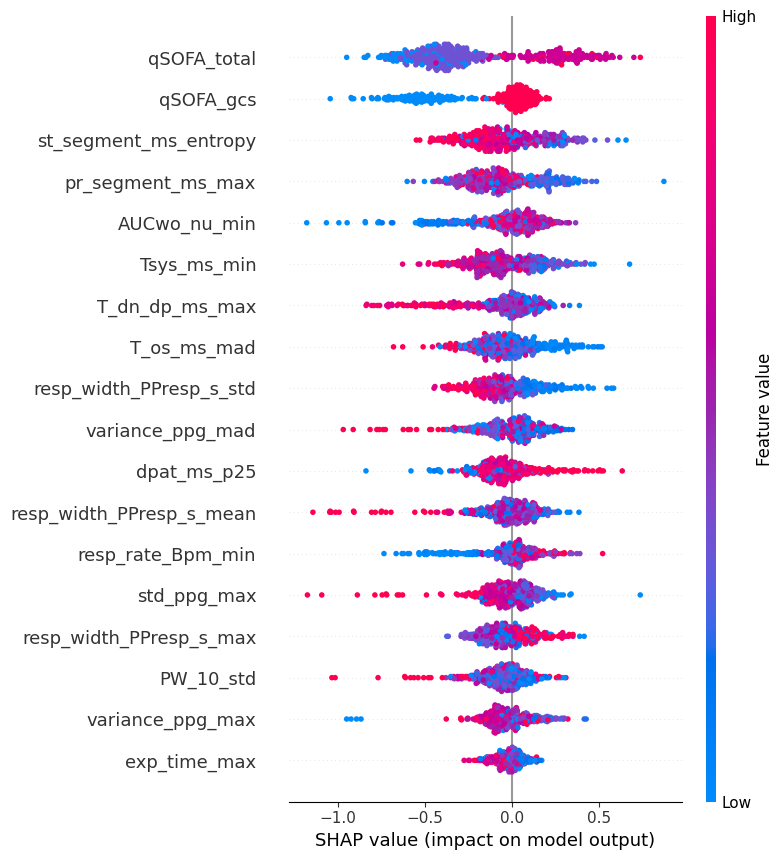

In [29]:
df_feature_wTarget=Block_STO_prediction_anyFeature(df=x1.copy(), eventXdays_postS3onset='v2', feature_win = ('T_rr_ms_mean','Death28'))

================== PREDICTION OF v1 WITH FEATURE DATA ==================
Top selected features:
qSOFA_total                          0.039110
qSOFA_gcs                            0.034501
dpat_ms_p25                          0.004199
AUCwo_nu_min                         0.003665
resp_rate_Bpm_min                    0.002926
resp_rate_Bpm_mean                   0.000611
PW_33_skewness                      -0.000376
qtc_interval_ms_entropy             -0.000526
entropy_ppg_p75                     -0.000645
Tsys_ms_p25                         -0.001192
atrialSys_phase_skewness            -0.001215
resp_width_PPresp_s_autocorr_lag1   -0.001682
st_segment_ms_entropy               -0.002024
pr_segment_ms_max                   -0.002256
Tsys_ms_min                         -0.003981
resp_width_PPresp_s_mean            -0.004669
T_os_ms_mad                         -0.004679
variance_ppg_std                    -0.004989
T_dn_dp_ms_max                      -0.006083
T_os_ms_iqr                   

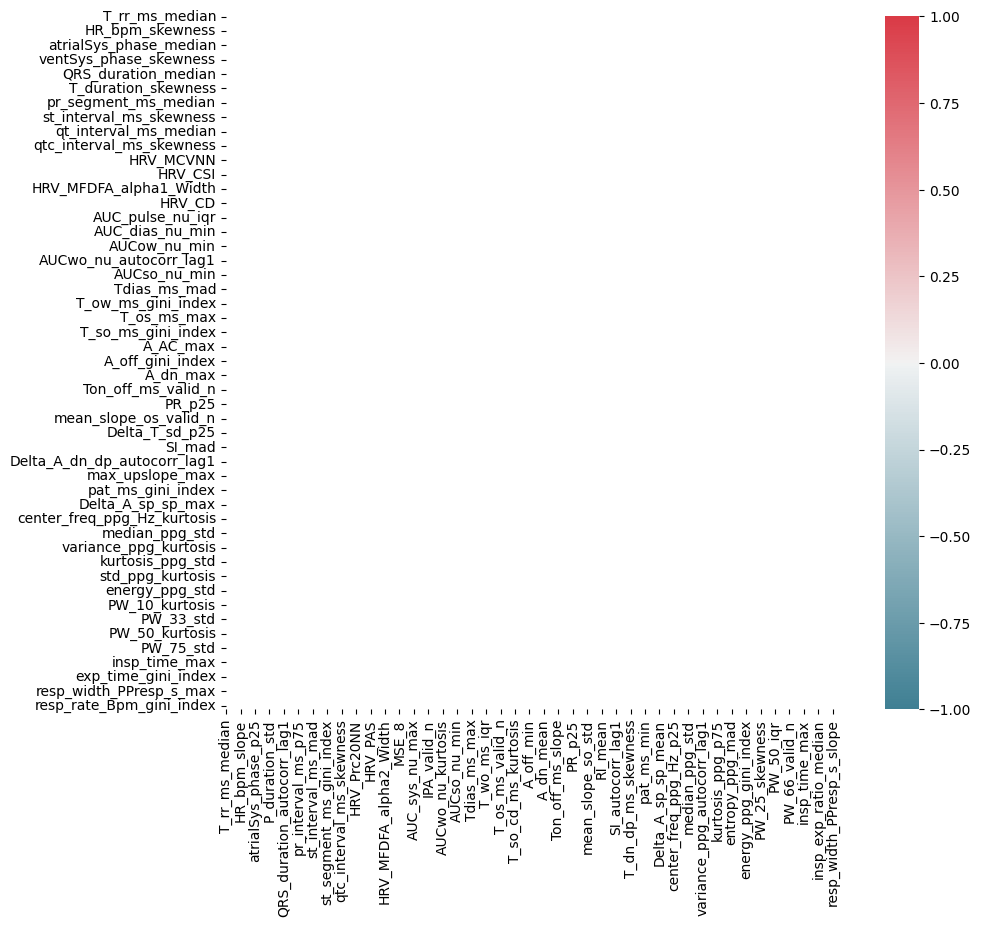

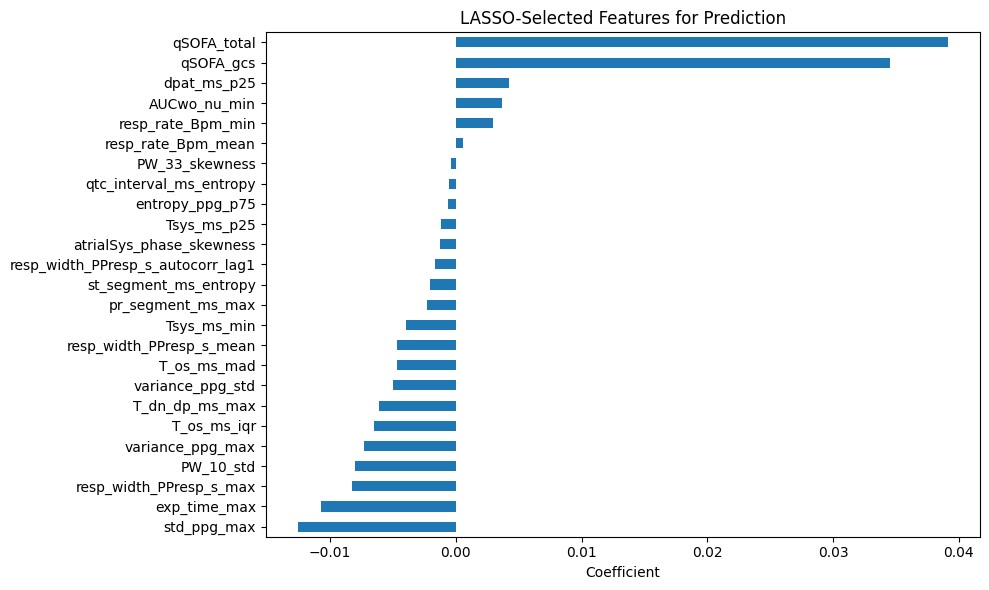

================== FS: With LASSO SELECTED FEATURES ==================

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.613 ± 0.024
precision : 0.452 ± 0.028
recall    : 0.551 ± 0.041
f1        : 0.496 ± 0.031
roc_auc   : 0.642 ± 0.020
pr_auc    : 0.477 ± 0.022


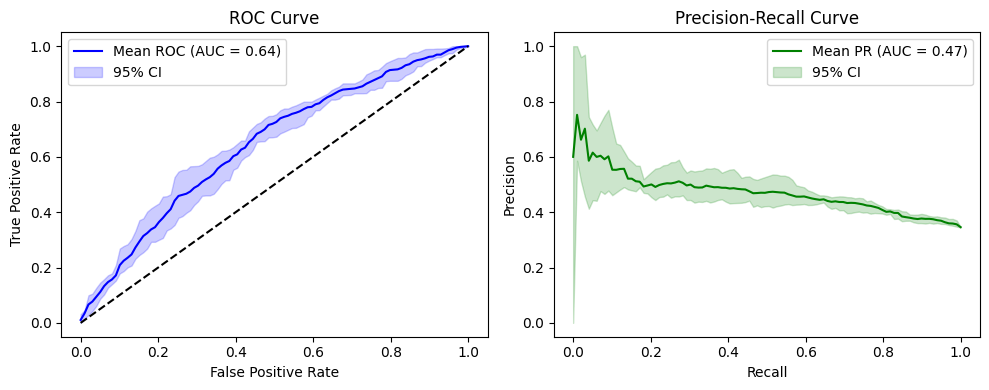


[SHAP] Generating SHAP beeswarm plot for best fold...


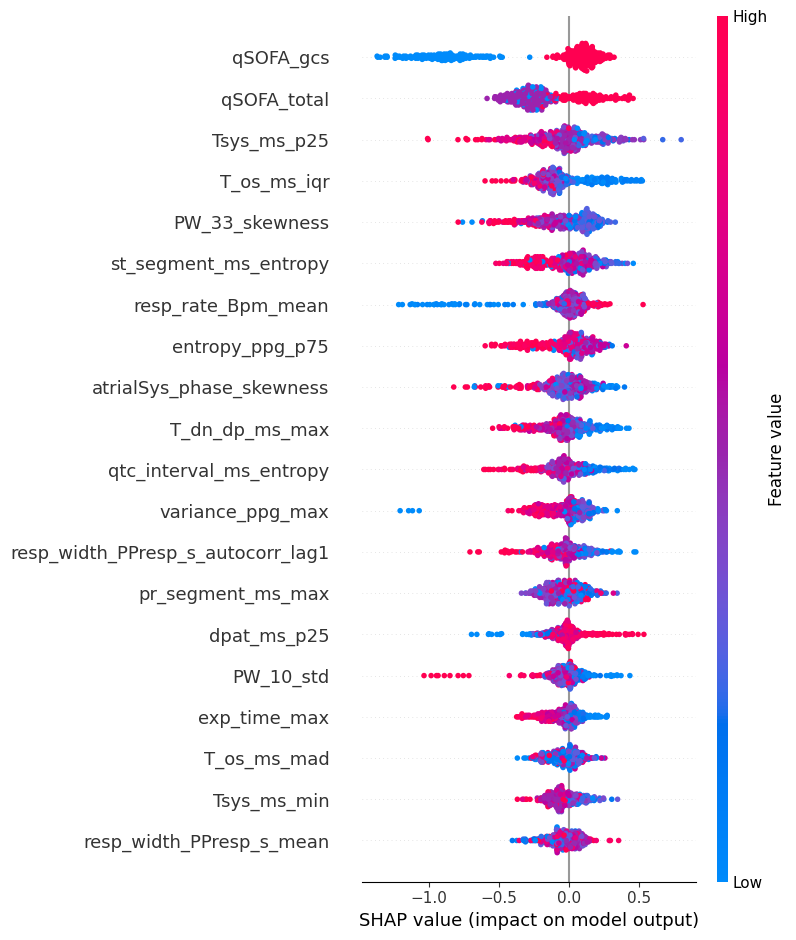

In [37]:
df_feature_wTarget=Block_STO_prediction_anyFeature(df=x1.copy(), eventXdays_postS3onset='v1', feature_win = ('T_rr_ms_mean','Death28'))

================== PREDICTION OF ss2 WITH 1hr DATA ==================
Top selected features:
1hr_LFA_0      0.030990
1hr_CTP_3-1    0.022055
1hr_CTP_1-3    0.021176
1hr_FreqN_2    0.016490
1hr_STP_2-2    0.008206
1hr_Ent        0.007654
1hr_CTP_0-2    0.005025
1hr_FreqN_0   -0.000016
1hr_CTP_3-2   -0.010343
dtype: float64


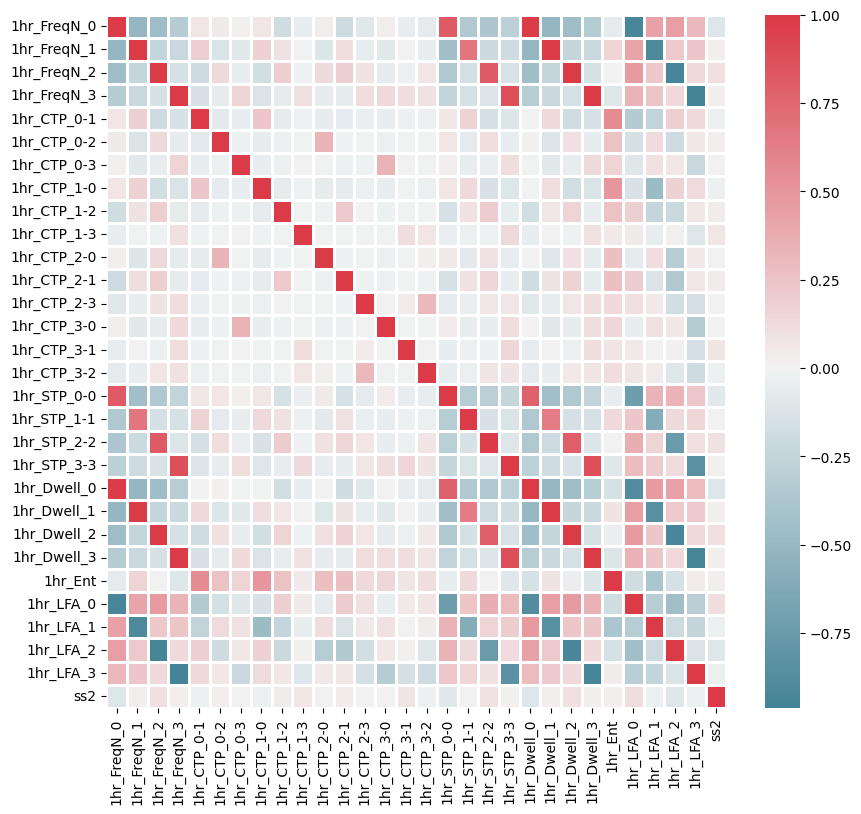

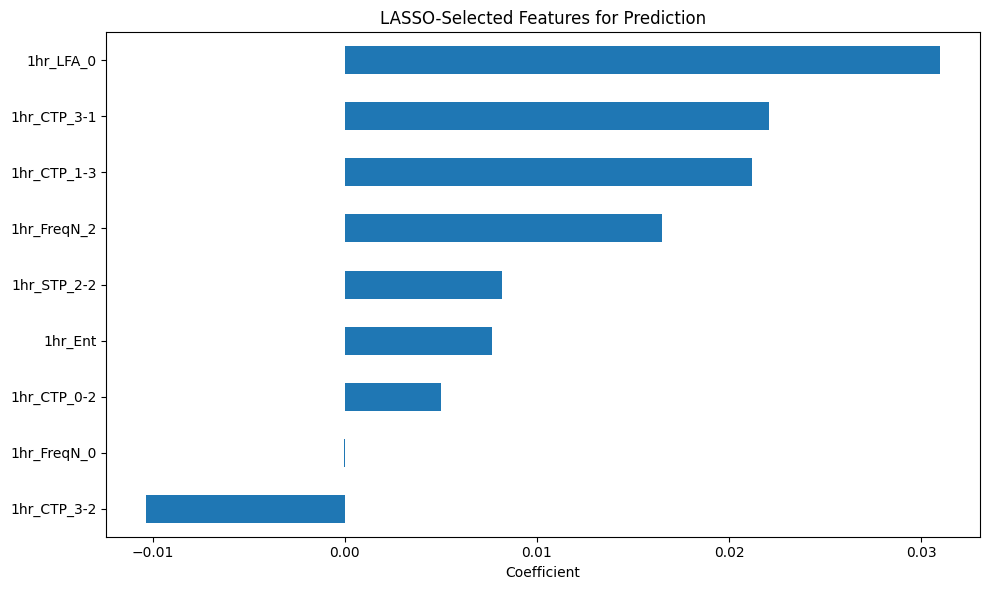

================== FS: With LASSO SELECTED FEATURES ==================

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.295 ± 0.023
precision : 0.228 ± 0.007
recall    : 0.864 ± 0.021
f1        : 0.361 ± 0.010
roc_auc   : 0.545 ± 0.014
pr_auc    : 0.268 ± 0.020


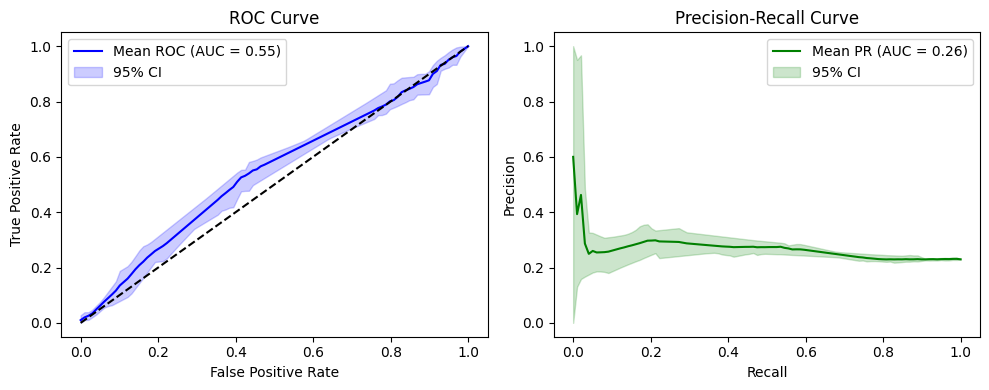


[SHAP] Generating SHAP beeswarm plot for best fold...


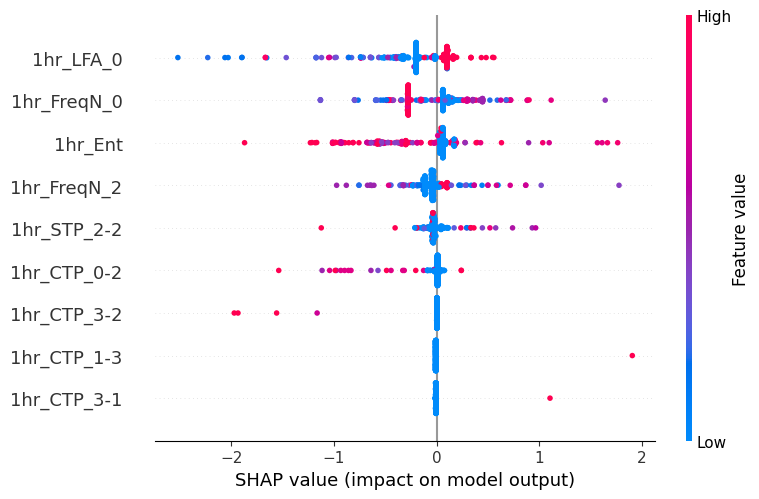

In [30]:
df_feature_wTarget=Block_STO_prediction_phenotypicFeature(df=df_input1, block_duration='1hr', eventXdays_postS3onset='ss2', df_origin=df_Sepsis_latest_wTarget.copy())

================== PREDICTION OF Death28 WITH 1hr DATA ==================
Top selected features:
1hr_CTP_3-1    0.004552
1hr_STP_2-2    0.002982
1hr_Dwell_2    0.002847
1hr_FreqN_0   -0.010228
1hr_Dwell_0   -0.011205
dtype: float64


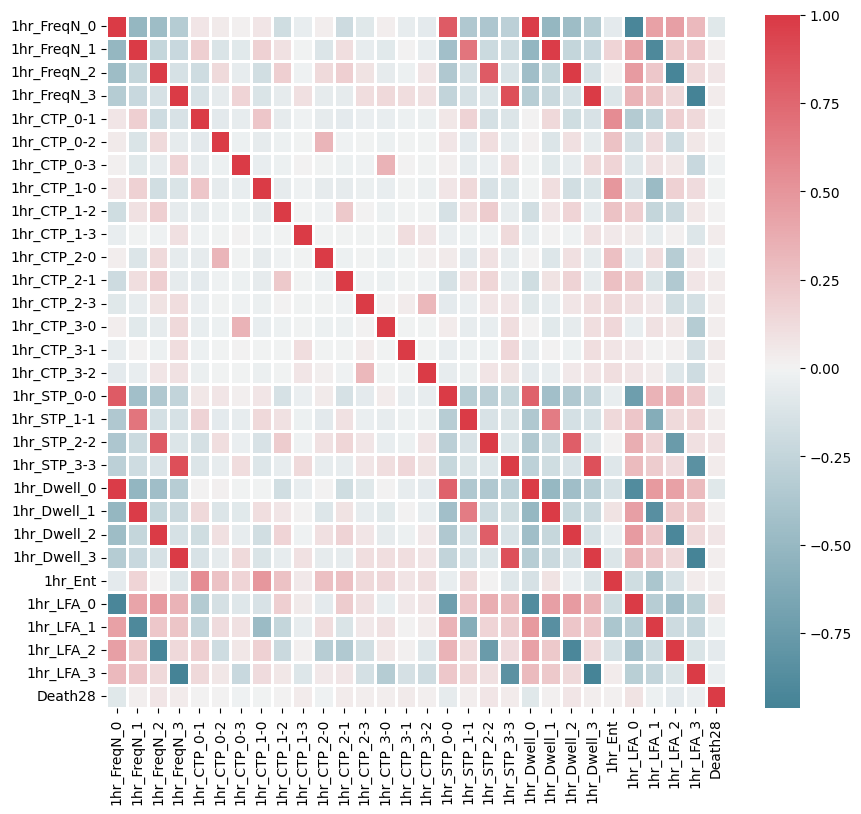

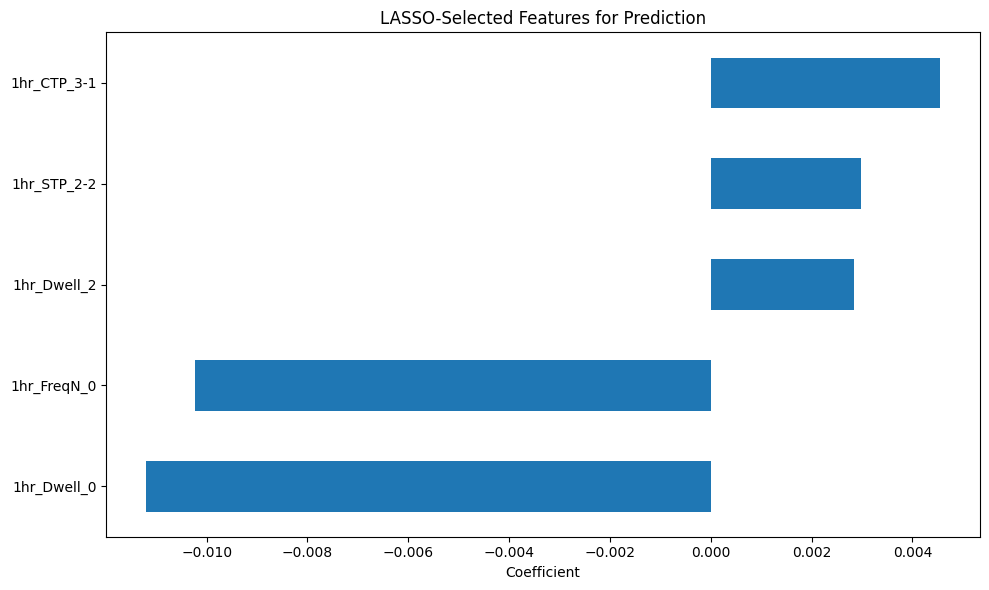

================== FS: With LASSO SELECTED FEATURES ==================

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.277 ± 0.006
precision : 0.207 ± 0.006
recall    : 0.882 ± 0.038
f1        : 0.335 ± 0.011
roc_auc   : 0.527 ± 0.040
pr_auc    : 0.229 ± 0.025


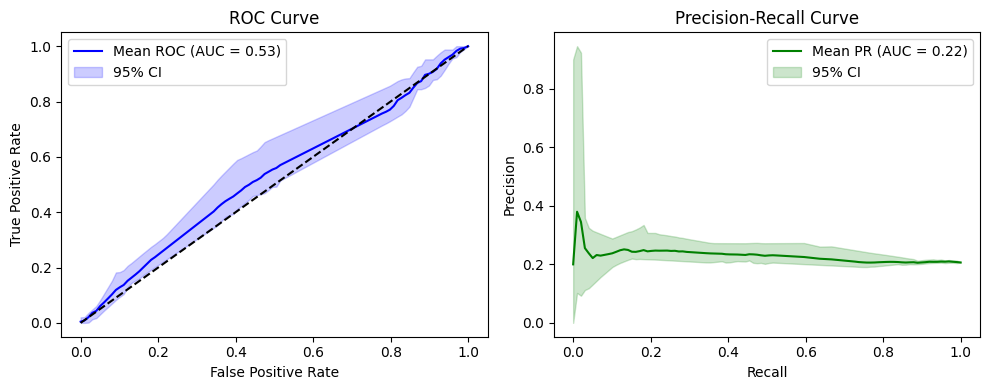


[SHAP] Generating SHAP beeswarm plot for best fold...


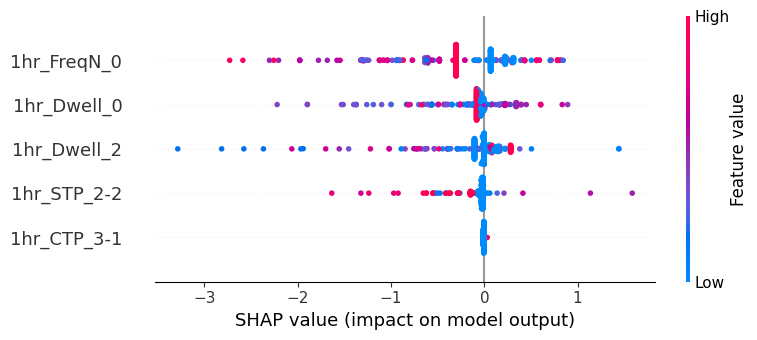

In [36]:
df_feature_wTarget=Block_STO_prediction_phenotypicFeature(df=df_input1, block_duration='1hr', eventXdays_postS3onset='Death28', df_origin=df_Sepsis_latest_wTarget.copy())

In [ ]:
_=Block_event_regression_anyFeature(df=x1.copy(), event_name='vpfd2', feature_win = ('ppg_class','Death28'))

In [1]:
df_feature_wTarget=Block_STO_prediction_phenotypicFeature(df=df_input1, block_duration='1hr', eventXdays_postS3onset='ss28', df_origin=df_Sepsis_latest_wTarget.copy())

NameError: name 'Block_STO_prediction_phenotypicFeature' is not defined

============== PREDICTION OF 7-DAY VPFD WITH 1hr DATA ==============
Top selected features:
PaO2                   0.107580
Platelets              0.050517
Bicarb                 0.017413
Neut_perc              0.010118
1hr_Dwell_1            0.006437
1hr_CTP_1-0            0.005958
1hr_CTP_2-1            0.004492
BaseDeficitArterial   -0.009987
WBC                   -0.011364
Bilirubin_total       -0.015028
1hr_CTP_1-3           -0.027513
age                   -0.062989
PT                    -0.067399
AST                   -0.104846
BUN                   -0.117438
dtype: float64


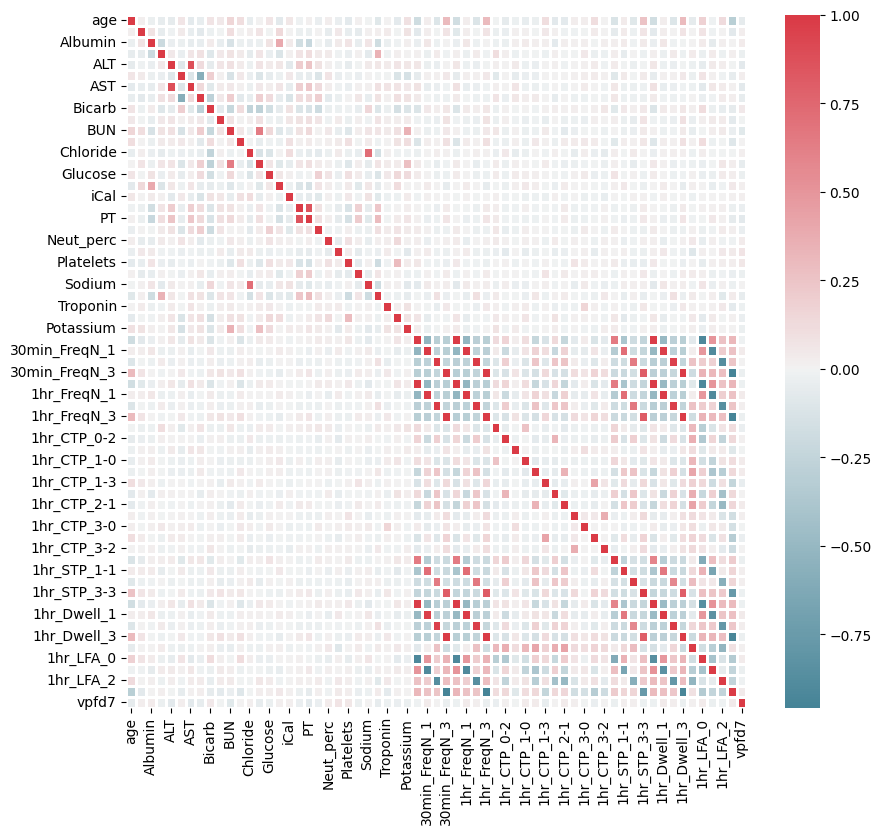

<Figure size 640x480 with 0 Axes>

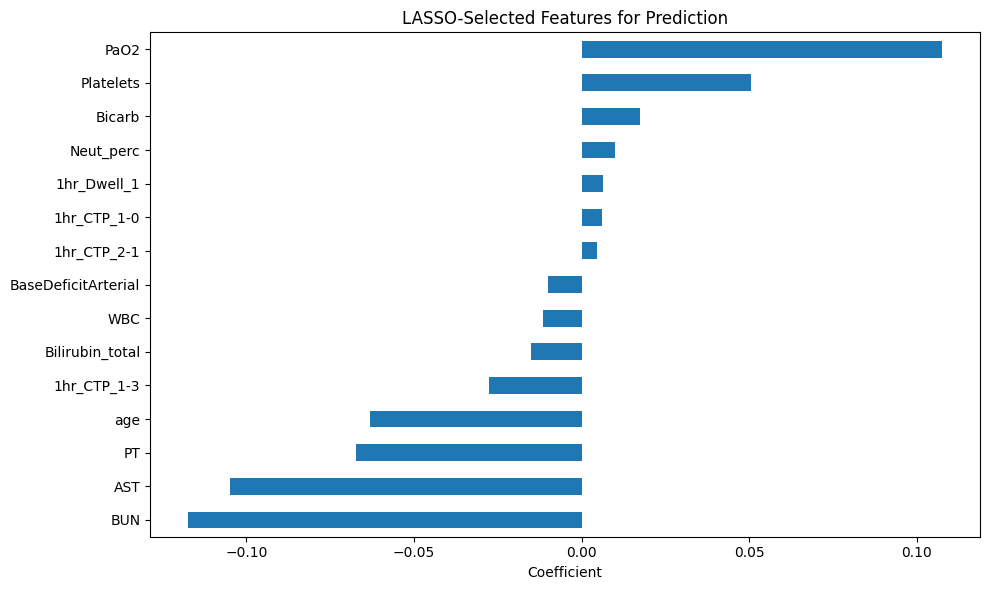

================== FS: With LASSO SELECTED FEATURES ==================
MAE: 2.82, R²: 0.00, Pearson Corr: 0.12
[SHAP] Computing SHAP values...


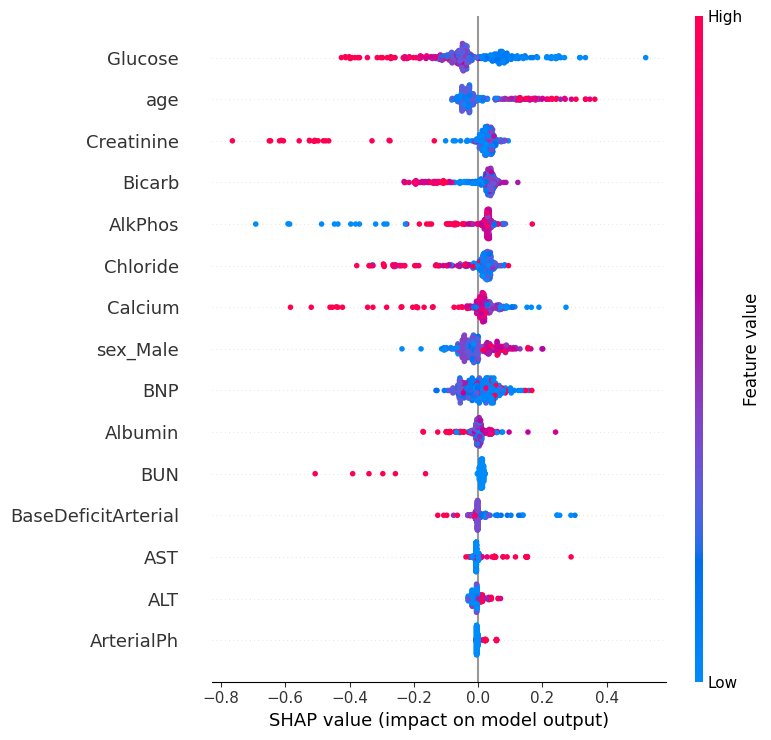

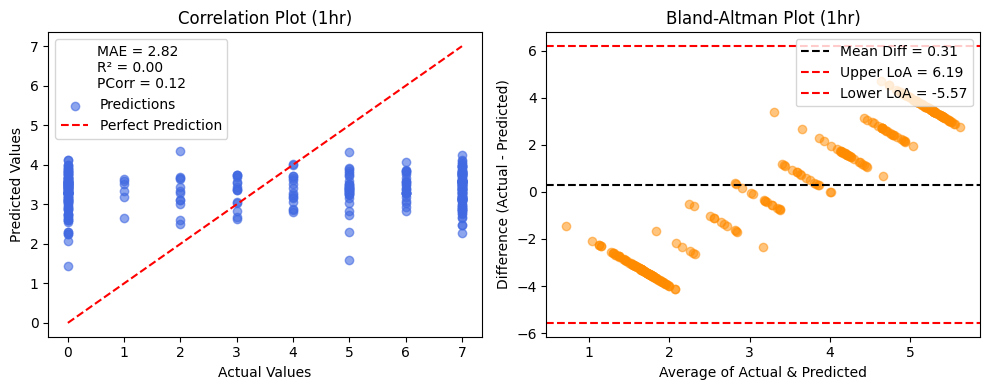

In [264]:
_=Block_event_regression_phenotypicFeature(df=df_input1, block_duration='1hr',event_name='vpfd7',df_origin=df_Sepsis_latest_wTarget.copy())

================== PREDICTION OF 28-DAY MORTALITY WITH 15min DATA ==================
D28:  Death28
0    1957
1     228
Name: count, dtype: int64

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.493 ± 0.086
precision : 0.104 ± 0.013
recall    : 0.500 ± 0.106
f1        : 0.171 ± 0.020
roc_auc   : 0.513 ± 0.052
pr_auc    : 0.110 ± 0.011


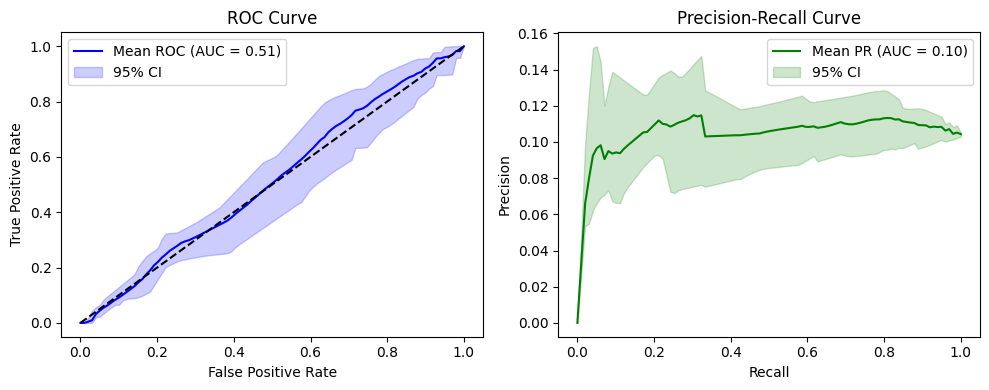


[SHAP] Generating SHAP beeswarm plot for best fold...


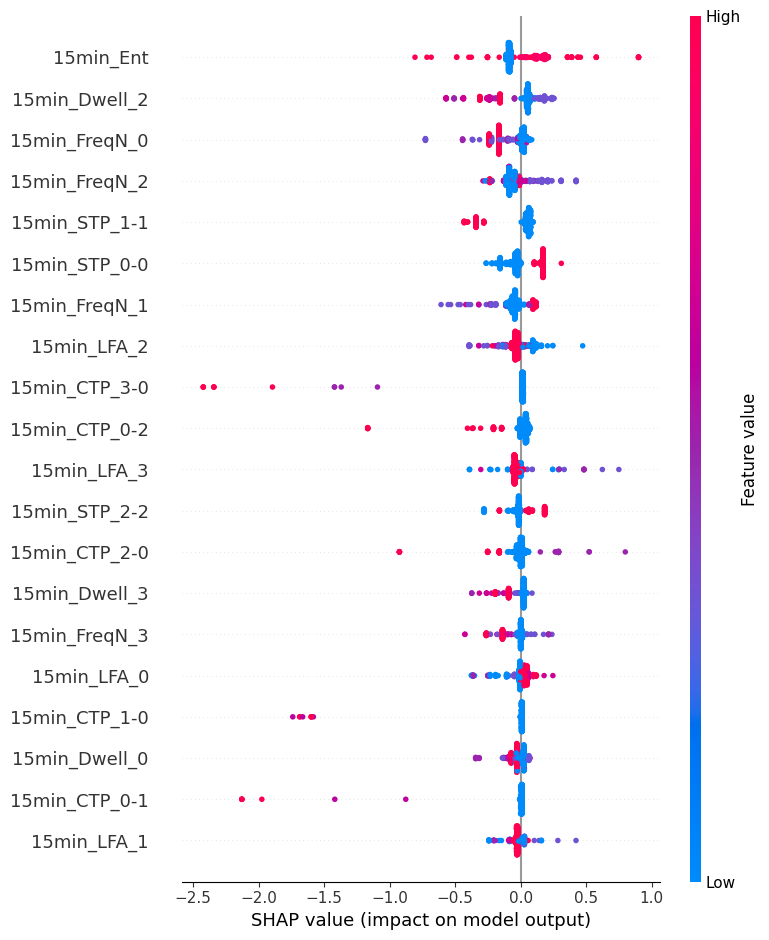

================== PREDICTION OF 28-DAY MORTALITY WITH 30min DATA ==================
D28:  Death28
0    1957
1     228
Name: count, dtype: int64

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.590 ± 0.112
precision : 0.093 ± 0.025
recall    : 0.312 ± 0.106
f1        : 0.139 ± 0.027
roc_auc   : 0.486 ± 0.087
pr_auc    : 0.125 ± 0.034


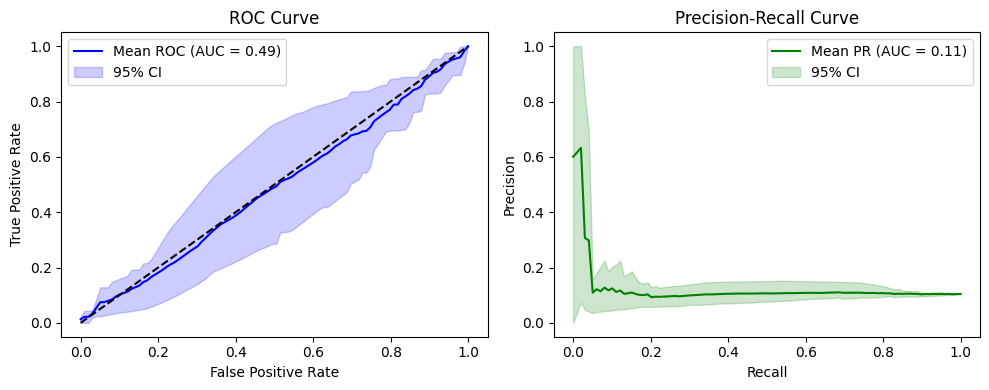


[SHAP] Generating SHAP beeswarm plot for best fold...


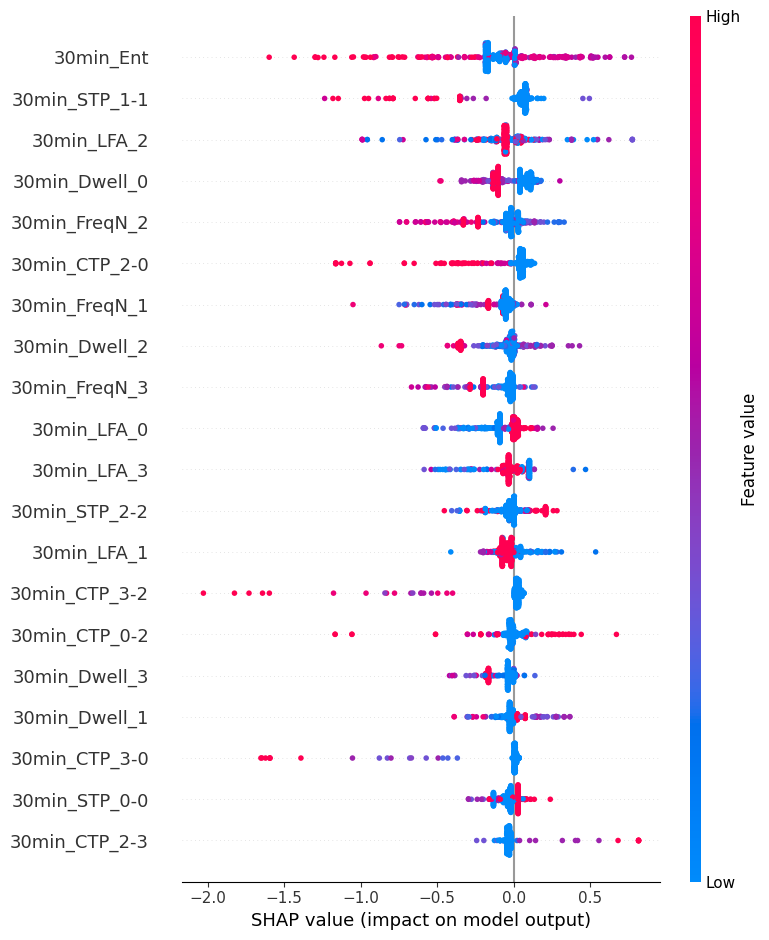

================== PREDICTION OF 28-DAY MORTALITY WITH 1hr DATA ==================
D28:  Death28
0    1957
1     228
Name: count, dtype: int64

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.673 ± 0.106
precision : 0.094 ± 0.030
recall    : 0.211 ± 0.033
f1        : 0.126 ± 0.030
roc_auc   : 0.488 ± 0.089
pr_auc    : 0.113 ± 0.023


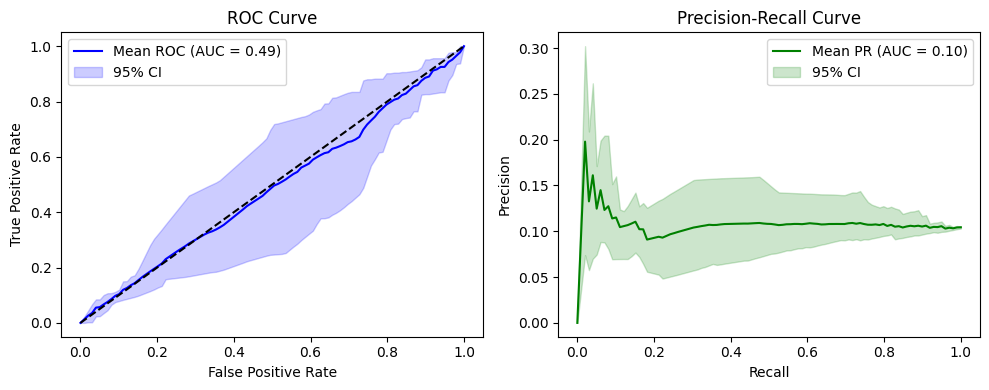


[SHAP] Generating SHAP beeswarm plot for best fold...


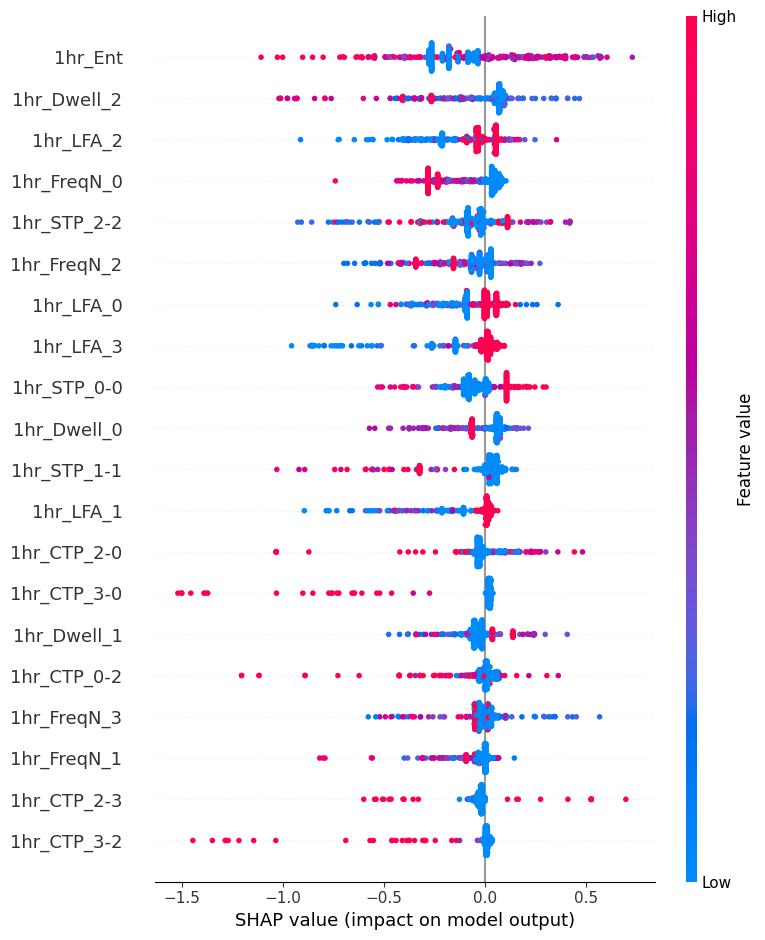

================== PREDICTION OF 28-DAY MORTALITY WITH 3hr DATA ==================
D28:  Death28
0    1957
1     228
Name: count, dtype: int64

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.674 ± 0.100
precision : 0.092 ± 0.022
recall    : 0.215 ± 0.054
f1        : 0.124 ± 0.021
roc_auc   : 0.476 ± 0.076
pr_auc    : 0.108 ± 0.018


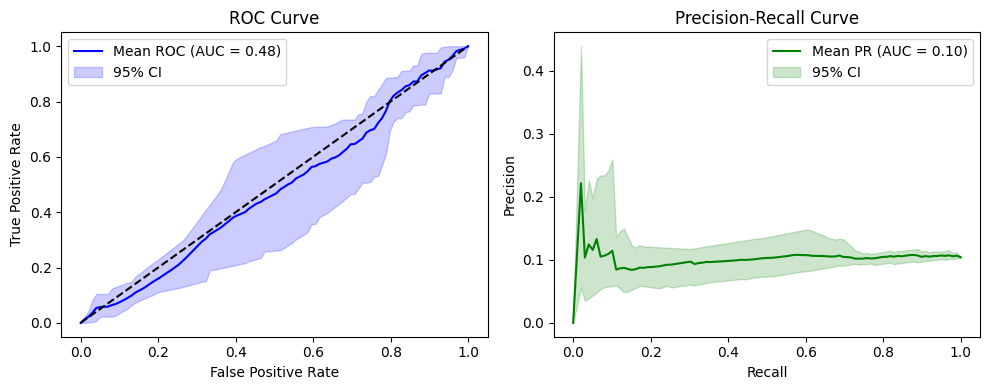


[SHAP] Generating SHAP beeswarm plot for best fold...


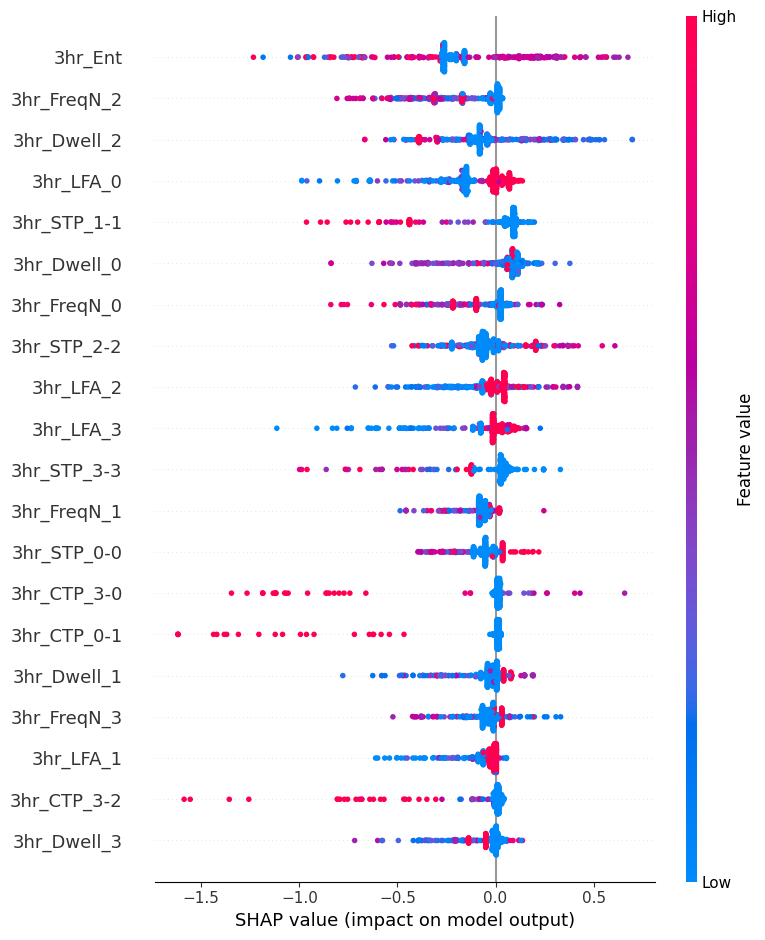

================== PREDICTION OF 28-DAY MORTALITY WITH 6hr DATA ==================
D28:  Death28
0    1957
1     228
Name: count, dtype: int64

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.677 ± 0.104
precision : 0.094 ± 0.028
recall    : 0.210 ± 0.052
f1        : 0.125 ± 0.026
roc_auc   : 0.480 ± 0.086
pr_auc    : 0.113 ± 0.029


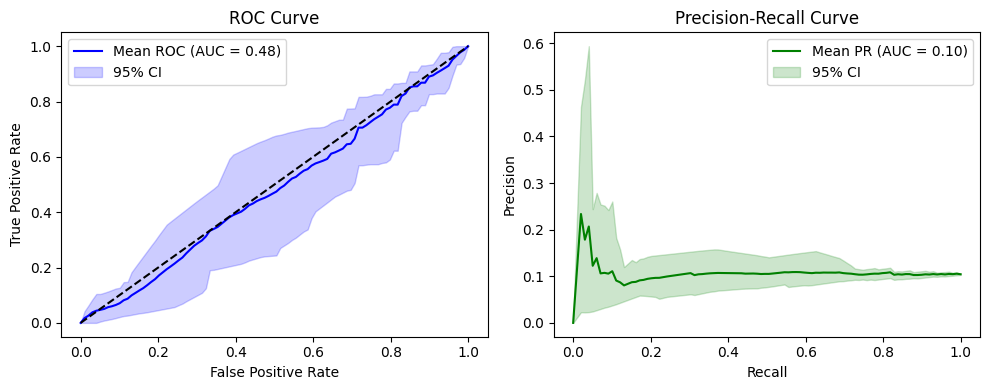


[SHAP] Generating SHAP beeswarm plot for best fold...


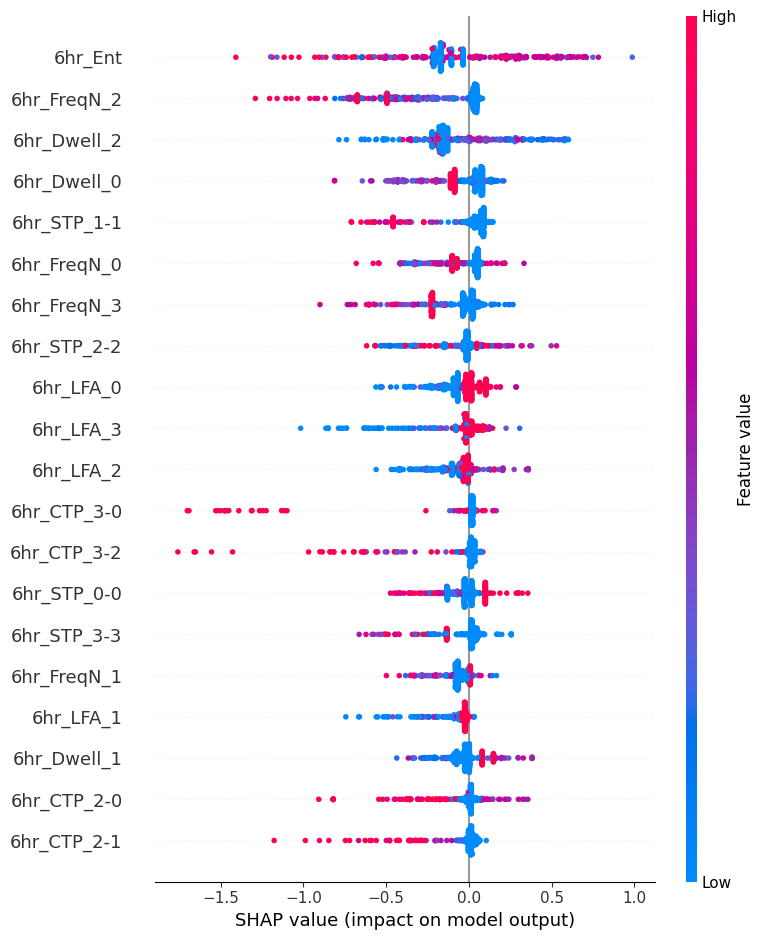

In [7]:
# Short term mortality 28d

_=Block_STM_prediction(df=df_allFIN.copy(), block_duration='15min', Xdays_postS3onset=28, df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_STM_prediction(df=df_allFIN.copy(), block_duration='30min', Xdays_postS3onset=28, df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_STM_prediction(df=df_allFIN.copy(), block_duration='1hr', Xdays_postS3onset=28, df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_STM_prediction(df=df_allFIN.copy(), block_duration='3hr', Xdays_postS3onset=28, df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_STM_prediction(df=df_allFIN.copy(), block_duration='6hr', Xdays_postS3onset=28, df_origin=df_Sepsis_latest_wTarget.copy())

PREDICTION OF 7-DAY MORTALITY WITH 15min DATA

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.628 ± 0.068
precision : 0.037 ± 0.009
recall    : 0.305 ± 0.084
f1        : 0.066 ± 0.015
roc_auc   : 0.490 ± 0.043
pr_auc    : 0.047 ± 0.005


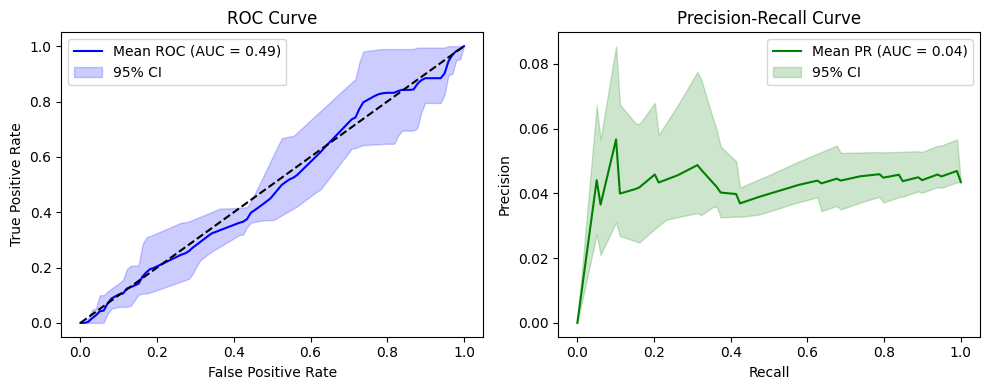


[SHAP] Generating SHAP beeswarm plot for best fold...


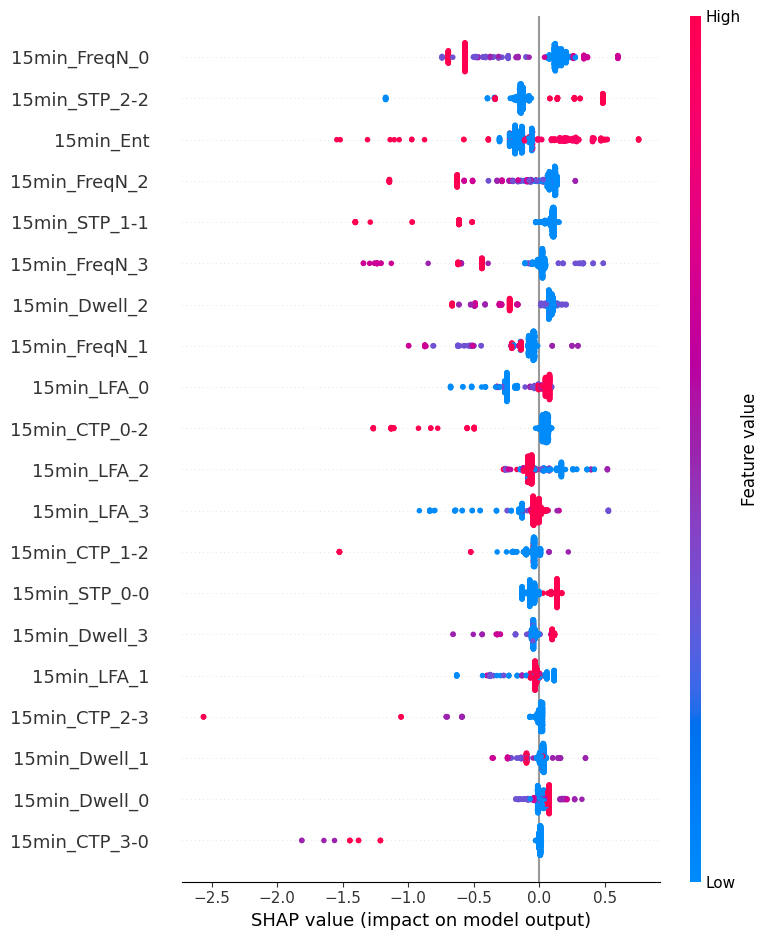

PREDICTION OF 7-DAY MORTALITY WITH 30min DATA

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.718 ± 0.050
precision : 0.035 ± 0.012
recall    : 0.211 ± 0.100
f1        : 0.059 ± 0.022
roc_auc   : 0.515 ± 0.078
pr_auc    : 0.059 ± 0.024


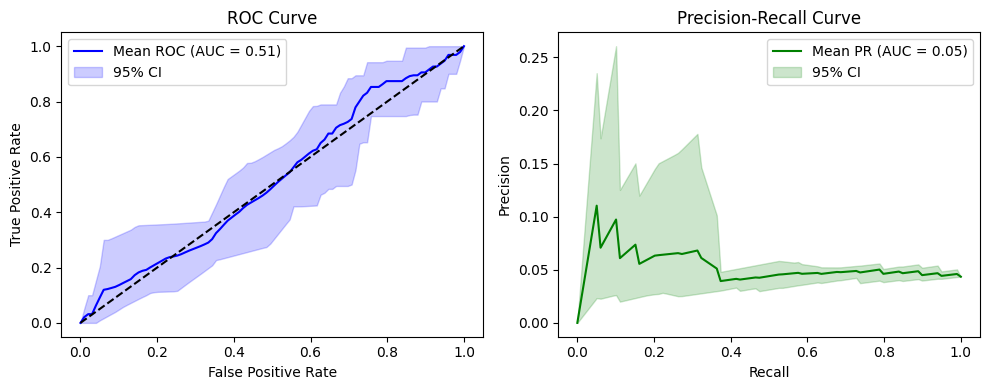


[SHAP] Generating SHAP beeswarm plot for best fold...


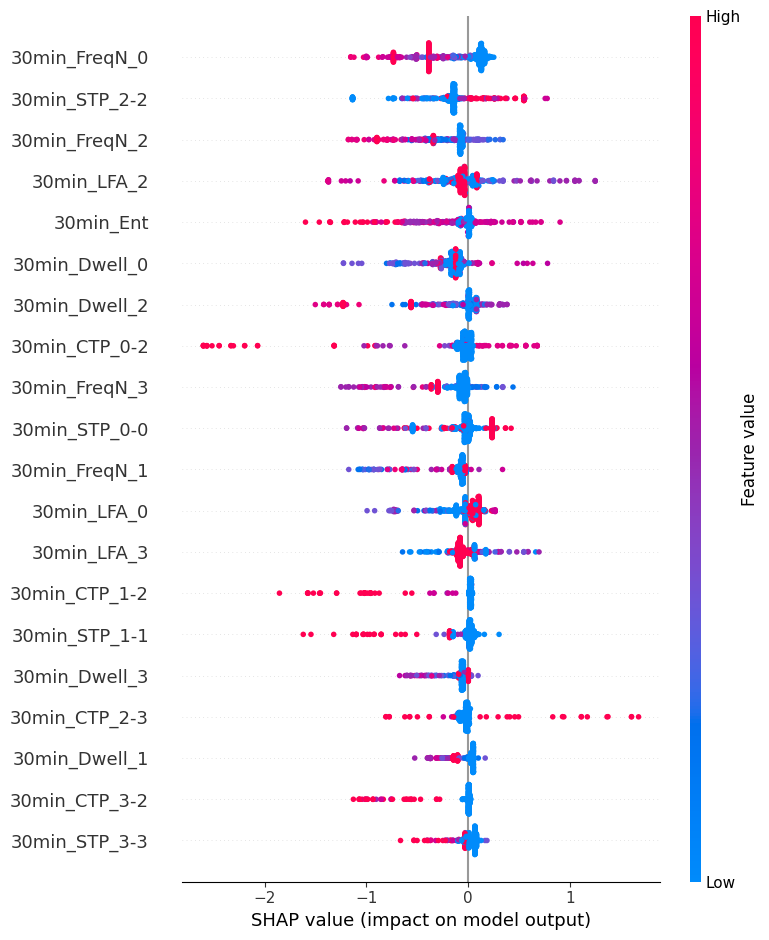

PREDICTION OF 7-DAY MORTALITY WITH 1hr DATA

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.773 ± 0.044
precision : 0.037 ± 0.012
recall    : 0.168 ± 0.077
f1        : 0.060 ± 0.020
roc_auc   : 0.497 ± 0.072
pr_auc    : 0.075 ± 0.049


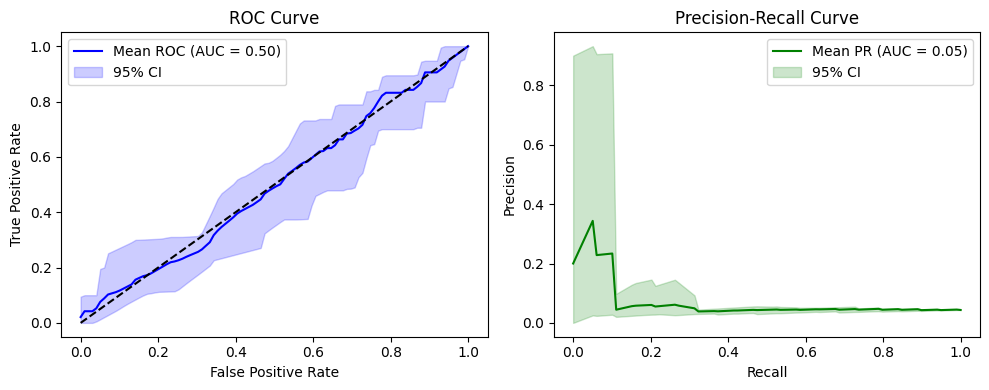


[SHAP] Generating SHAP beeswarm plot for best fold...


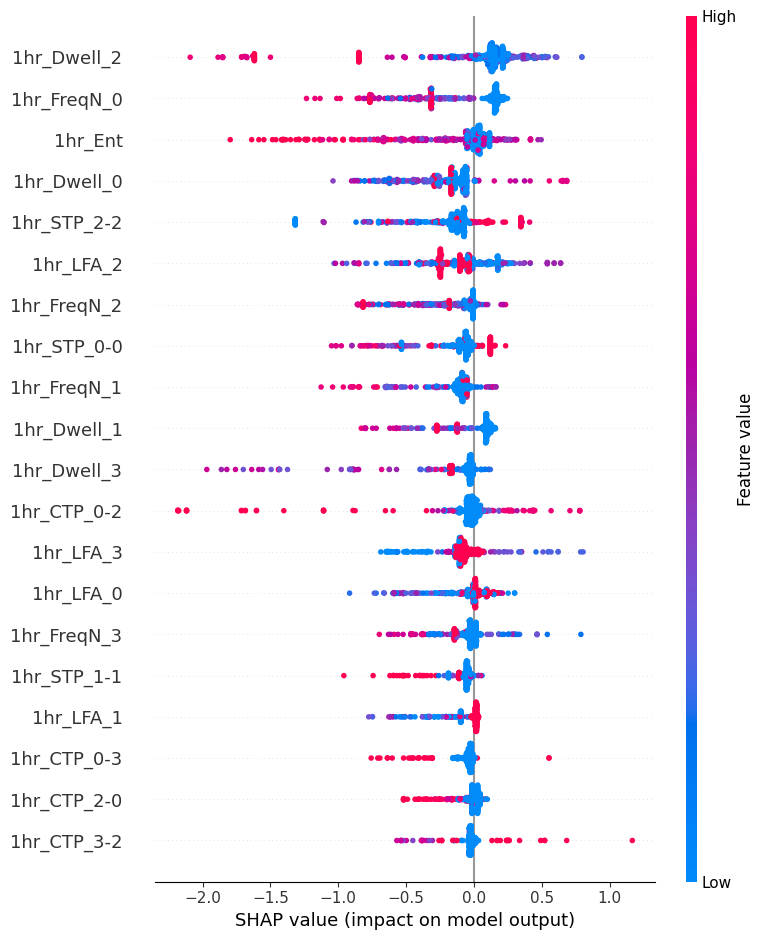

PREDICTION OF 7-DAY MORTALITY WITH 3hr DATA

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.736 ± 0.093
precision : 0.039 ± 0.011
recall    : 0.211 ± 0.088
f1        : 0.065 ± 0.018
roc_auc   : 0.520 ± 0.063
pr_auc    : 0.070 ± 0.035


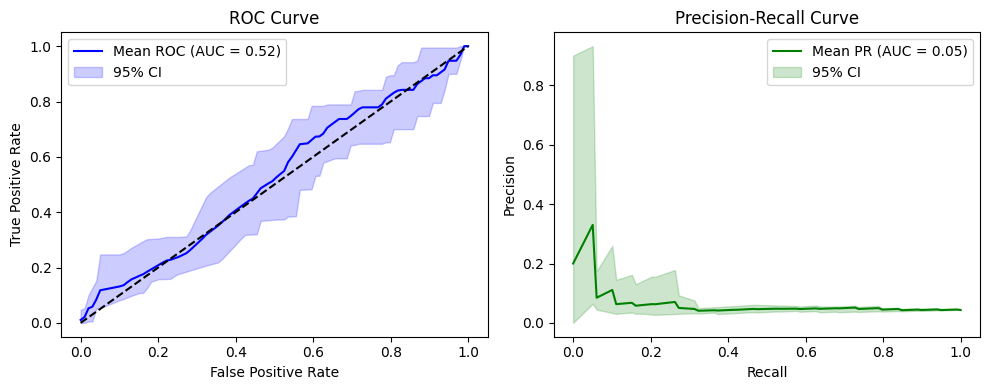


[SHAP] Generating SHAP beeswarm plot for best fold...


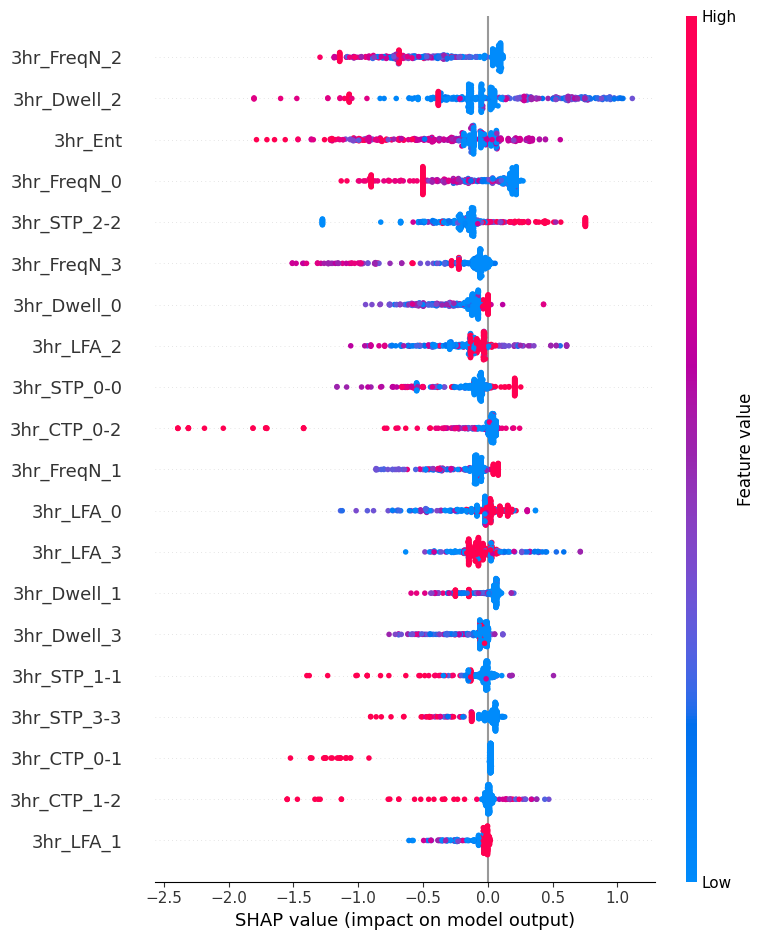

PREDICTION OF 7-DAY MORTALITY WITH 6hr DATA

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.728 ± 0.105
precision : 0.032 ± 0.014
recall    : 0.179 ± 0.098
f1        : 0.054 ± 0.023
roc_auc   : 0.506 ± 0.065
pr_auc    : 0.063 ± 0.029


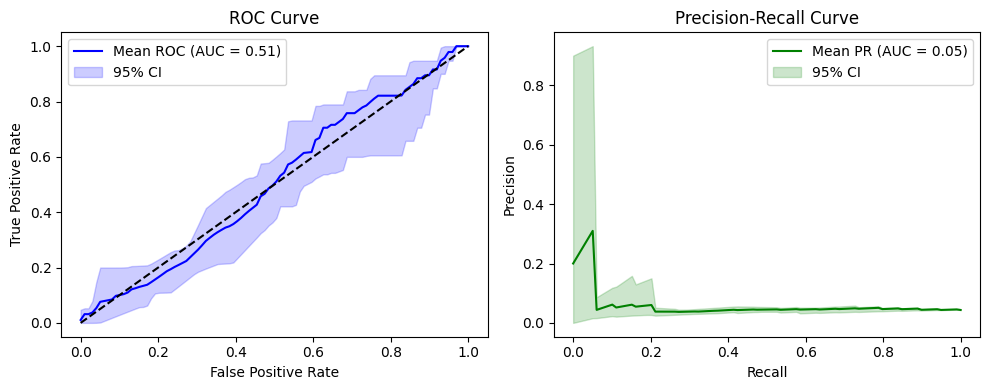


[SHAP] Generating SHAP beeswarm plot for best fold...


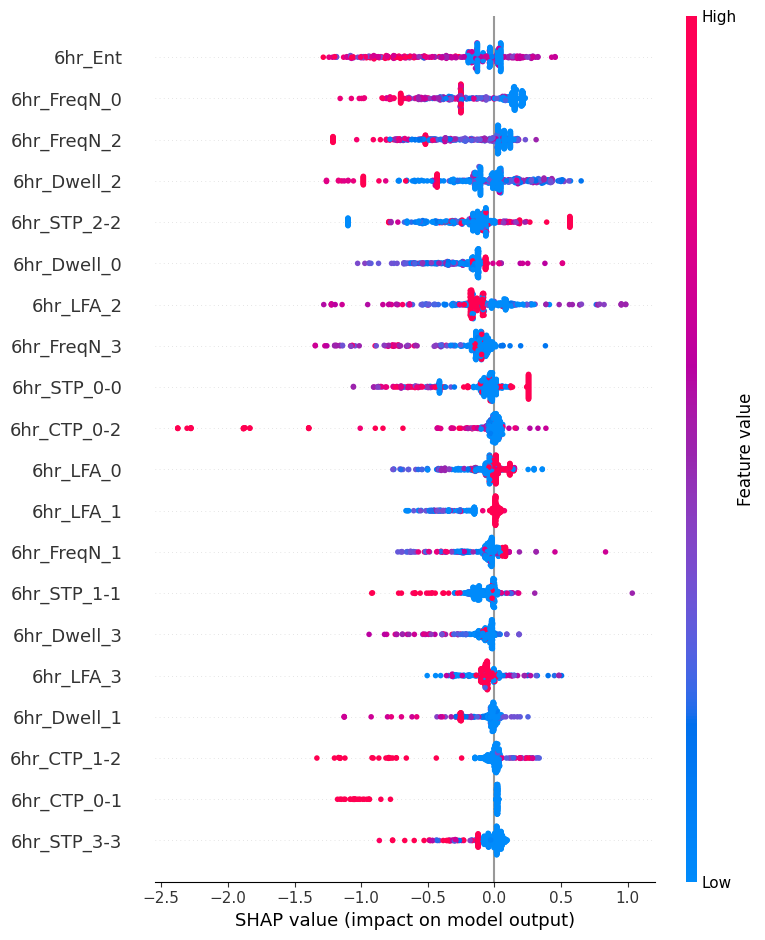

In [75]:
# Short term mortality 7d

_=Block_STM_prediction(df=df_allFIN.copy(), block_duration='15min', Xdays_postS3onset=7)
_=Block_STM_prediction(df=df_allFIN.copy(), block_duration='30min', Xdays_postS3onset=7)
_=Block_STM_prediction(df=df_allFIN.copy(), block_duration='1hr', Xdays_postS3onset=7)
_=Block_STM_prediction(df=df_allFIN.copy(), block_duration='3hr', Xdays_postS3onset=7)
_=Block_STM_prediction(df=df_allFIN.copy(), block_duration='6hr', Xdays_postS3onset=7)

PREDICTION OF 2-DAY MORTALITY WITH 15min DATA

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.708 ± 0.057
precision : 0.023 ± 0.005
recall    : 0.379 ± 0.095
f1        : 0.042 ± 0.009
roc_auc   : 0.558 ± 0.062
pr_auc    : 0.027 ± 0.005


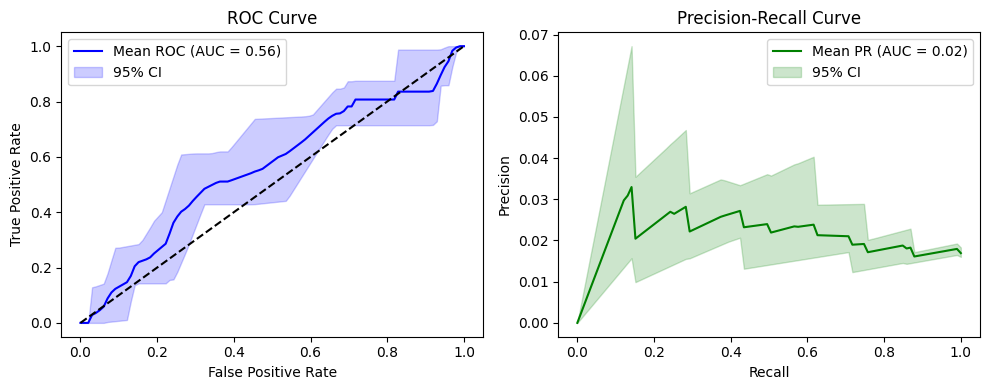


[SHAP] Generating SHAP beeswarm plot for best fold...


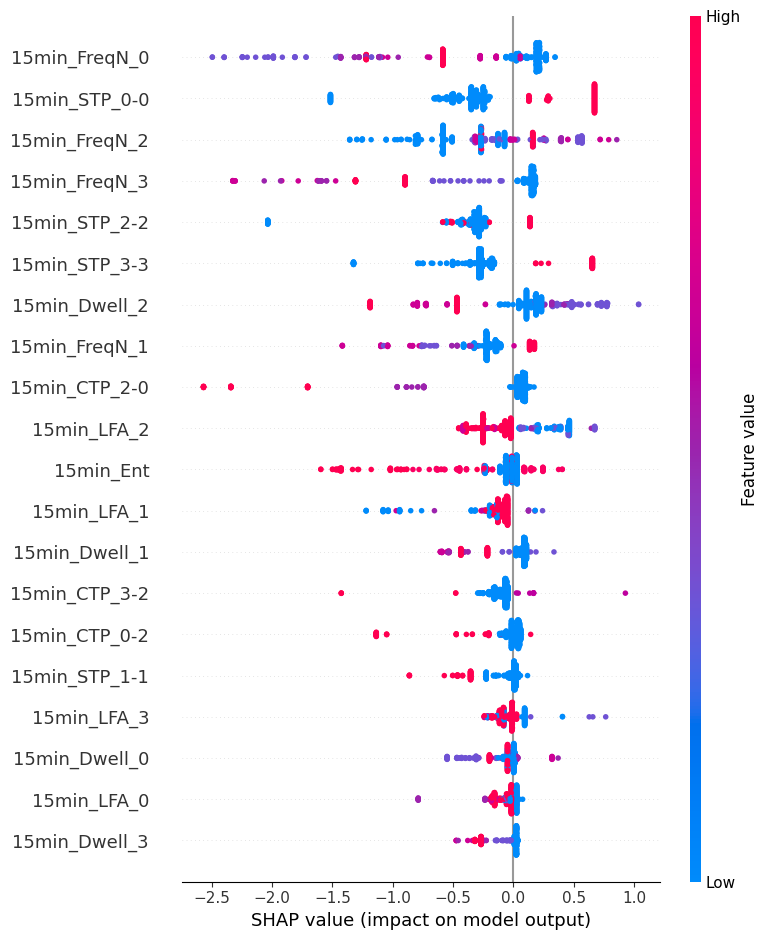

PREDICTION OF 2-DAY MORTALITY WITH 30min DATA

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.796 ± 0.028
precision : 0.021 ± 0.017
recall    : 0.232 ± 0.180
f1        : 0.039 ± 0.031
roc_auc   : 0.514 ± 0.127
pr_auc    : 0.025 ± 0.008


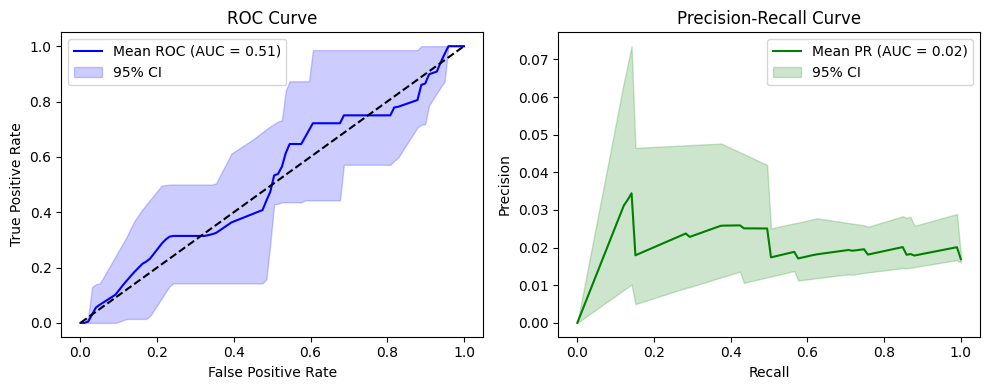


[SHAP] Generating SHAP beeswarm plot for best fold...


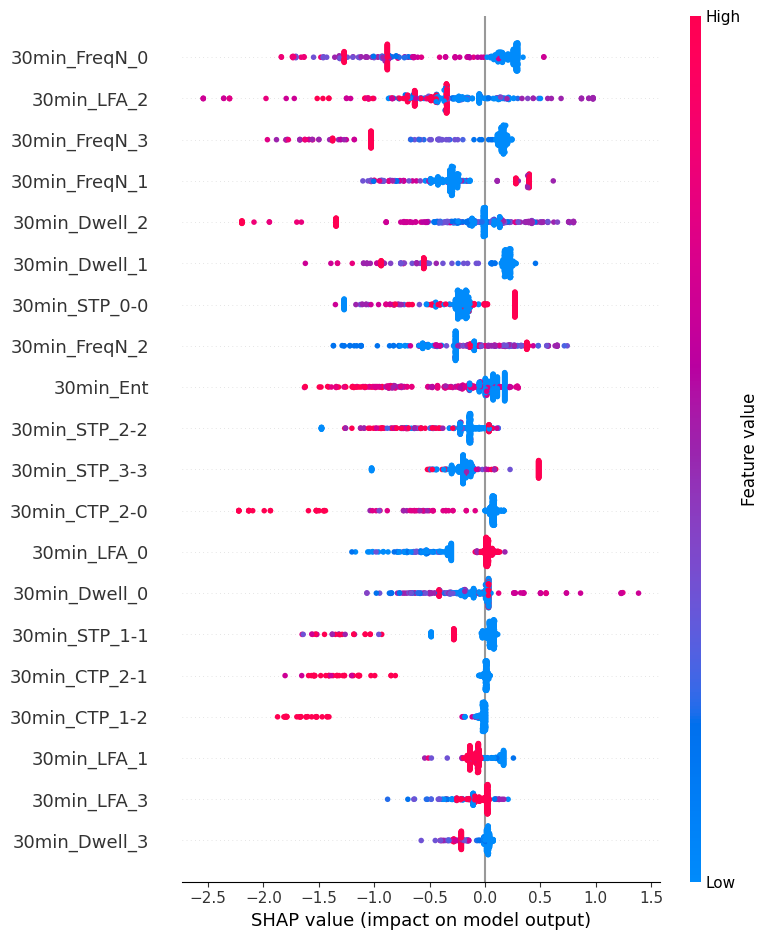

PREDICTION OF 2-DAY MORTALITY WITH 1hr DATA

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.806 ± 0.027
precision : 0.022 ± 0.019
recall    : 0.232 ± 0.180
f1        : 0.041 ± 0.034
roc_auc   : 0.496 ± 0.145
pr_auc    : 0.026 ± 0.010


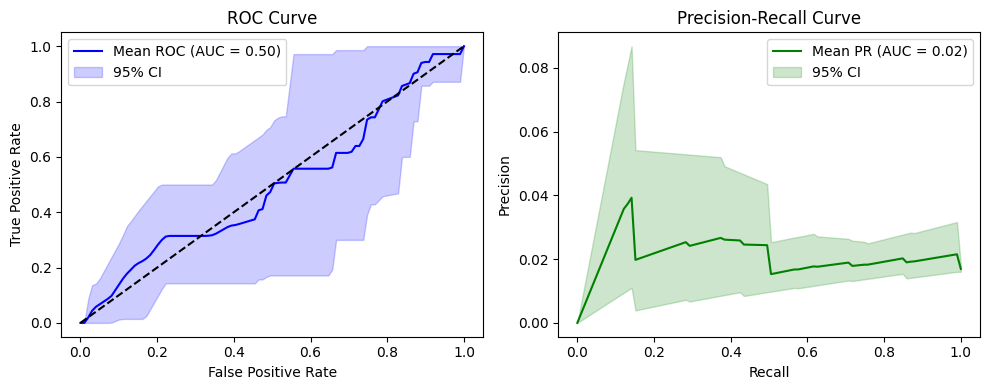


[SHAP] Generating SHAP beeswarm plot for best fold...


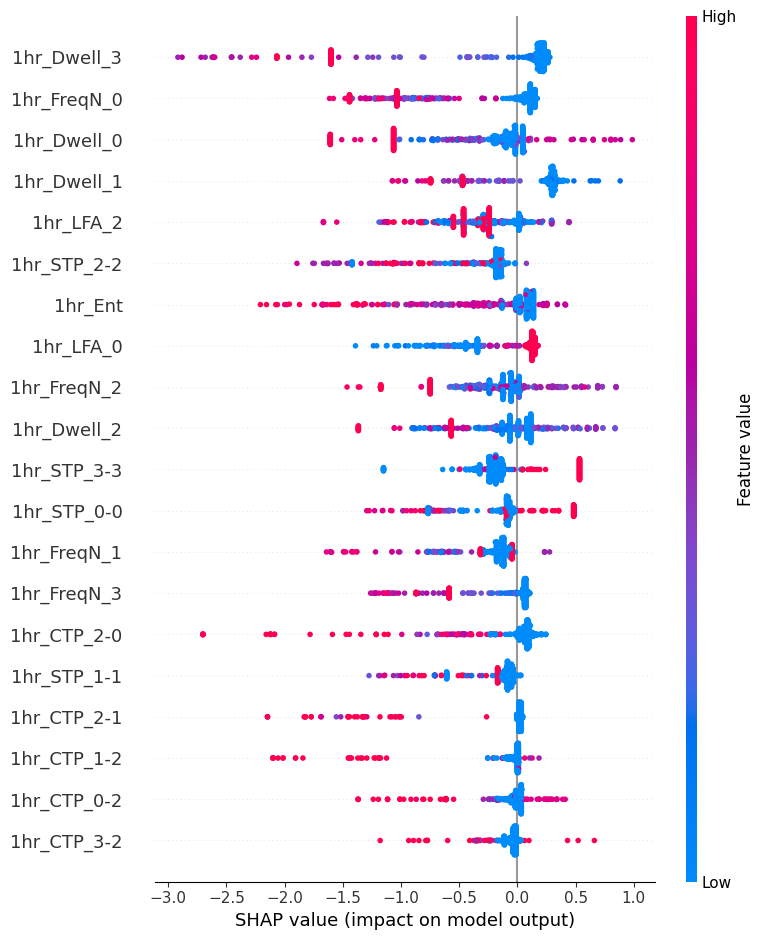

PREDICTION OF 2-DAY MORTALITY WITH 3hr DATA

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.823 ± 0.045
precision : 0.014 ± 0.017
recall    : 0.157 ± 0.183
f1        : 0.026 ± 0.032
roc_auc   : 0.483 ± 0.146
pr_auc    : 0.026 ± 0.010


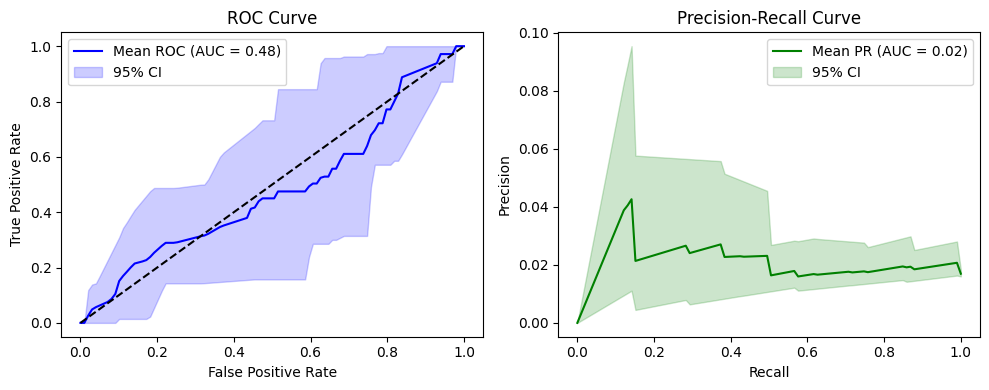


[SHAP] Generating SHAP beeswarm plot for best fold...


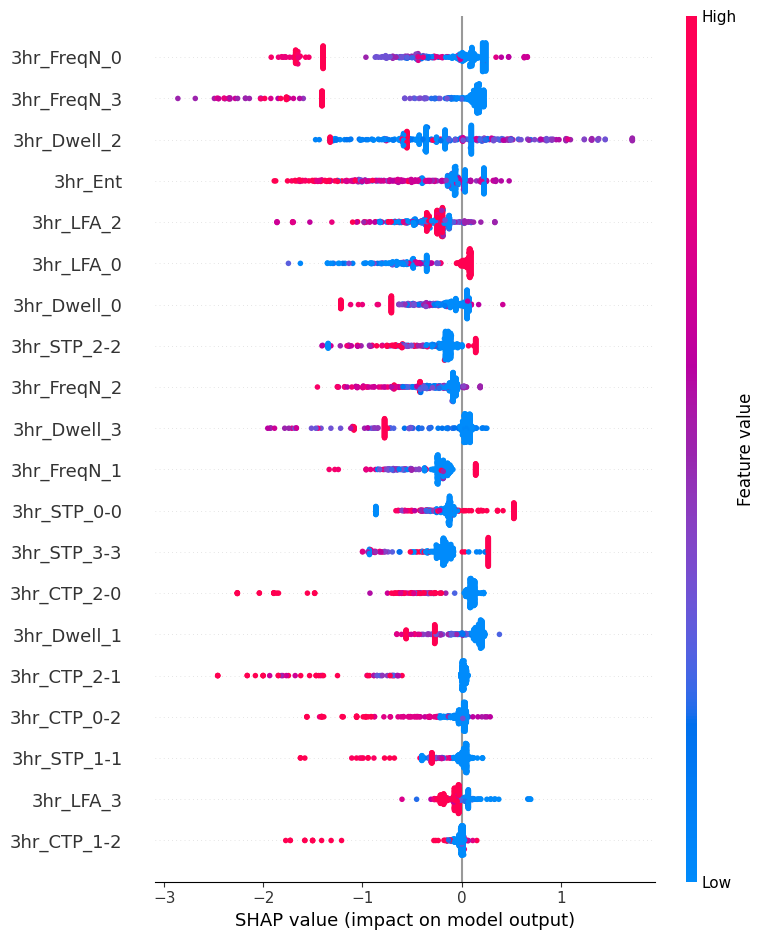

PREDICTION OF 2-DAY MORTALITY WITH 6hr DATA

[Summary] Cross-Validated Performance Metrics (mean ± std):
accuracy  : 0.818 ± 0.048
precision : 0.014 ± 0.018
recall    : 0.157 ± 0.183
f1        : 0.025 ± 0.032
roc_auc   : 0.461 ± 0.161
pr_auc    : 0.026 ± 0.012


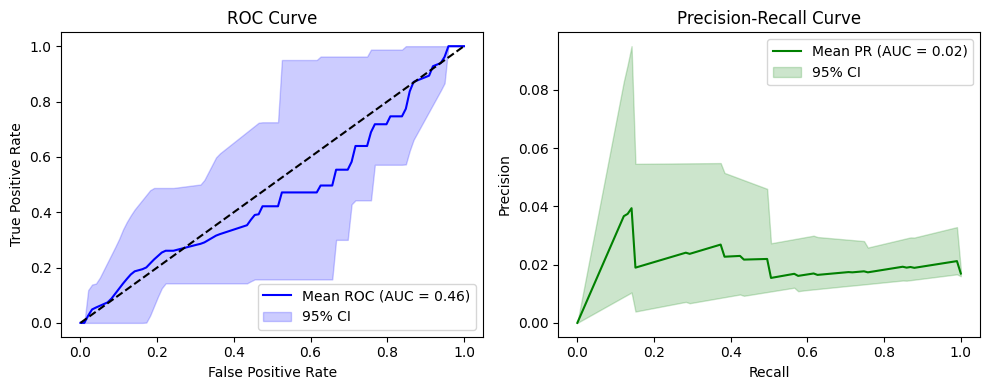


[SHAP] Generating SHAP beeswarm plot for best fold...


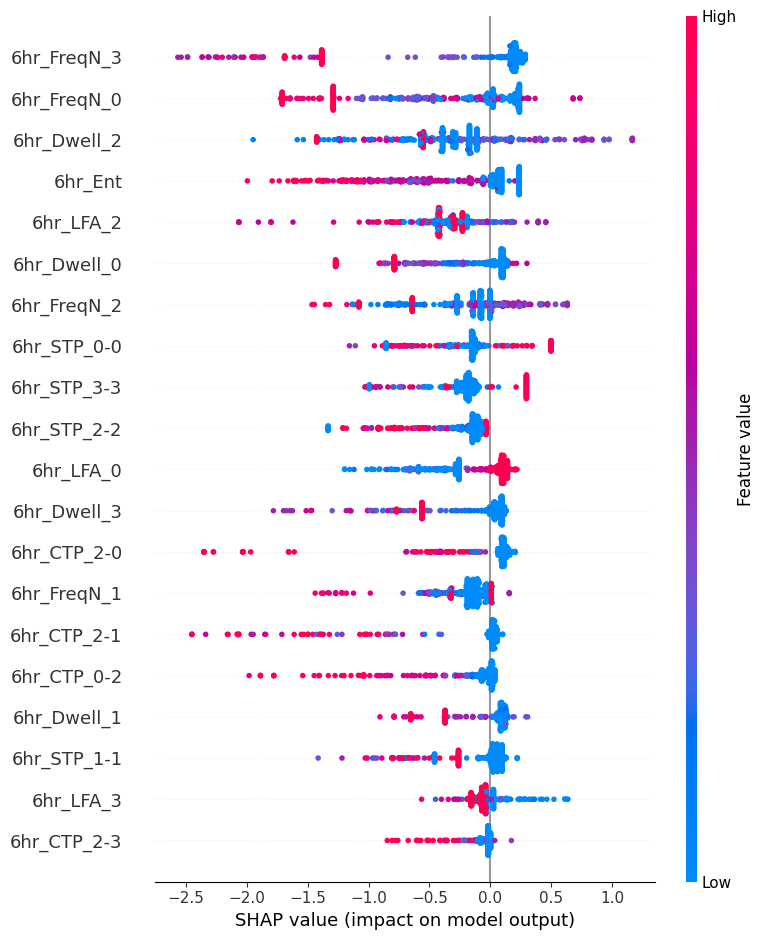

In [76]:
# Short term mortality 7d

_=Block_STM_prediction(df=df_allFIN.copy(), block_duration='15min', Xdays_postS3onset=2)
_=Block_STM_prediction(df=df_allFIN.copy(), block_duration='30min', Xdays_postS3onset=2)
_=Block_STM_prediction(df=df_allFIN.copy(), block_duration='1hr', Xdays_postS3onset=2)
_=Block_STM_prediction(df=df_allFIN.copy(), block_duration='3hr', Xdays_postS3onset=2)
_=Block_STM_prediction(df=df_allFIN.copy(), block_duration='6hr', Xdays_postS3onset=2)

## Regression

============== PREDICTION OF 28-DAY VPFD WITH 15min DATA ==============
MAE: 11.90, R²: 0.00, Pearson Corr: 0.05
[SHAP] Computing SHAP values...


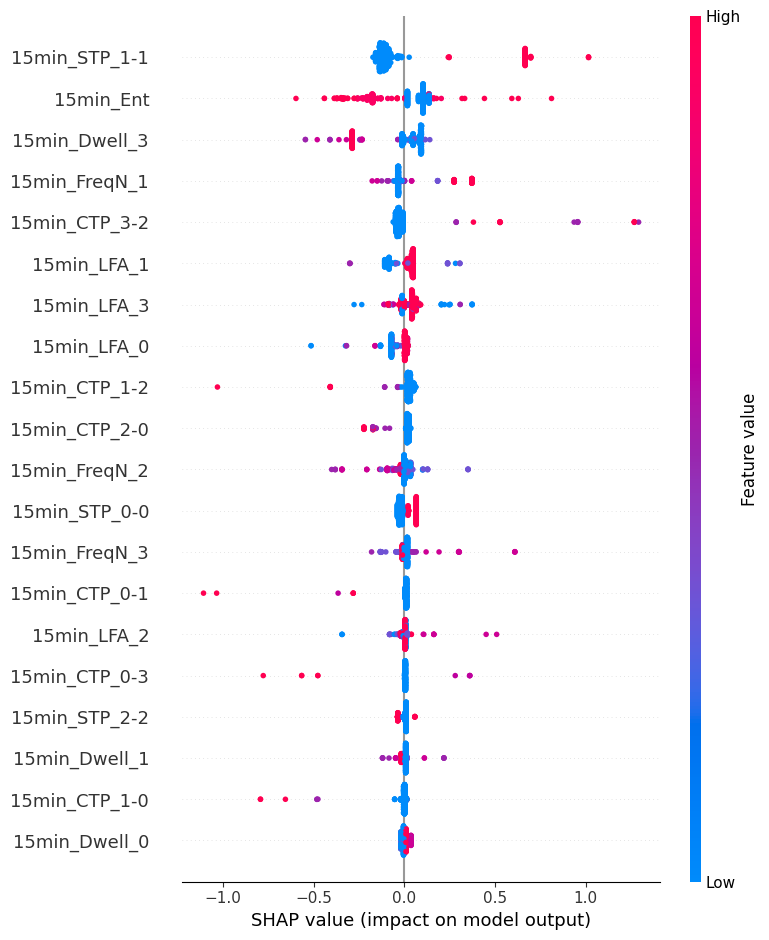

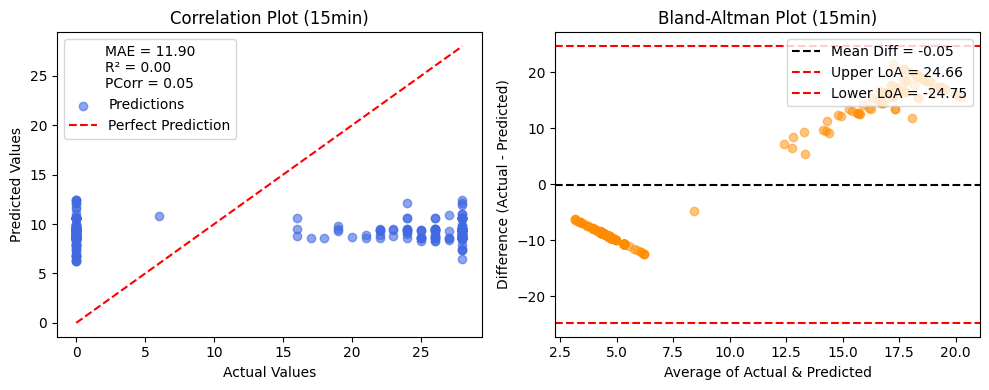

============== PREDICTION OF 28-DAY VPFD WITH 30min DATA ==============
MAE: 11.84, R²: 0.01, Pearson Corr: 0.10
[SHAP] Computing SHAP values...


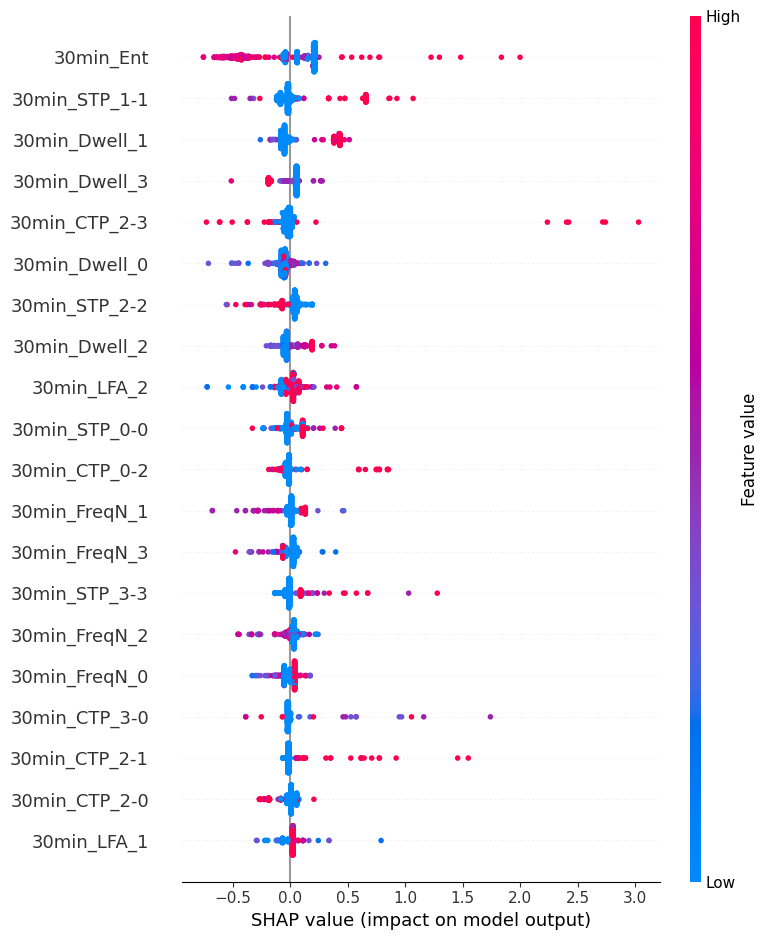

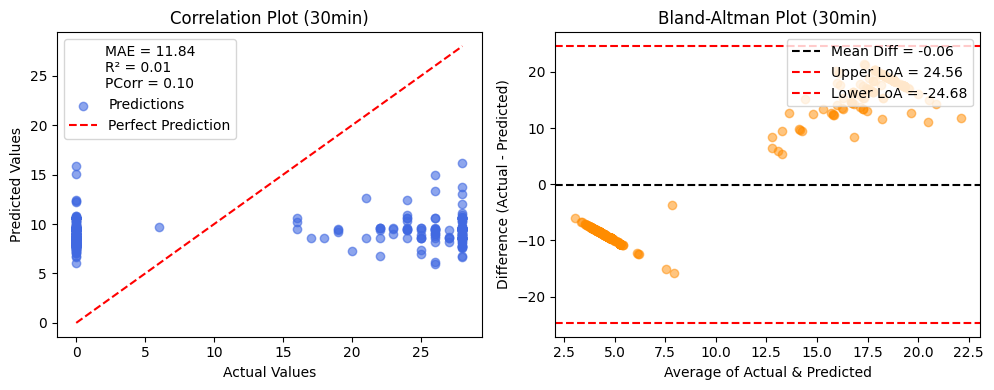

============== PREDICTION OF 28-DAY VPFD WITH 1hr DATA ==============
MAE: 11.86, R²: 0.00, Pearson Corr: 0.07
[SHAP] Computing SHAP values...


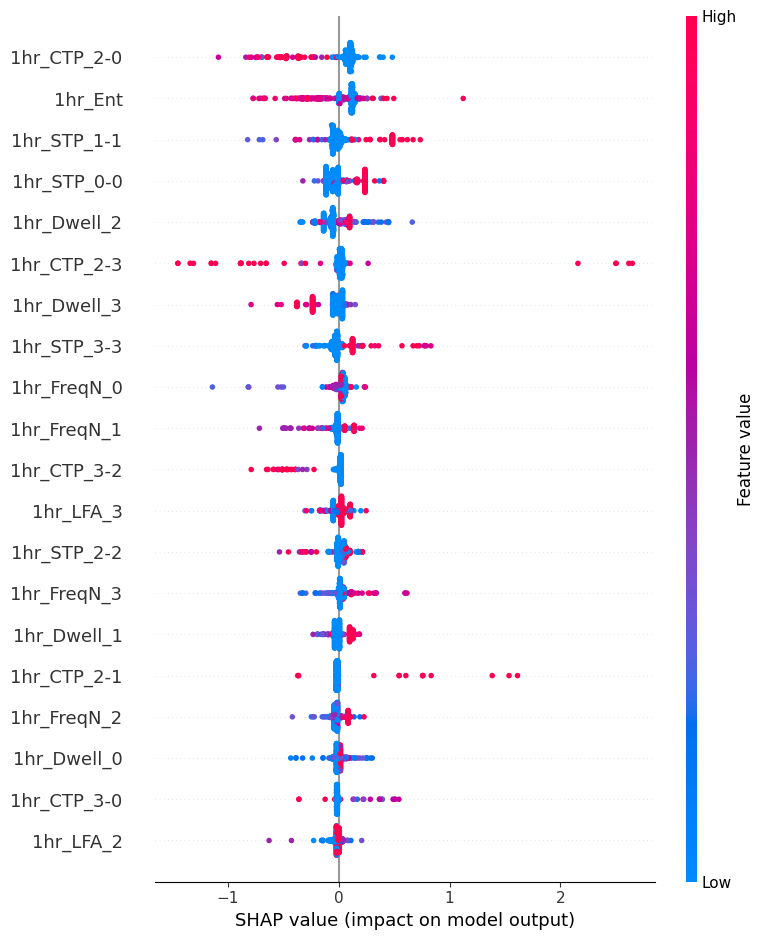

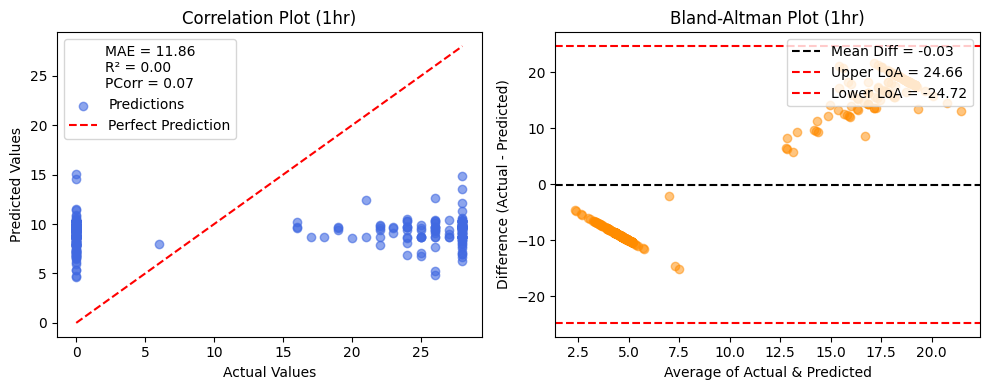

============== PREDICTION OF 28-DAY VPFD WITH 3hr DATA ==============
MAE: 11.86, R²: 0.00, Pearson Corr: 0.07
[SHAP] Computing SHAP values...


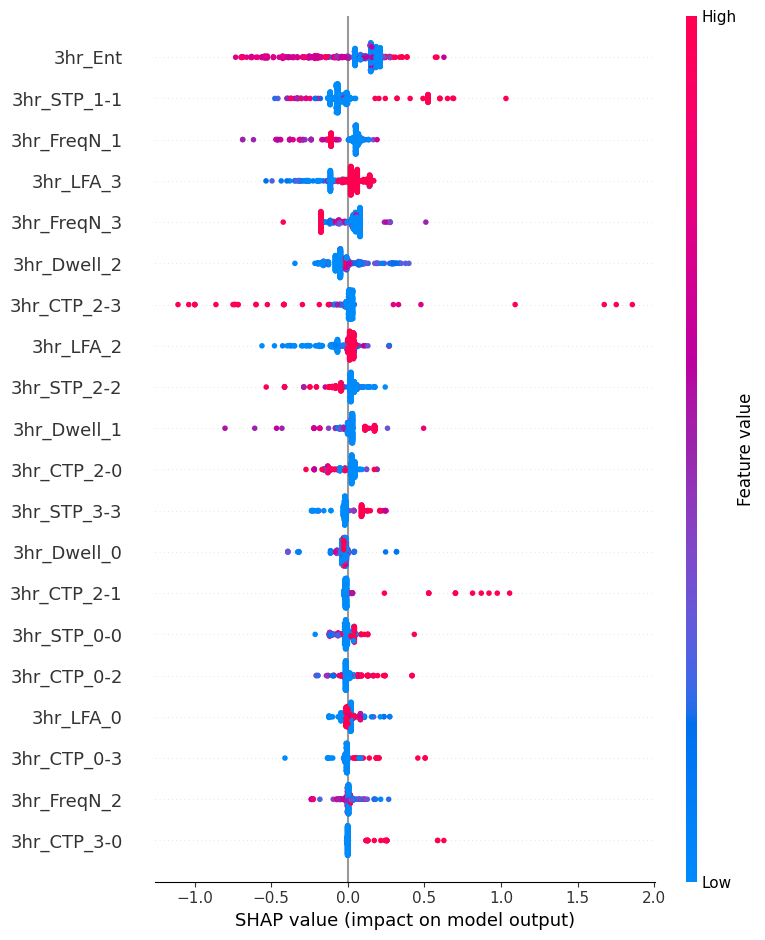

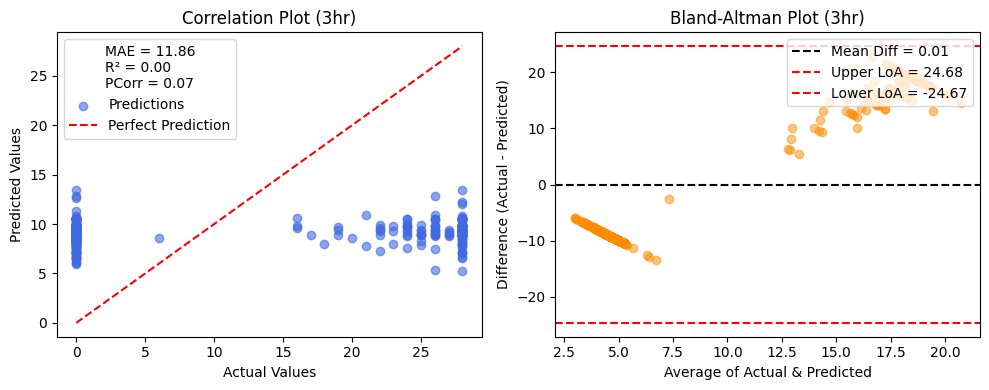

============== PREDICTION OF 28-DAY VPFD WITH 6hr DATA ==============
MAE: 11.89, R²: 0.00, Pearson Corr: 0.06
[SHAP] Computing SHAP values...


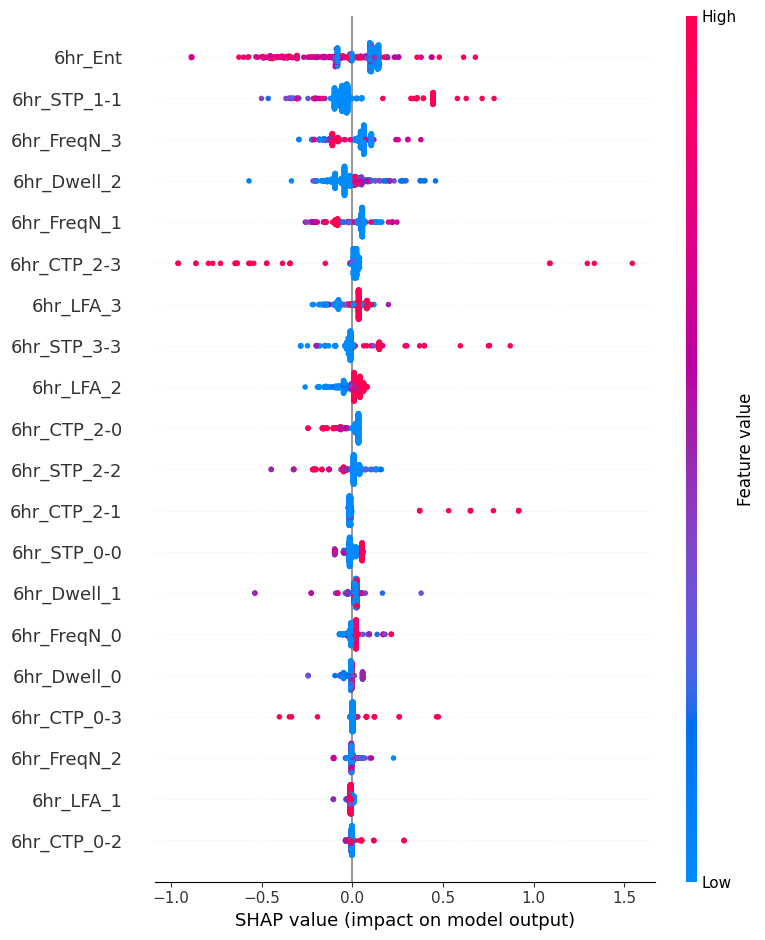

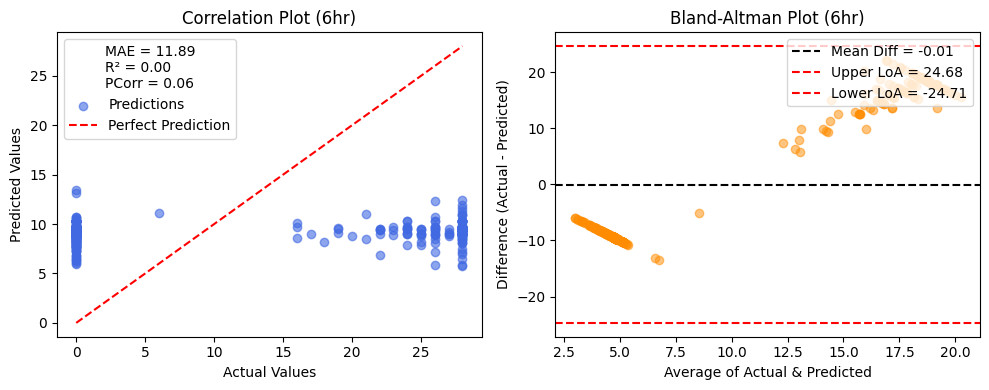

In [96]:
### Vasopressor-free days

_=Block_event_regression(df=df_allFIN.copy(), block_duration='15min',event_name='vpfd28', df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='30min',event_name='vpfd28', df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='1hr',event_name='vpfd28', df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='3hr',event_name='vpfd28', df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='6hr',event_name='vpfd28', df_origin=df_Sepsis_latest_wTarget.copy())

============== PREDICTION OF 7-DAY VPFD WITH 15min DATA ==============
MAE: 2.87, R²: -0.00, Pearson Corr: 0.02
[SHAP] Computing SHAP values...


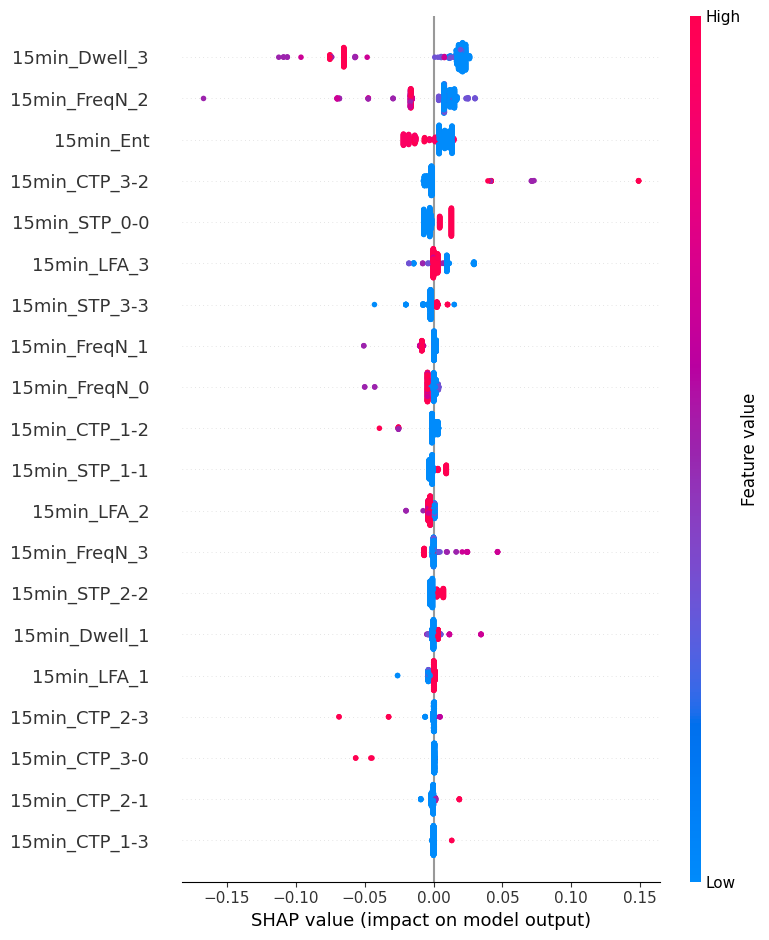

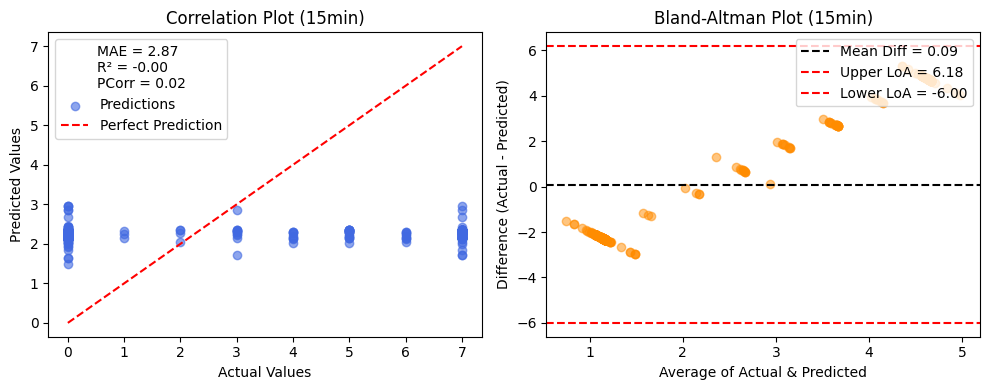

============== PREDICTION OF 7-DAY VPFD WITH 30min DATA ==============
MAE: 2.83, R²: 0.02, Pearson Corr: 0.16
[SHAP] Computing SHAP values...


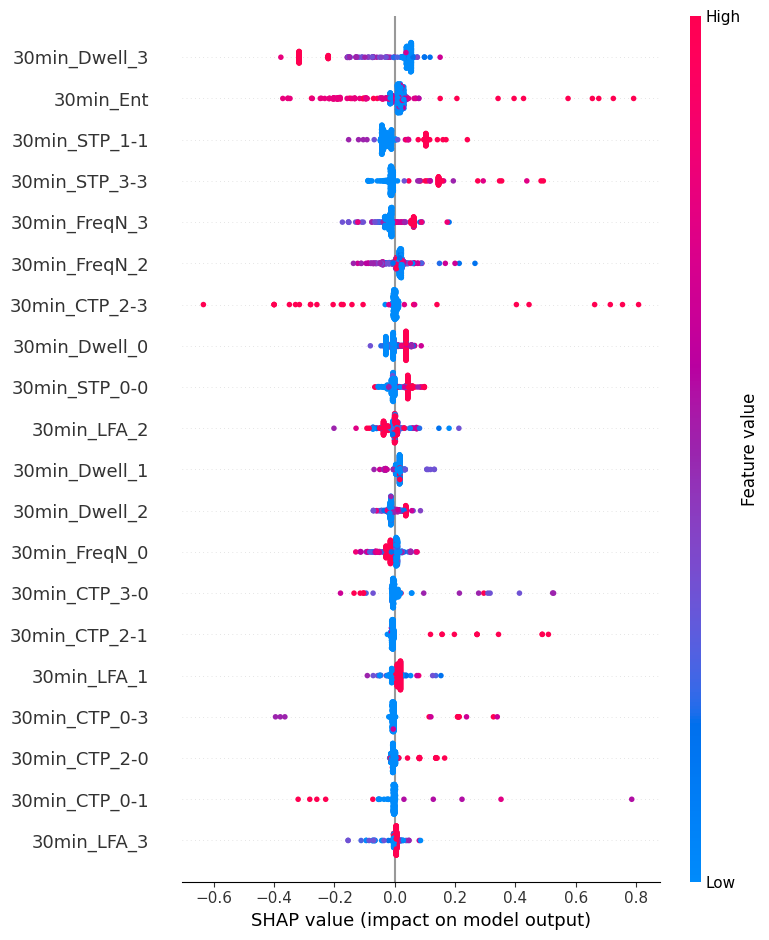

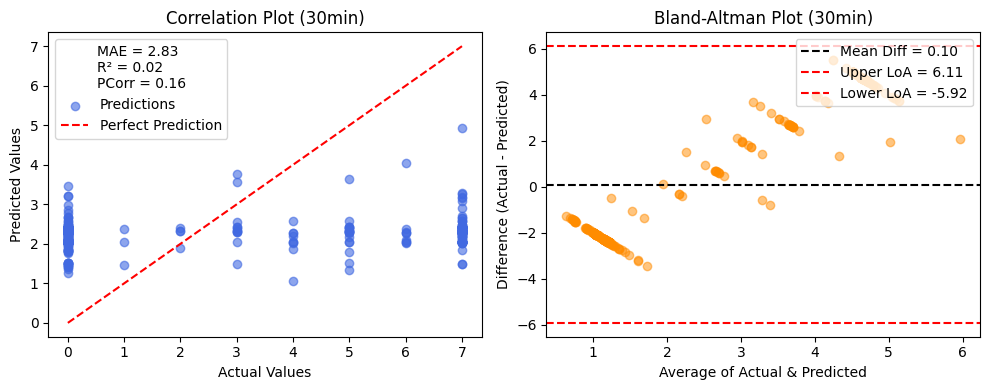

============== PREDICTION OF 7-DAY VPFD WITH 1hr DATA ==============
MAE: 2.85, R²: 0.01, Pearson Corr: 0.10
[SHAP] Computing SHAP values...


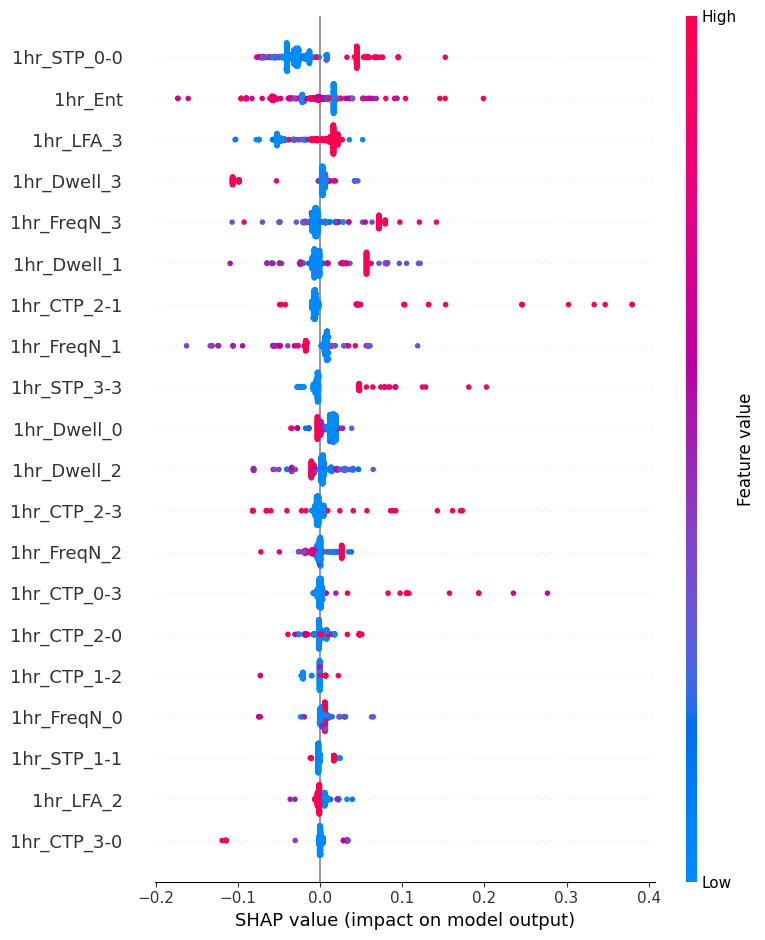

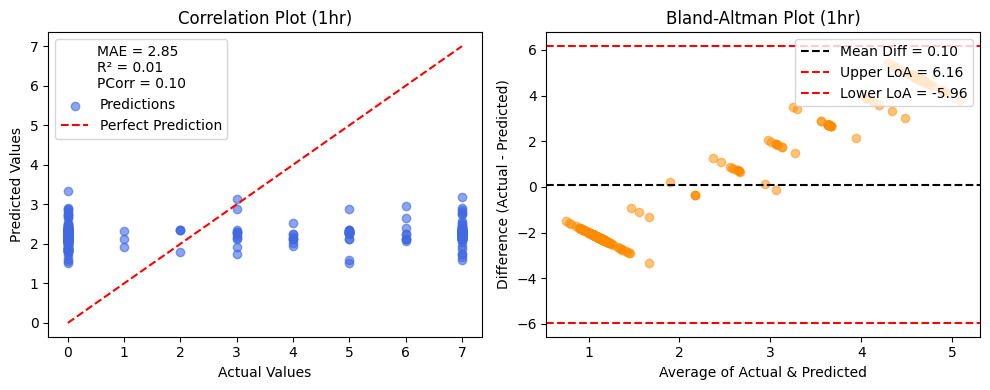

============== PREDICTION OF 7-DAY VPFD WITH 3hr DATA ==============
MAE: 2.82, R²: 0.02, Pearson Corr: 0.13
[SHAP] Computing SHAP values...


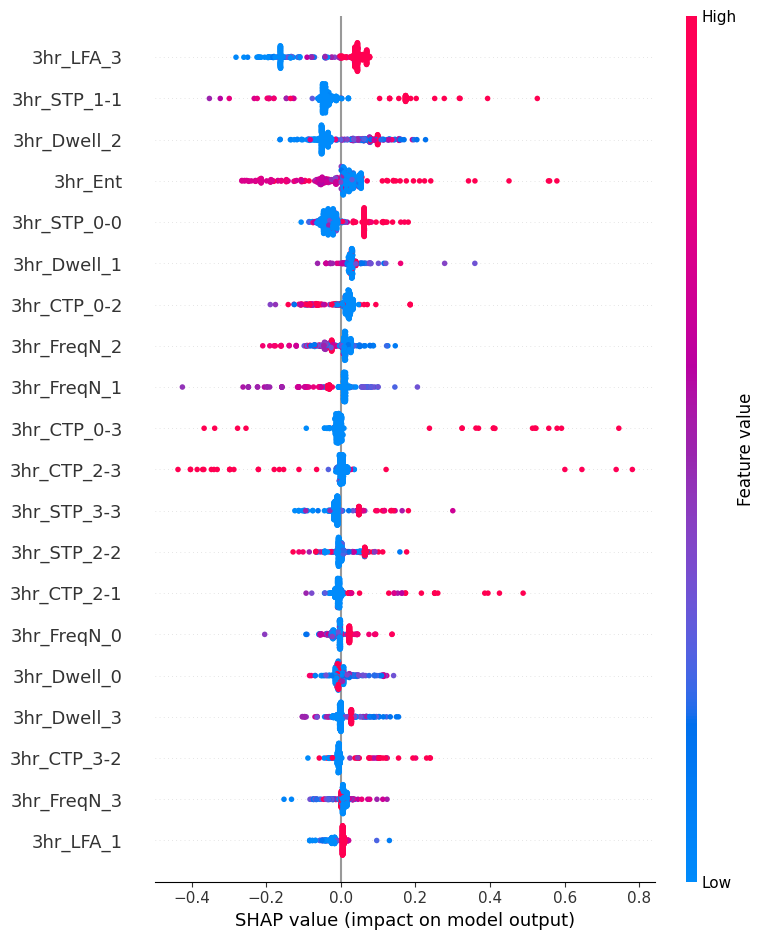

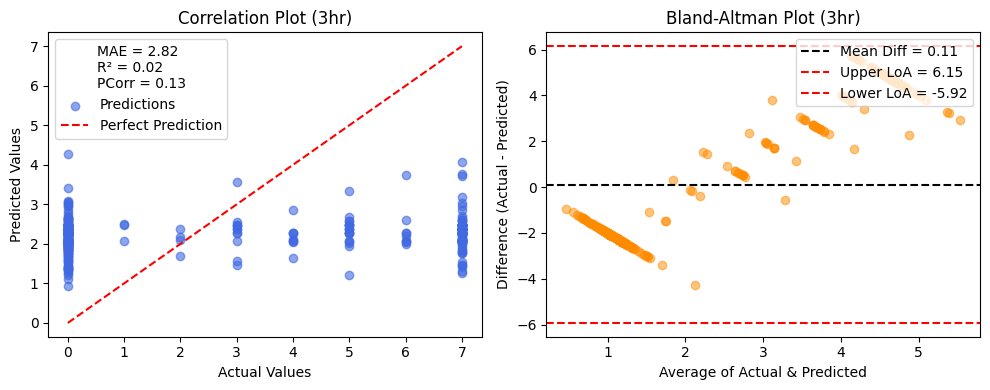

============== PREDICTION OF 7-DAY VPFD WITH 6hr DATA ==============
MAE: 2.86, R²: 0.01, Pearson Corr: 0.08
[SHAP] Computing SHAP values...


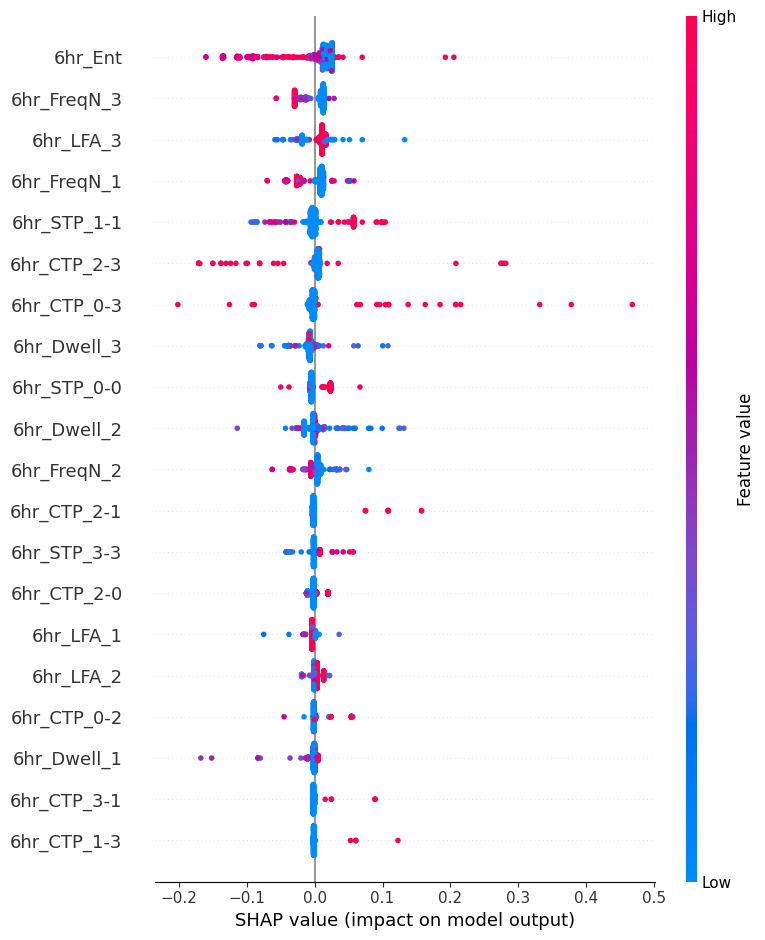

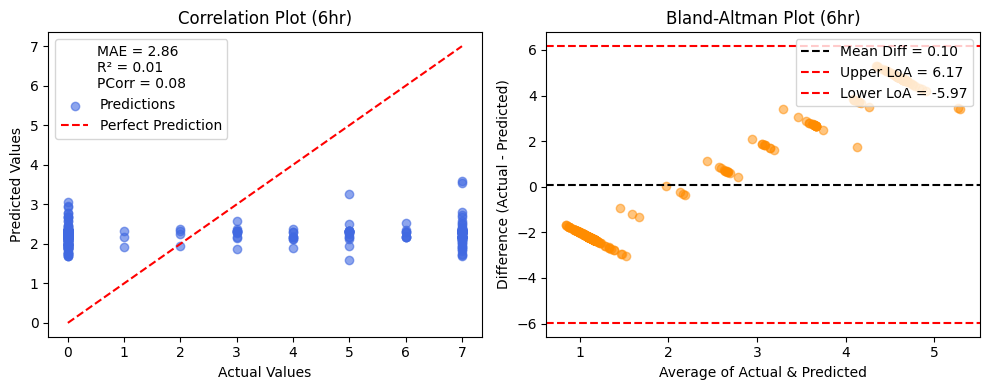

In [97]:
### Vasopressor-free days

_=Block_event_regression(df=df_allFIN.copy(), block_duration='15min',event_name='vpfd7',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='30min',event_name='vpfd7',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='1hr',event_name='vpfd7',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='3hr',event_name='vpfd7',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='6hr',event_name='vpfd7',df_origin=df_Sepsis_latest_wTarget.copy())

============== PREDICTION OF 2-DAY VPFD WITH 15min DATA ==============
MAE: 0.81, R²: -0.00, Pearson Corr: -0.01
[SHAP] Computing SHAP values...


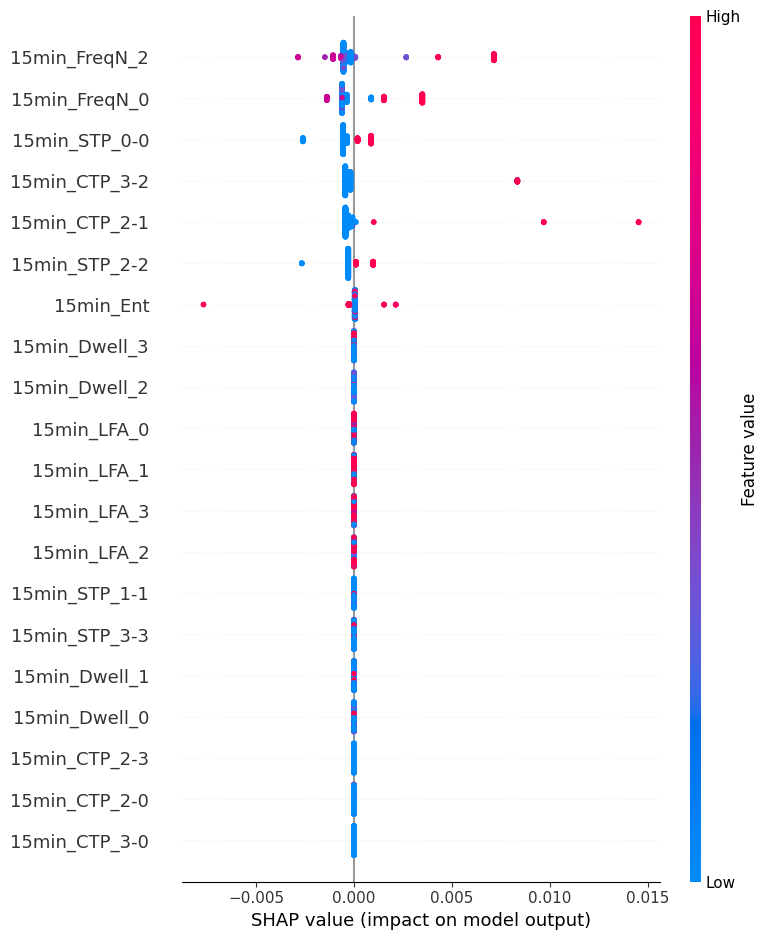

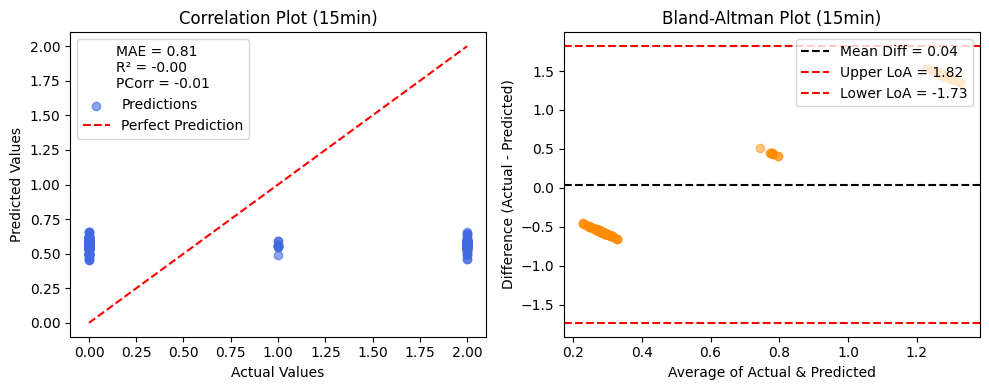

============== PREDICTION OF 2-DAY VPFD WITH 30min DATA ==============
MAE: 0.80, R²: 0.01, Pearson Corr: 0.10
[SHAP] Computing SHAP values...


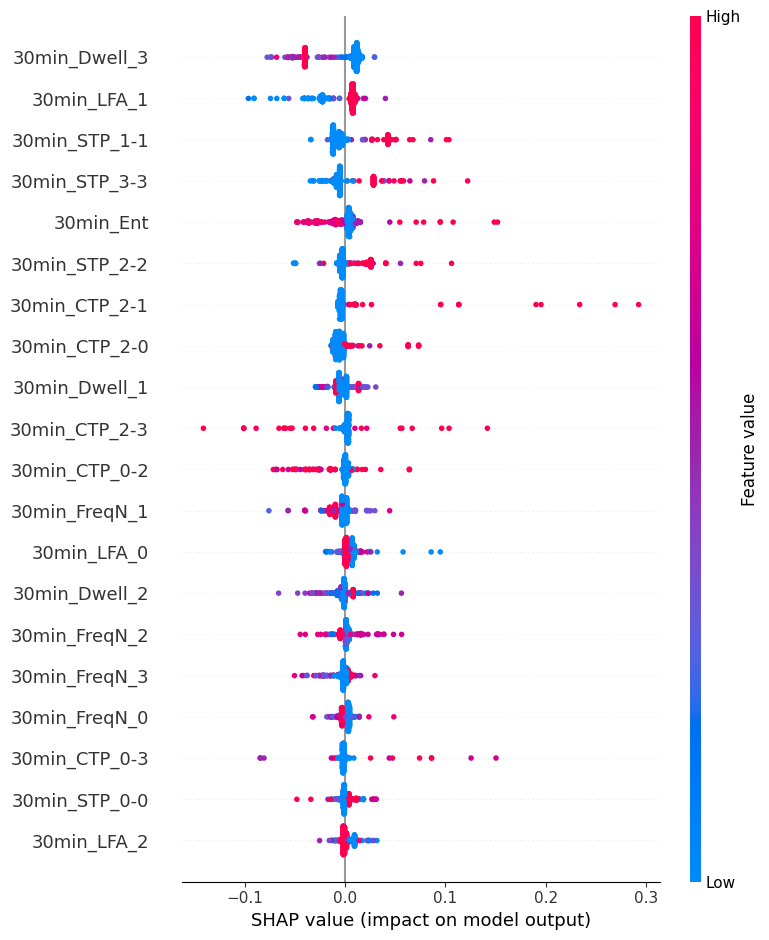

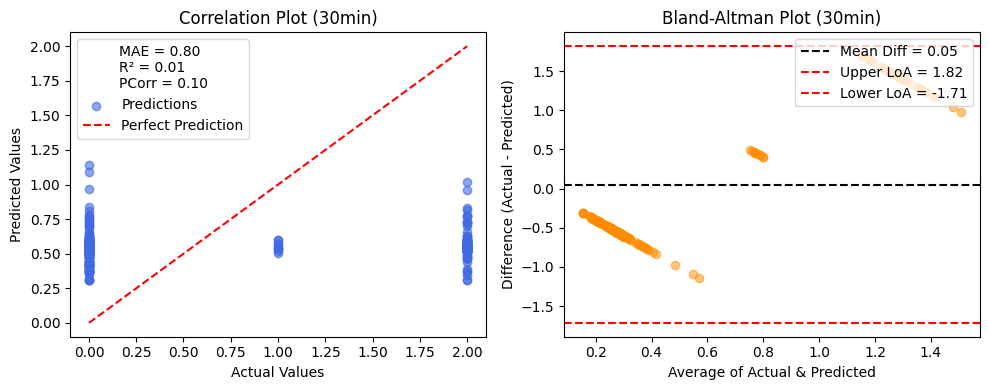

============== PREDICTION OF 2-DAY VPFD WITH 1hr DATA ==============
MAE: 0.81, R²: -0.00, Pearson Corr: 0.05
[SHAP] Computing SHAP values...


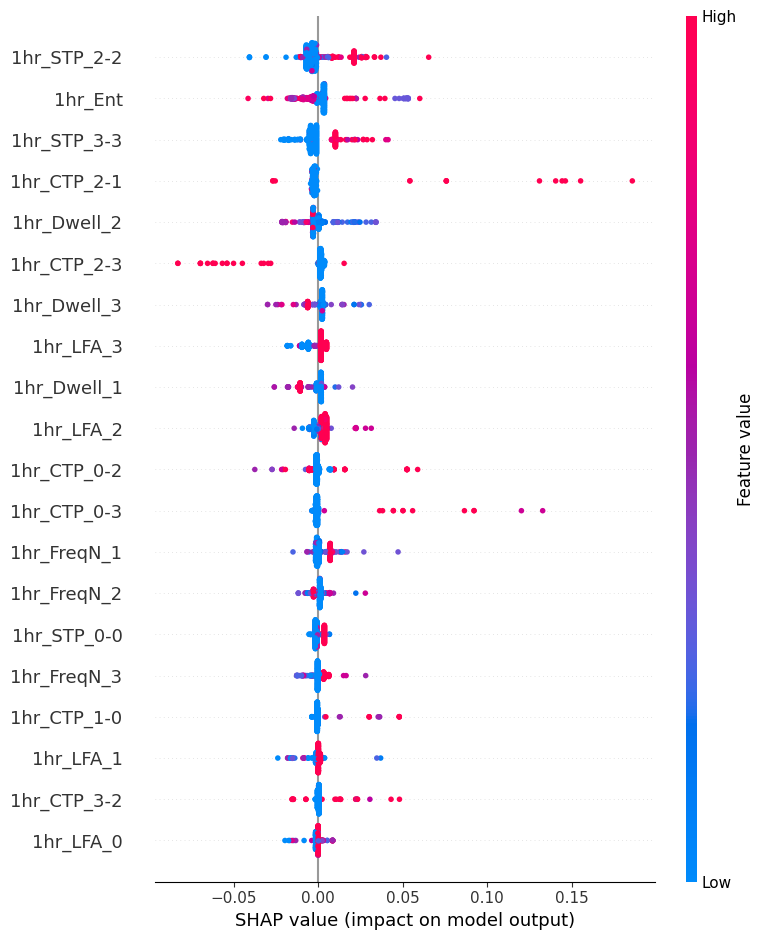

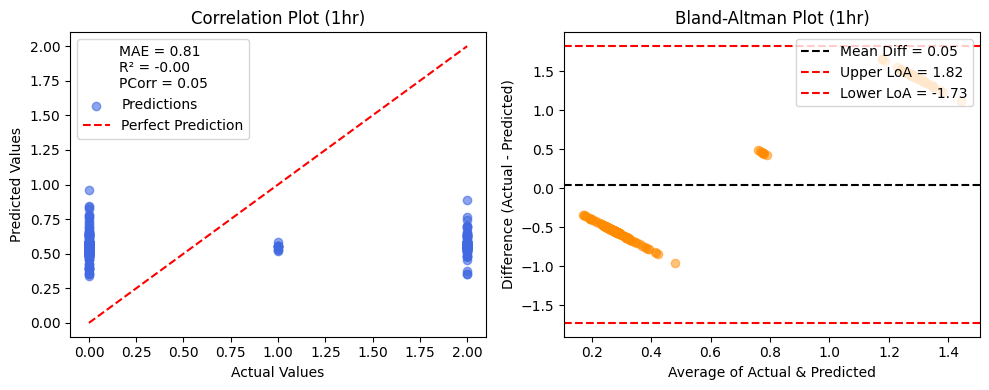

============== PREDICTION OF 2-DAY VPFD WITH 3hr DATA ==============
MAE: 0.81, R²: -0.00, Pearson Corr: 0.01
[SHAP] Computing SHAP values...


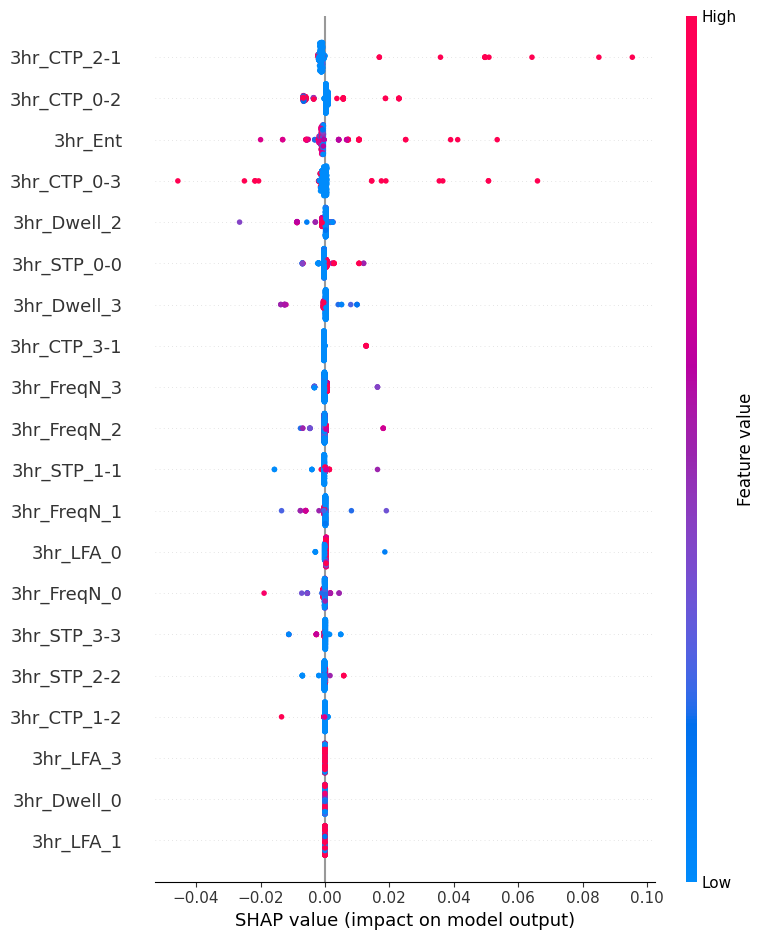

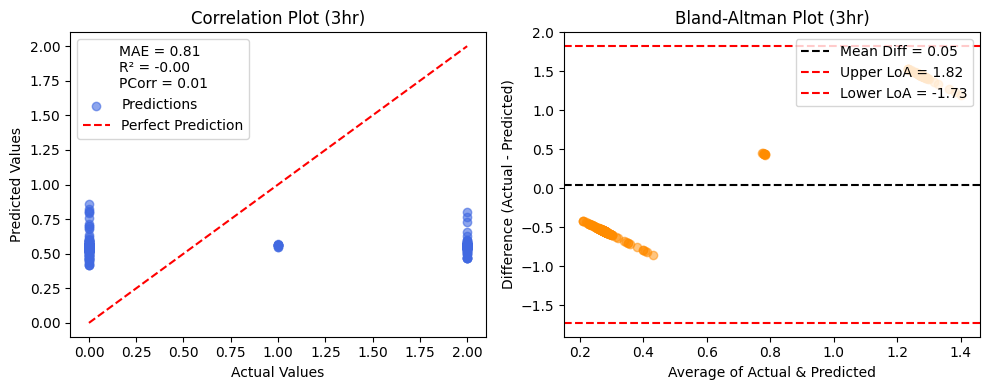

============== PREDICTION OF 2-DAY VPFD WITH 6hr DATA ==============
MAE: 0.81, R²: -0.01, Pearson Corr: -0.01
[SHAP] Computing SHAP values...


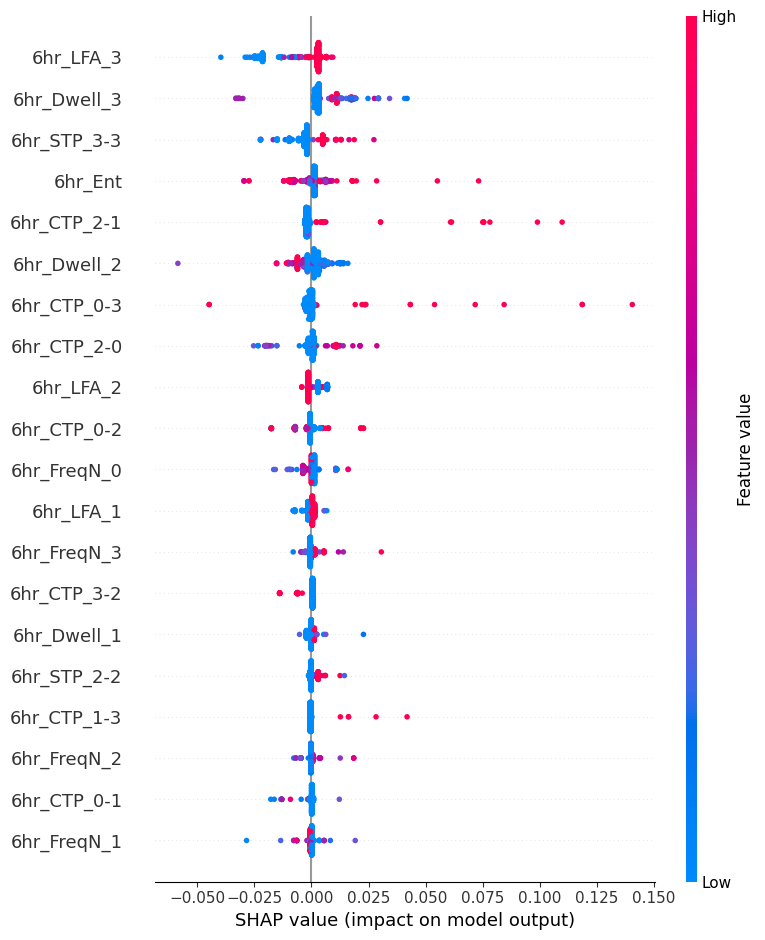

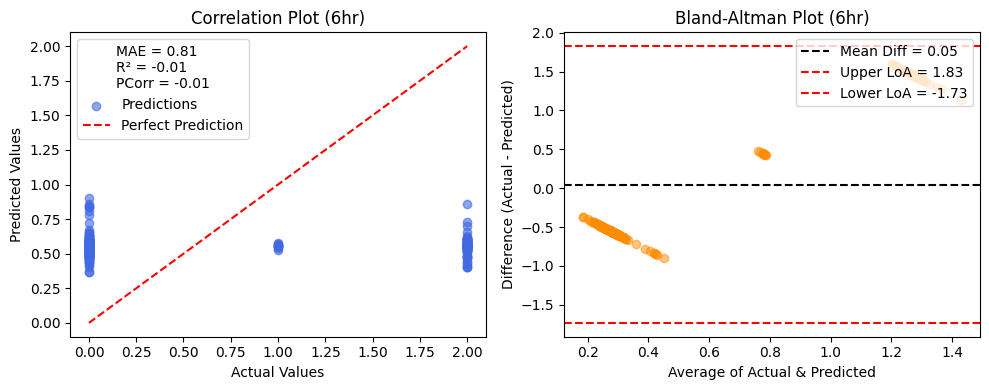

In [98]:
### Vasopressor-free days

_=Block_event_regression(df=df_allFIN.copy(), block_duration='15min',event_name='vpfd2',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='30min',event_name='vpfd2',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='1hr',event_name='vpfd2',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='3hr',event_name='vpfd2',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='6hr',event_name='vpfd2',df_origin=df_Sepsis_latest_wTarget.copy())

============== PREDICTION OF 28-DAY BFD WITH 15min DATA ==============
MAE: 11.93, R²: 0.00, Pearson Corr: 0.04
[SHAP] Computing SHAP values...


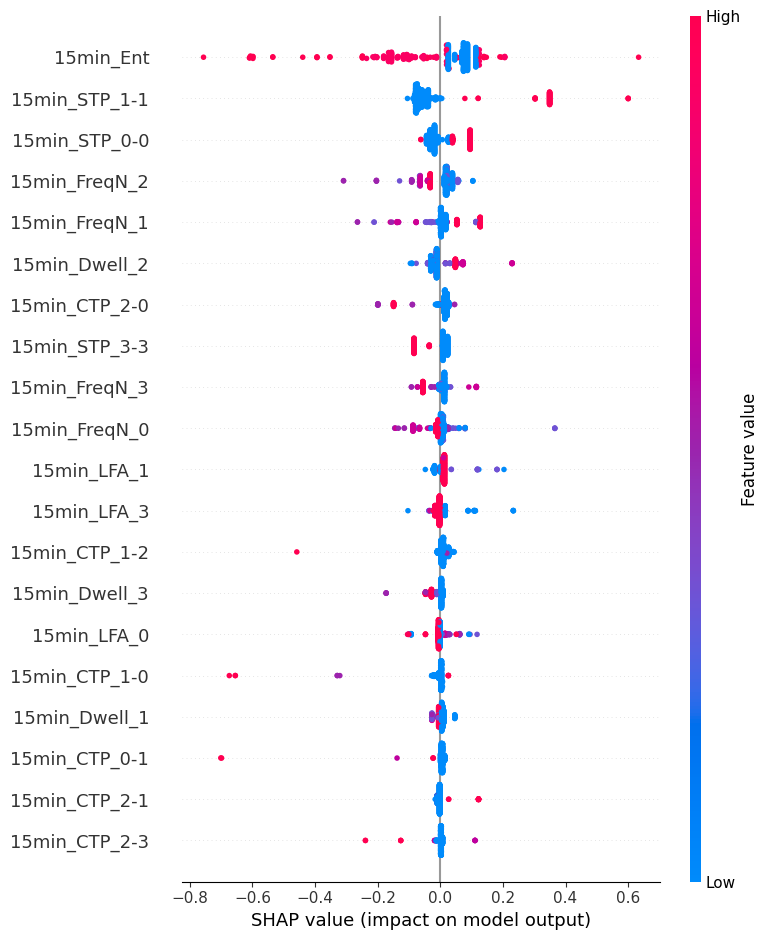

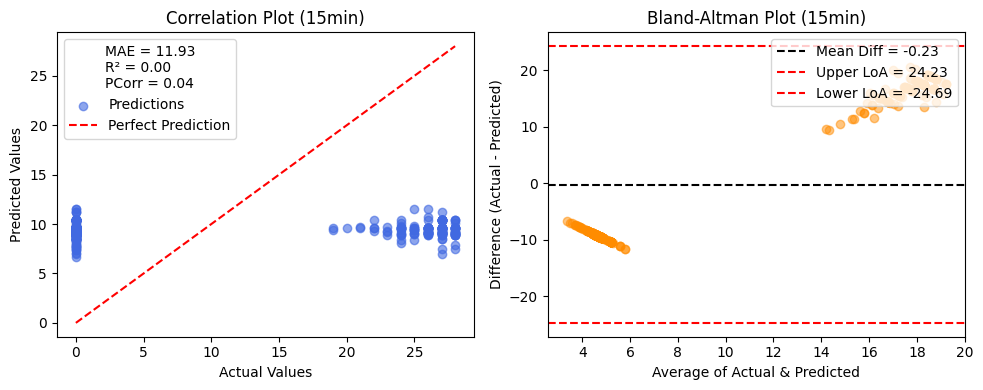

============== PREDICTION OF 28-DAY BFD WITH 30min DATA ==============
MAE: 11.85, R²: 0.01, Pearson Corr: 0.09
[SHAP] Computing SHAP values...


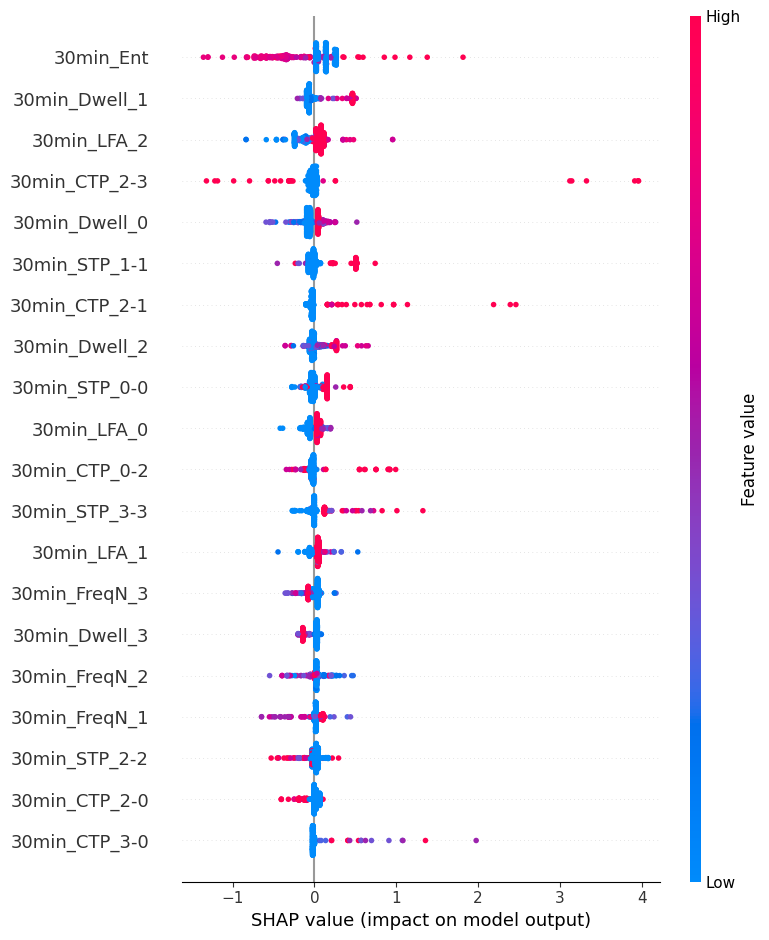

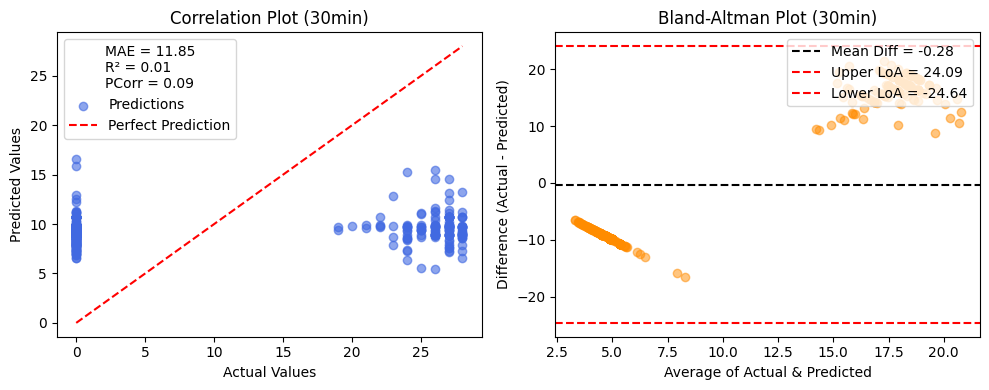

============== PREDICTION OF 28-DAY BFD WITH 1hr DATA ==============
MAE: 11.90, R²: -0.00, Pearson Corr: 0.05
[SHAP] Computing SHAP values...


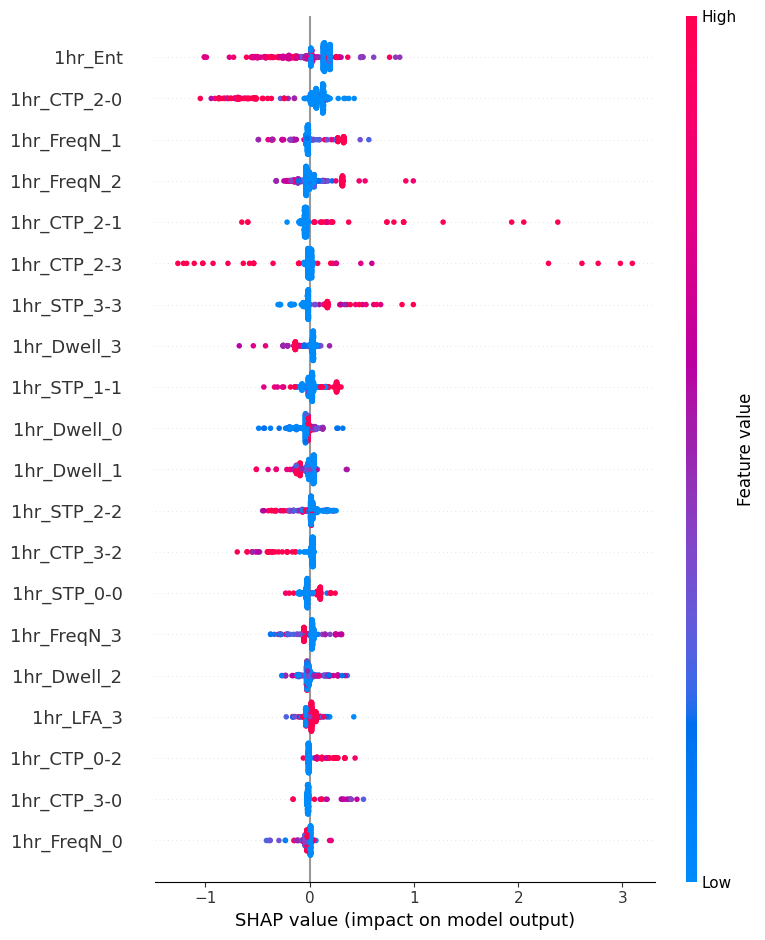

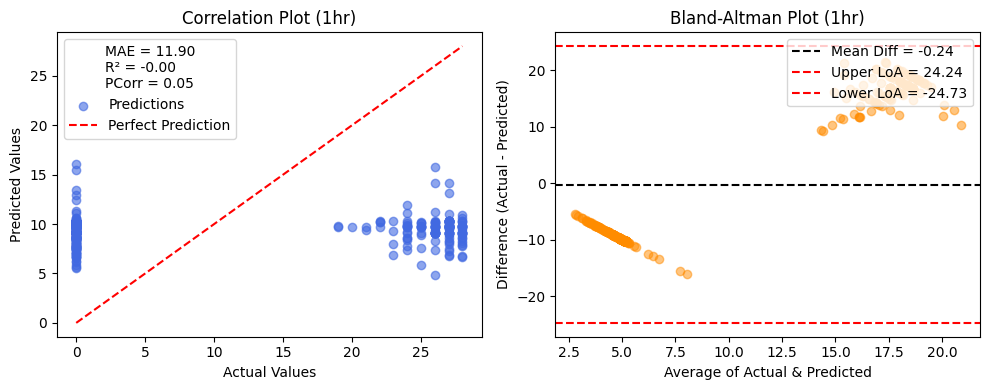

============== PREDICTION OF 28-DAY BFD WITH 3hr DATA ==============
MAE: 11.87, R²: 0.01, Pearson Corr: 0.08
[SHAP] Computing SHAP values...


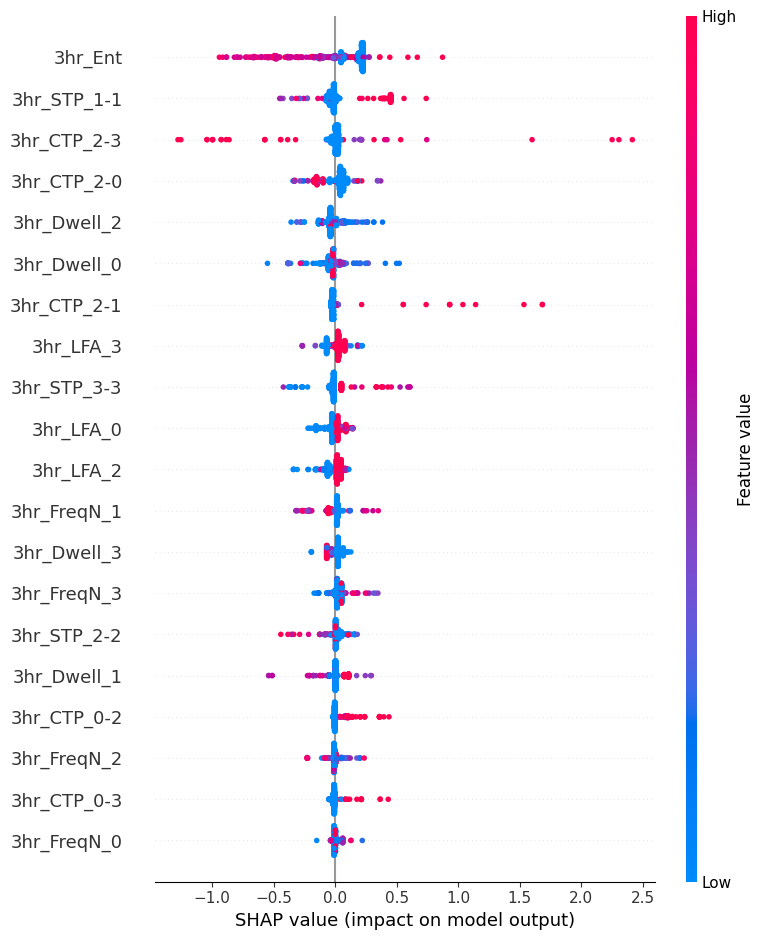

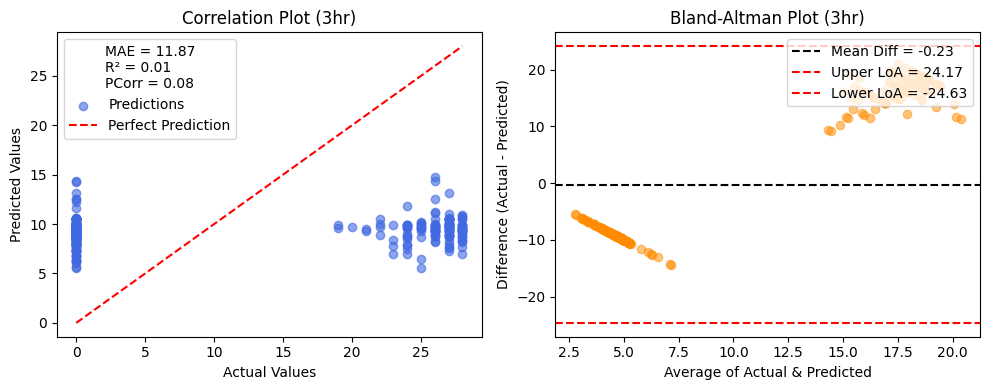

============== PREDICTION OF 28-DAY BFD WITH 6hr DATA ==============
MAE: 11.89, R²: 0.00, Pearson Corr: 0.06
[SHAP] Computing SHAP values...


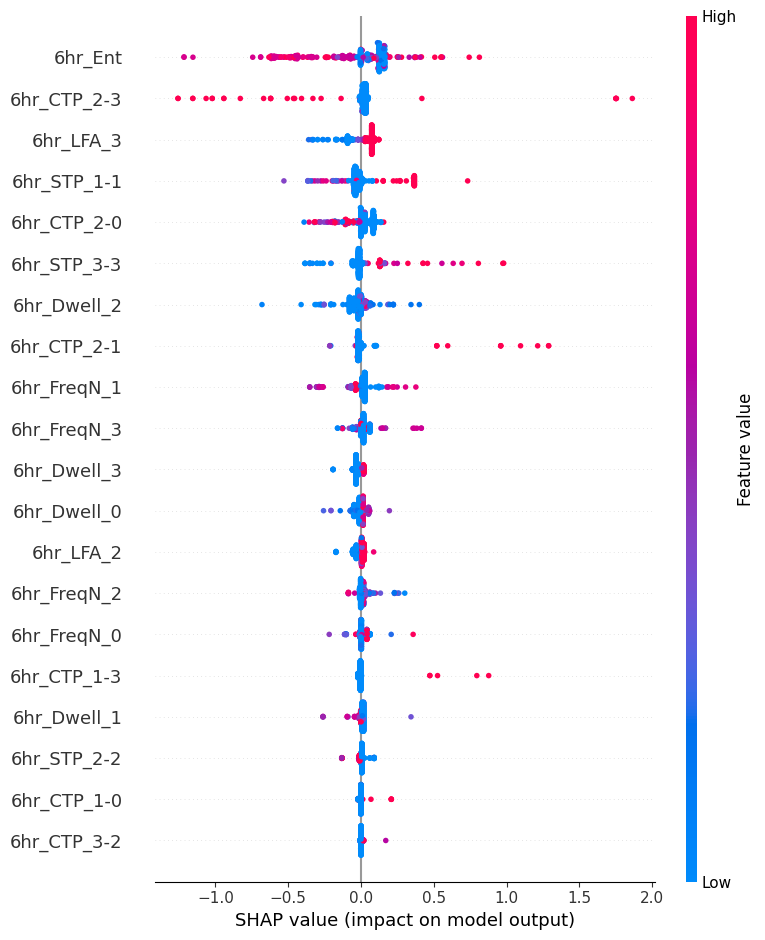

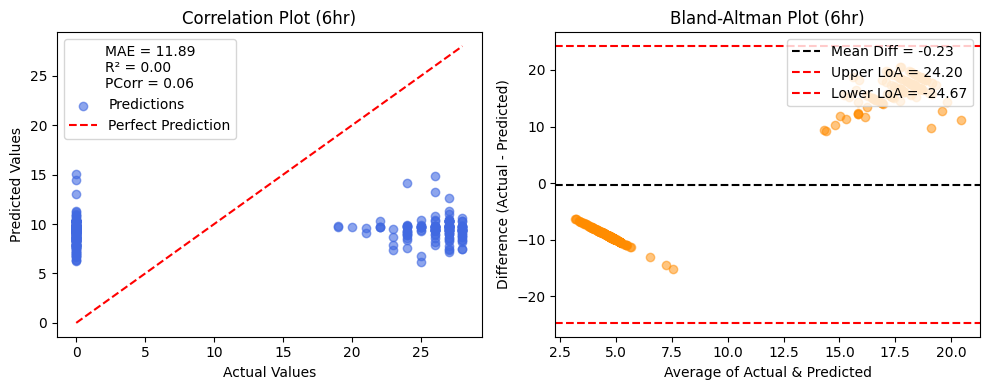

In [101]:
### BFD

_=Block_event_regression(df=df_allFIN.copy(), block_duration='15min',event_name='bfd28',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='30min',event_name='bfd28',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='1hr',event_name='bfd28',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='3hr',event_name='bfd28',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='6hr',event_name='bfd28',df_origin=df_Sepsis_latest_wTarget.copy())

============== PREDICTION OF 7-DAY BFD WITH 15min DATA ==============
MAE: 2.82, R²: -0.00, Pearson Corr: 0.00
[SHAP] Computing SHAP values...


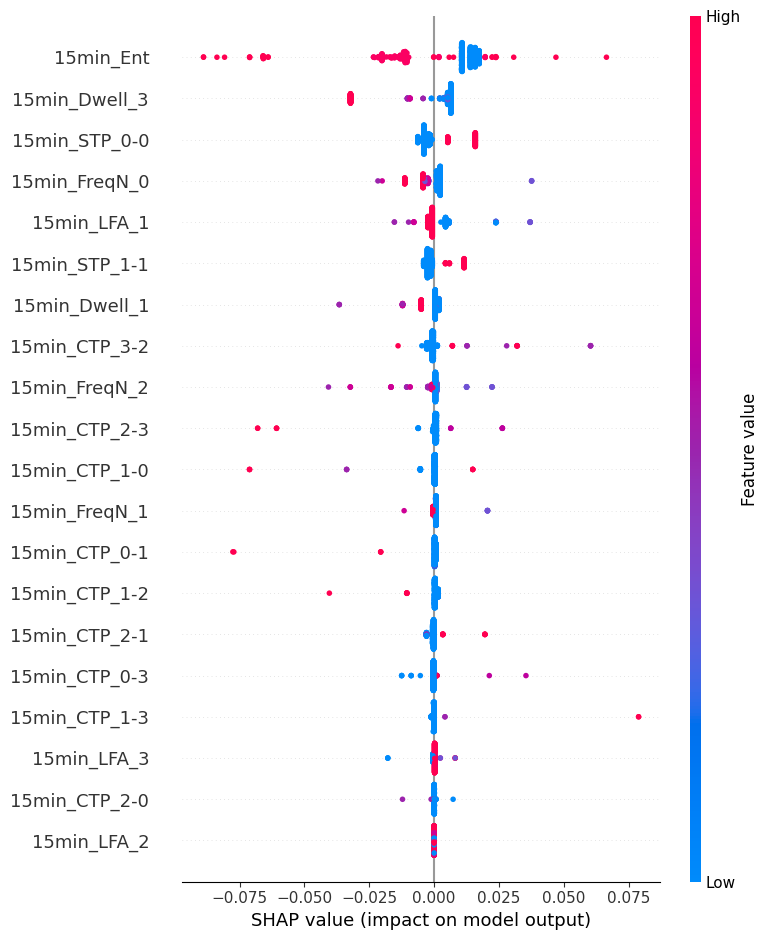

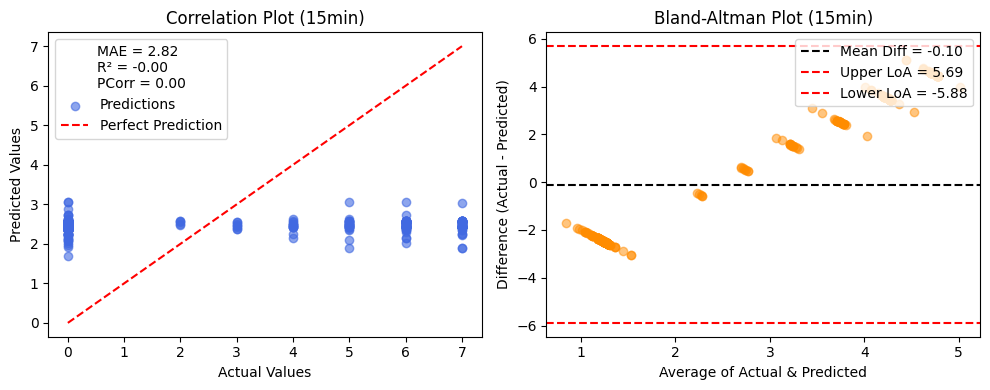

============== PREDICTION OF 7-DAY BFD WITH 30min DATA ==============
MAE: 2.80, R²: 0.01, Pearson Corr: 0.08
[SHAP] Computing SHAP values...


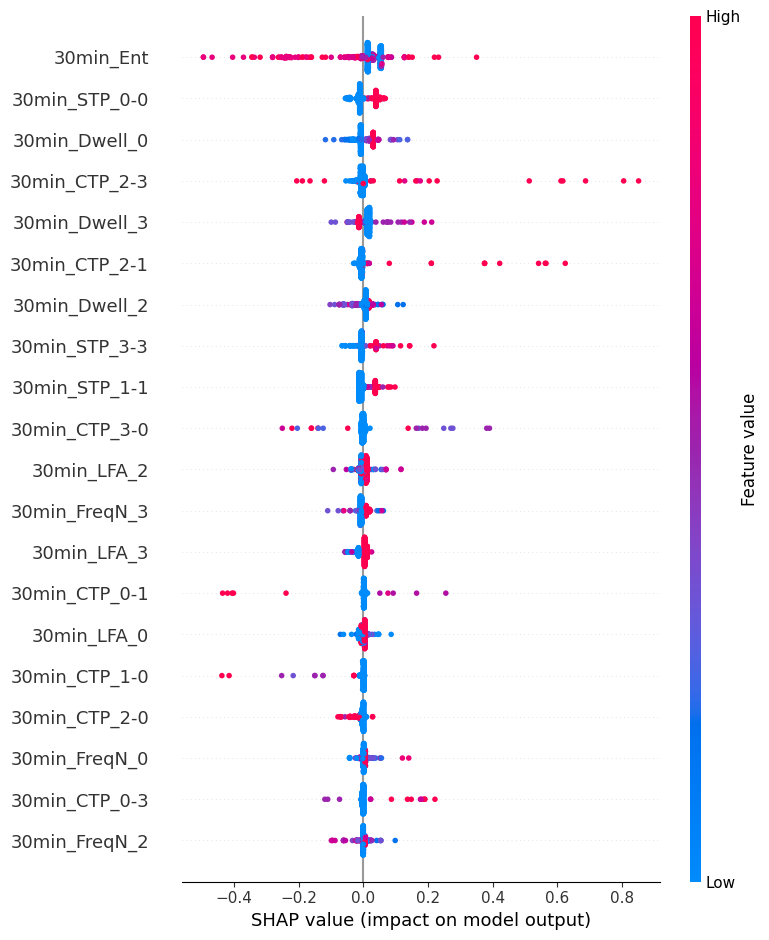

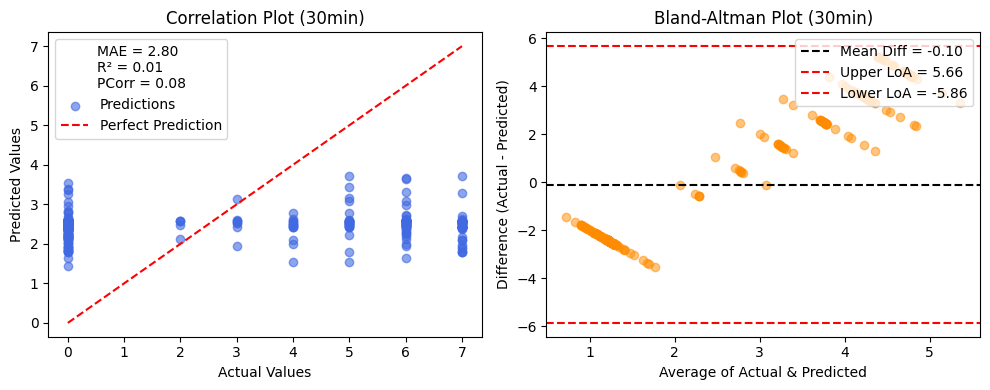

============== PREDICTION OF 7-DAY BFD WITH 1hr DATA ==============
MAE: 2.80, R²: 0.00, Pearson Corr: 0.08
[SHAP] Computing SHAP values...


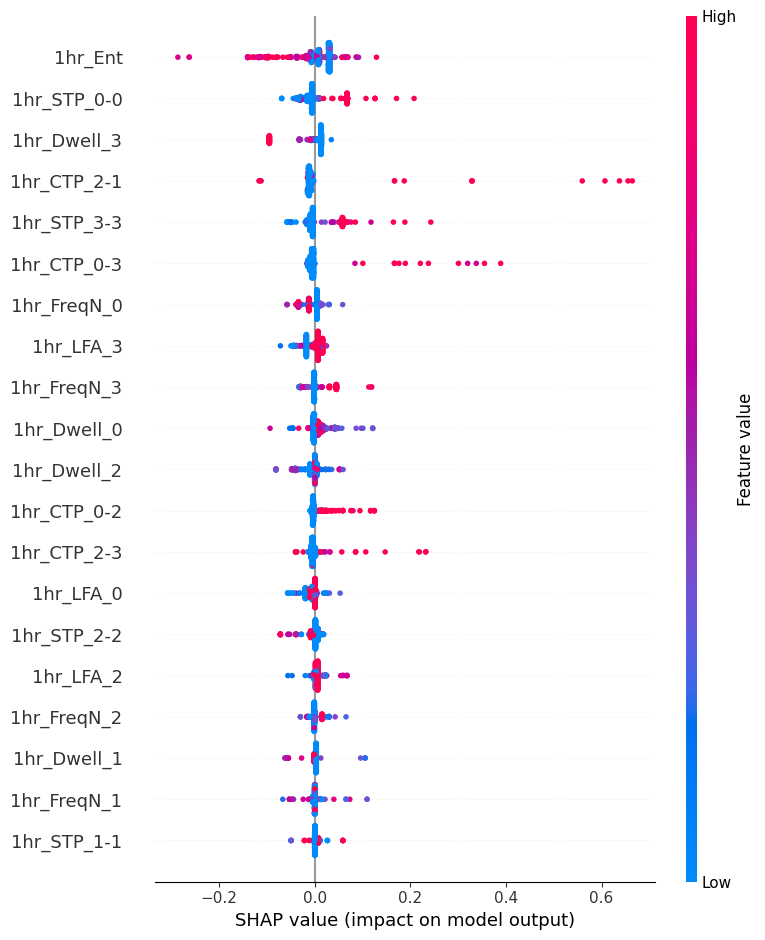

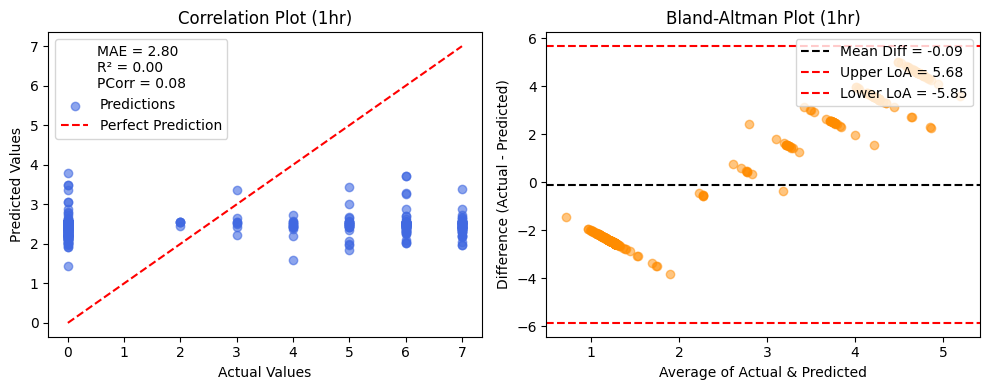

============== PREDICTION OF 7-DAY BFD WITH 3hr DATA ==============
MAE: 2.81, R²: -0.00, Pearson Corr: 0.05
[SHAP] Computing SHAP values...


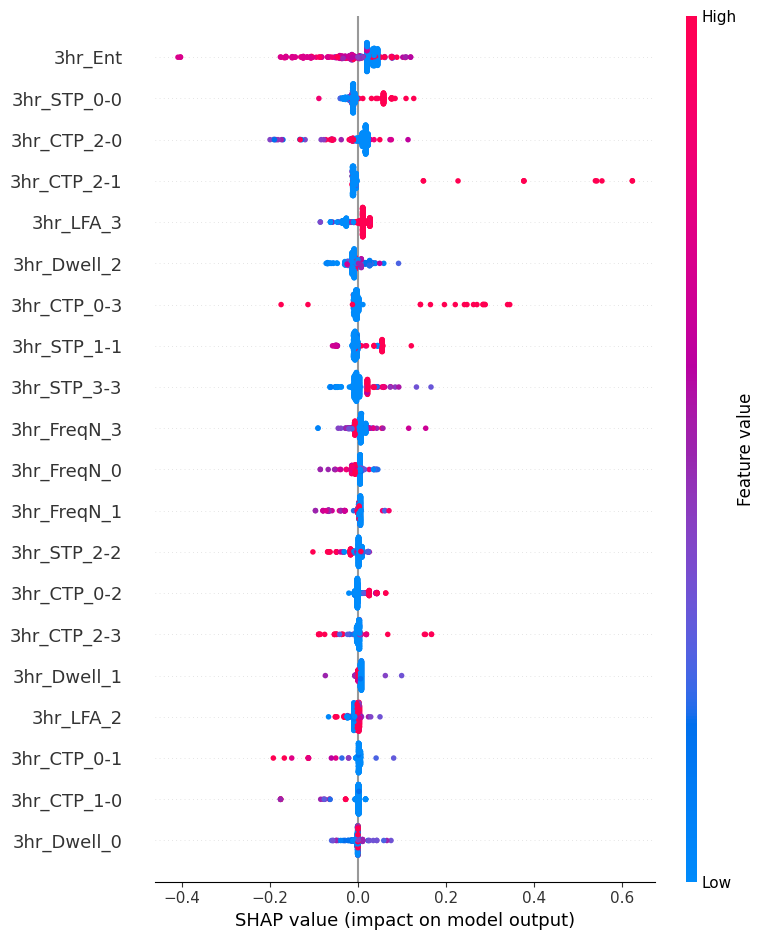

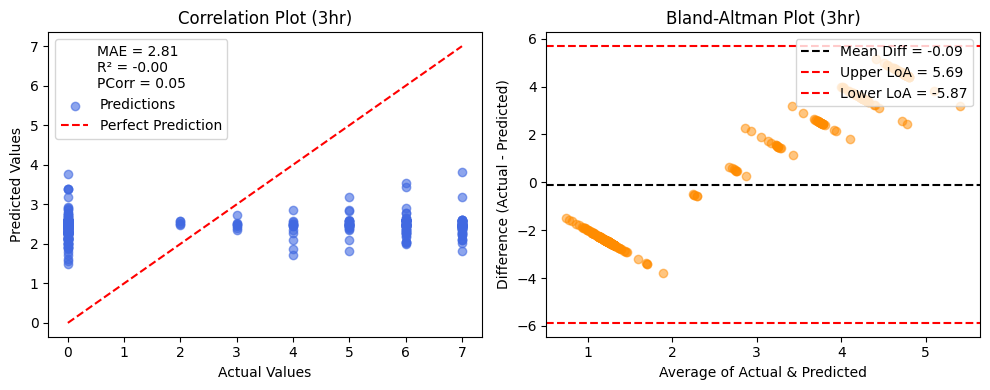

============== PREDICTION OF 7-DAY BFD WITH 6hr DATA ==============
MAE: 2.81, R²: -0.00, Pearson Corr: 0.05
[SHAP] Computing SHAP values...


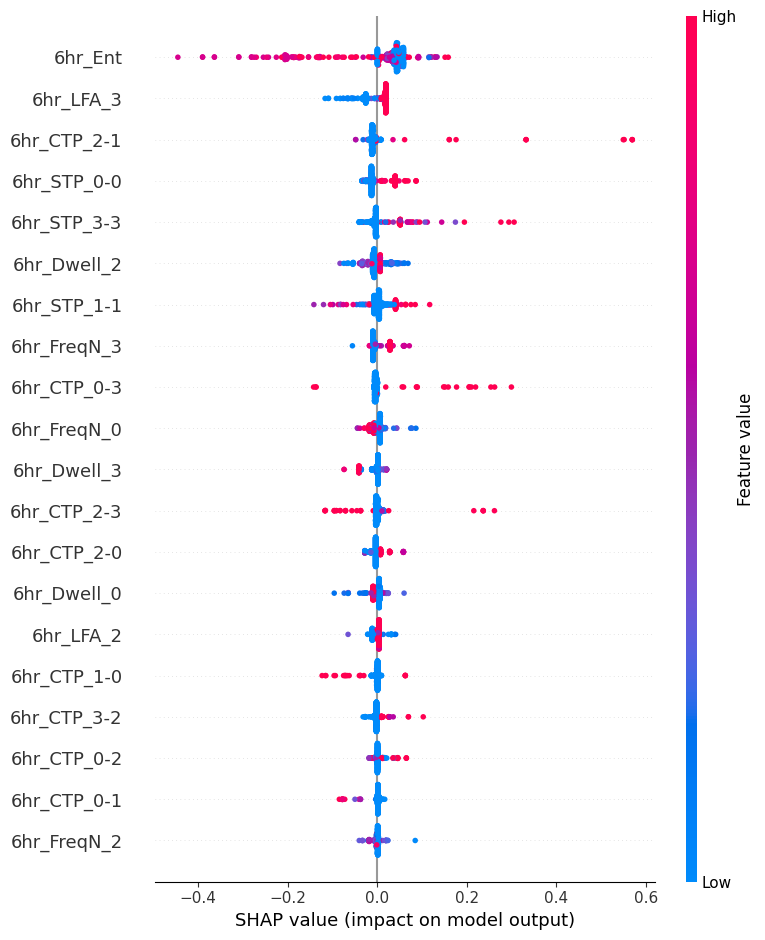

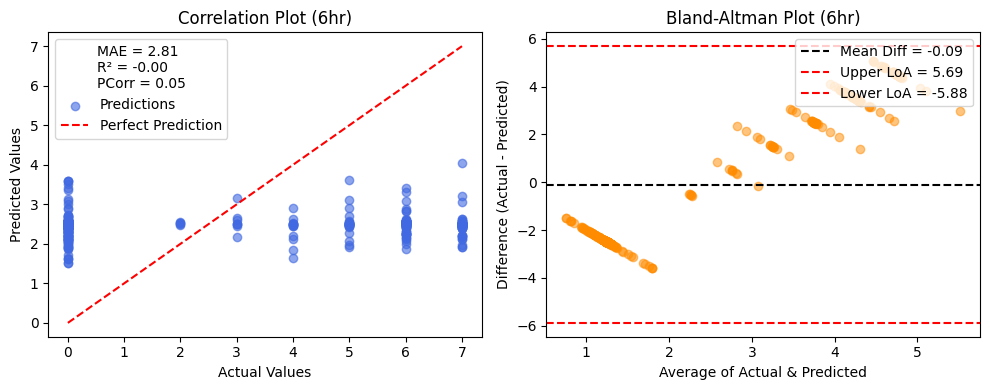

In [102]:
### BFD

_=Block_event_regression(df=df_allFIN.copy(), block_duration='15min',event_name='bfd7',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='30min',event_name='bfd7',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='1hr',event_name='bfd7',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='3hr',event_name='bfd7',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='6hr',event_name='bfd7',df_origin=df_Sepsis_latest_wTarget.copy())

============== PREDICTION OF 2-DAY BFD WITH 15min DATA ==============
MAE: 0.71, R²: -0.00, Pearson Corr: 0.01
[SHAP] Computing SHAP values...


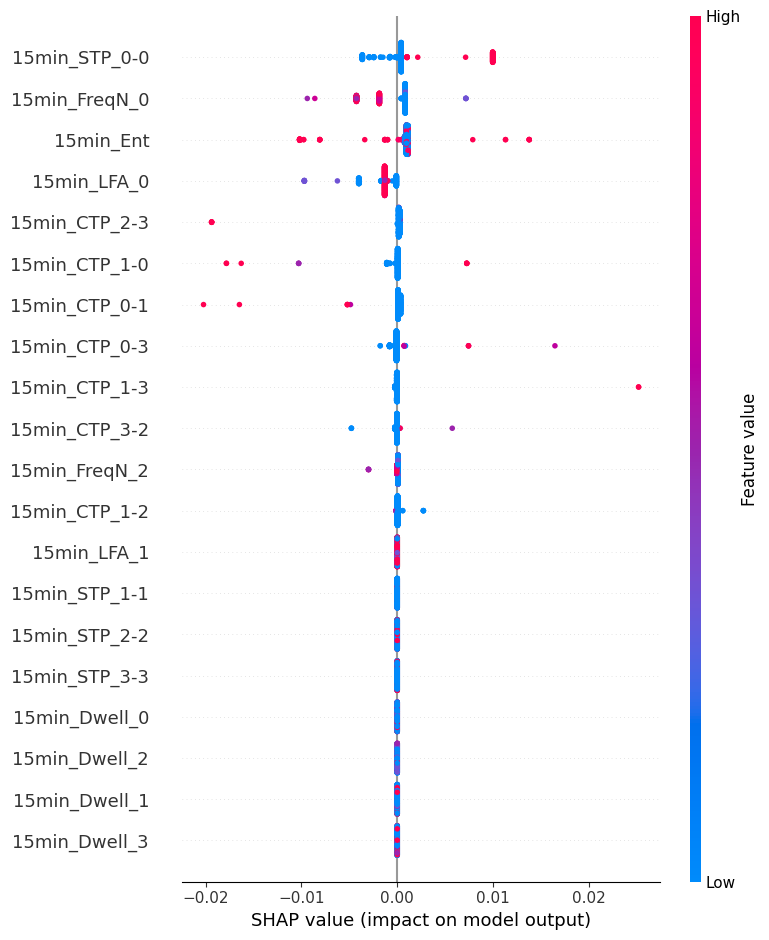

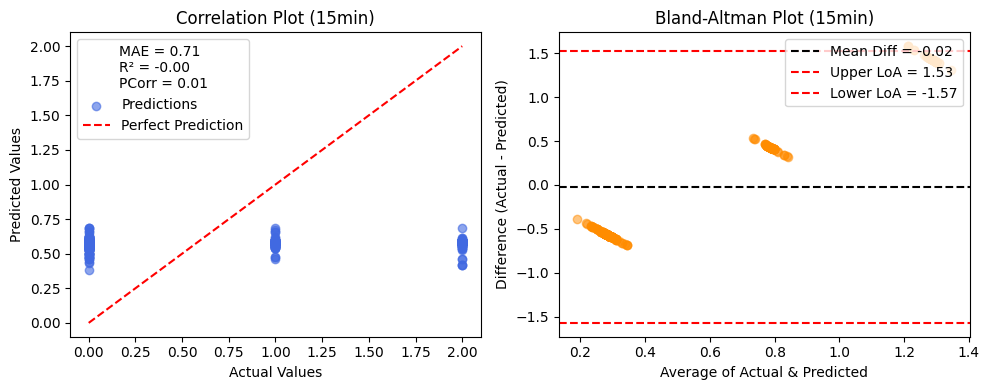

============== PREDICTION OF 2-DAY BFD WITH 30min DATA ==============
MAE: 0.71, R²: -0.01, Pearson Corr: -0.02
[SHAP] Computing SHAP values...


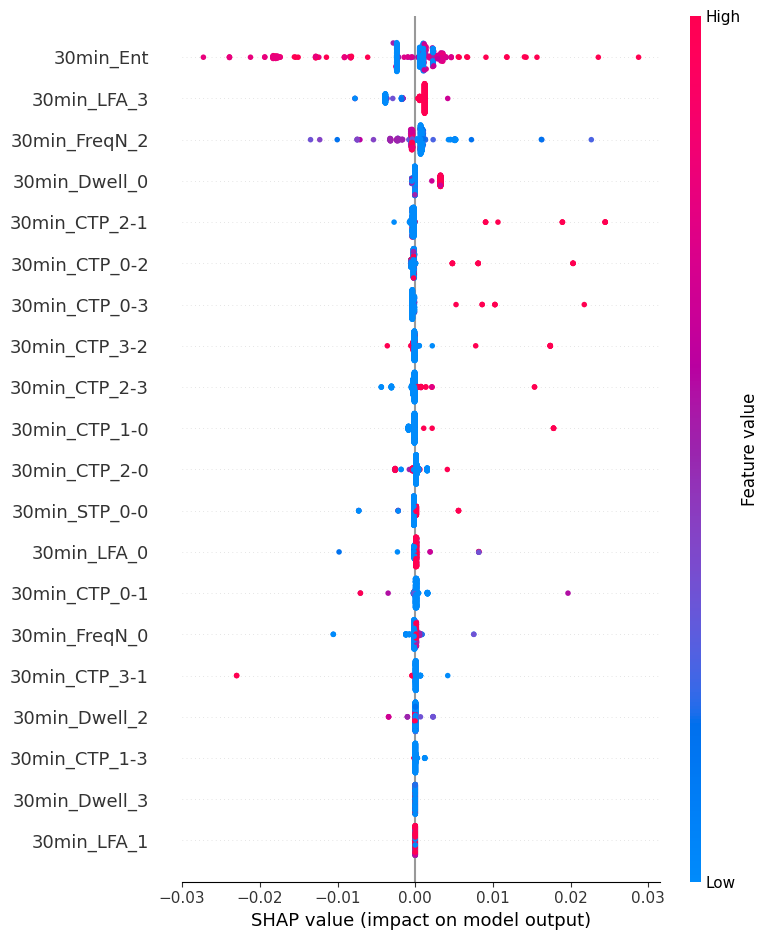

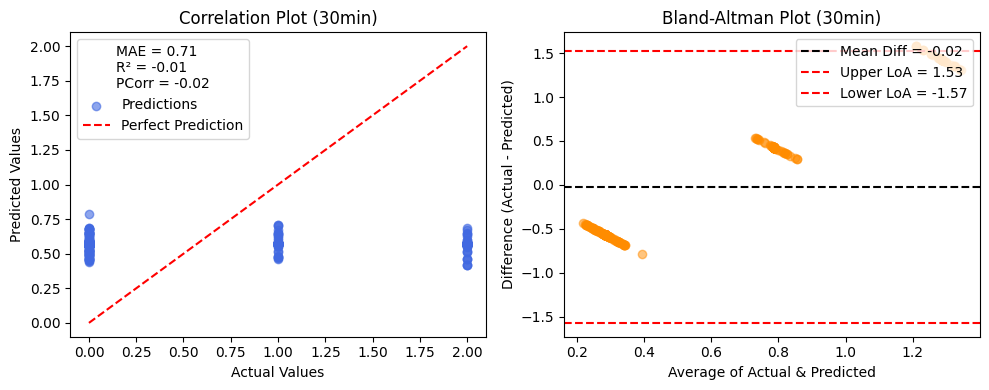

============== PREDICTION OF 2-DAY BFD WITH 1hr DATA ==============
MAE: 0.71, R²: -0.00, Pearson Corr: 0.01
[SHAP] Computing SHAP values...


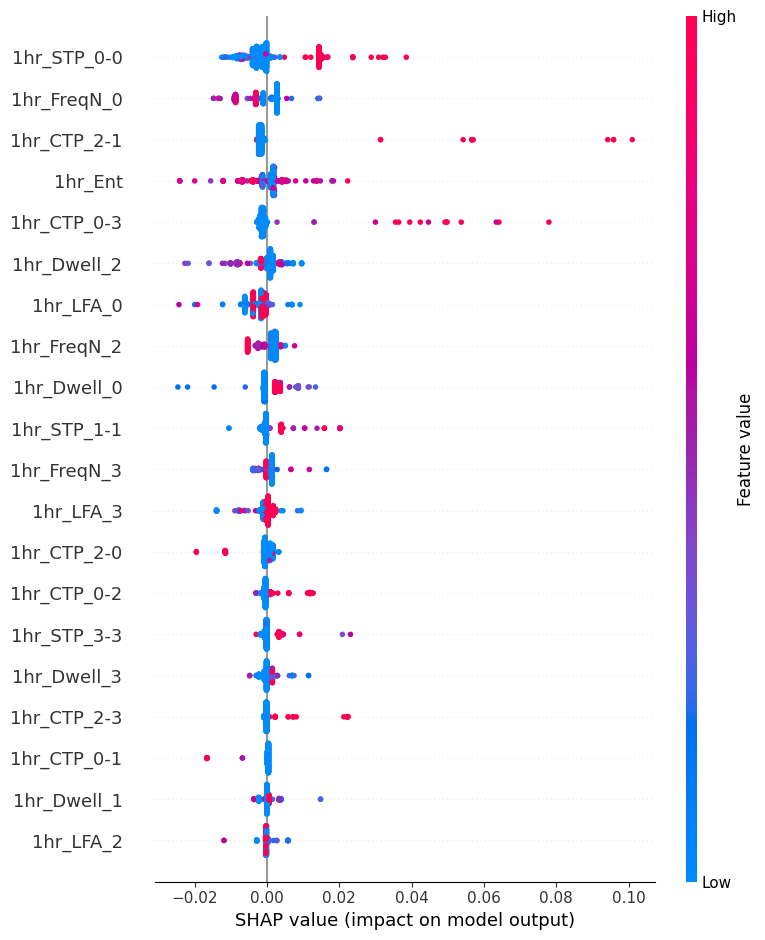

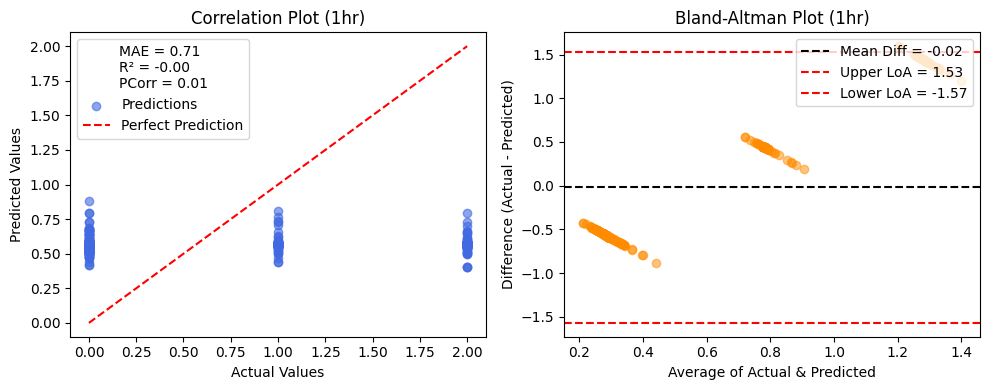

============== PREDICTION OF 2-DAY BFD WITH 3hr DATA ==============
MAE: 0.70, R²: -0.00, Pearson Corr: 0.04
[SHAP] Computing SHAP values...


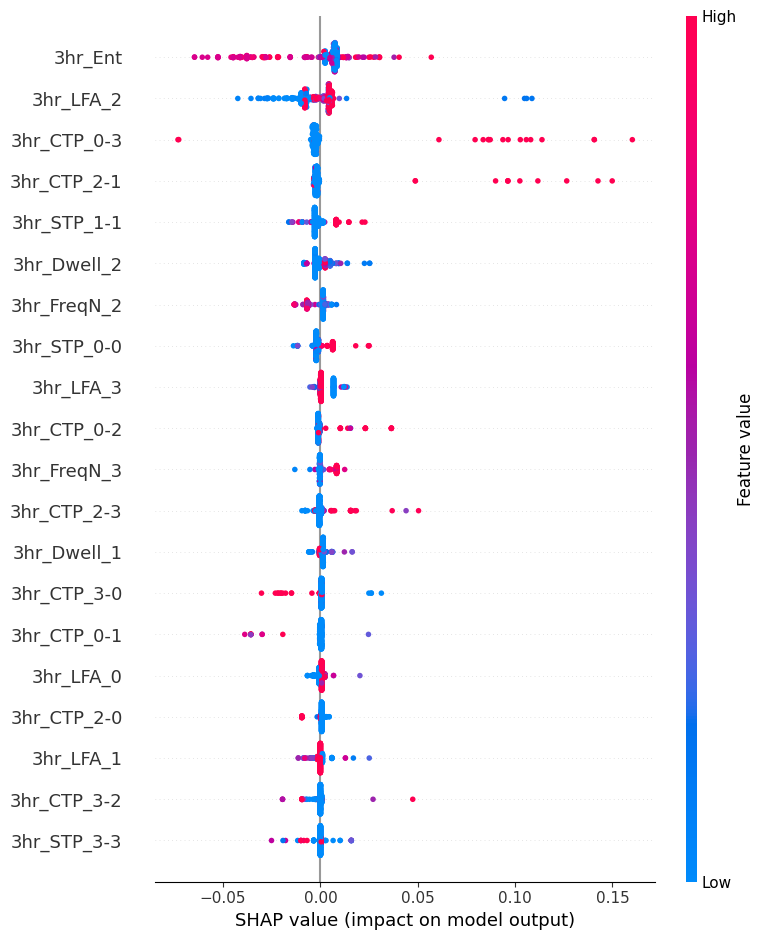

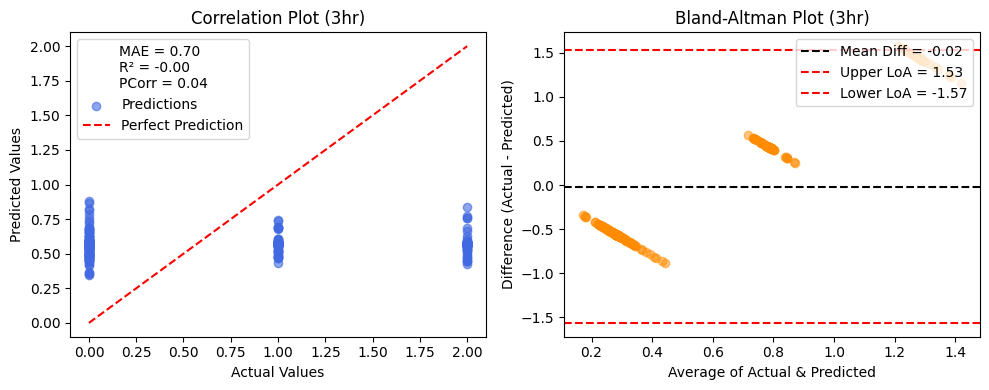

============== PREDICTION OF 2-DAY BFD WITH 6hr DATA ==============
MAE: 0.71, R²: -0.00, Pearson Corr: 0.01
[SHAP] Computing SHAP values...


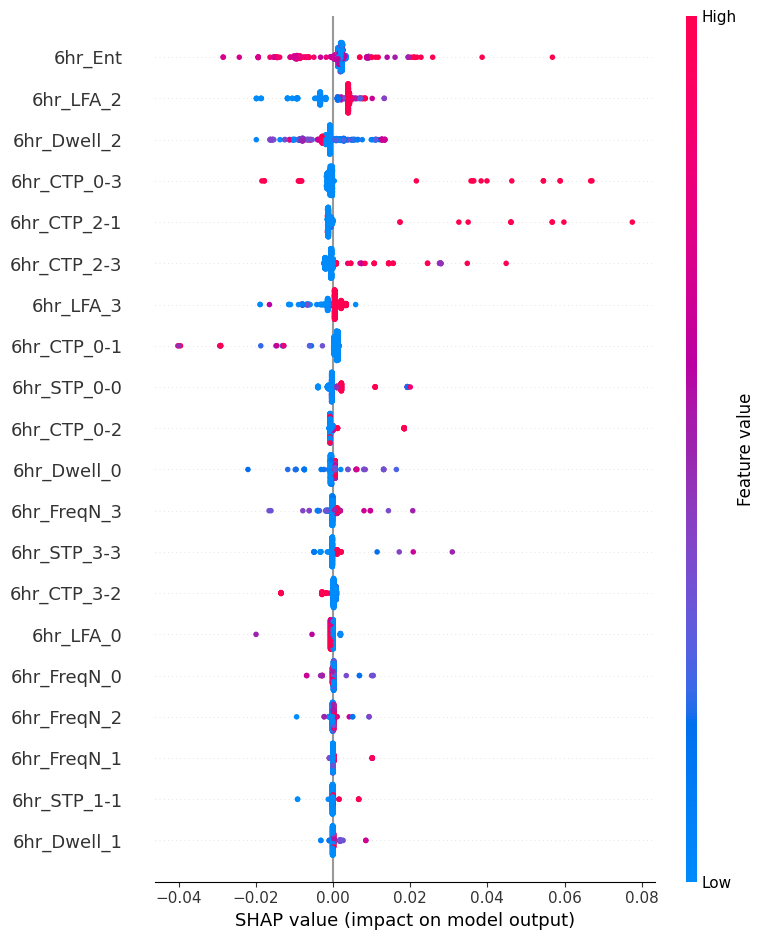

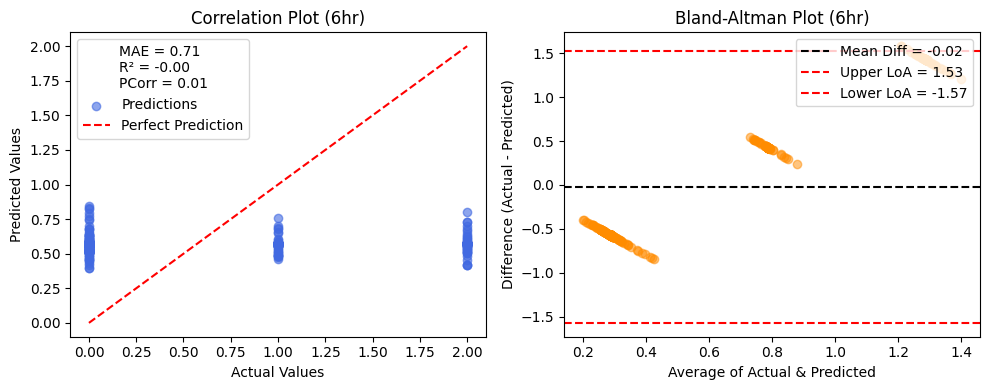

In [103]:
### BFD

_=Block_event_regression(df=df_allFIN.copy(), block_duration='15min',event_name='bfd2',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='30min',event_name='bfd2',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='1hr',event_name='bfd2',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='3hr',event_name='bfd2',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='6hr',event_name='bfd2',df_origin=df_Sepsis_latest_wTarget.copy())

============== PREDICTION OF 28-DAY VFD WITH 15min DATA ==============
MAE: 10.41, R²: 0.00, Pearson Corr: 0.05
[SHAP] Computing SHAP values...


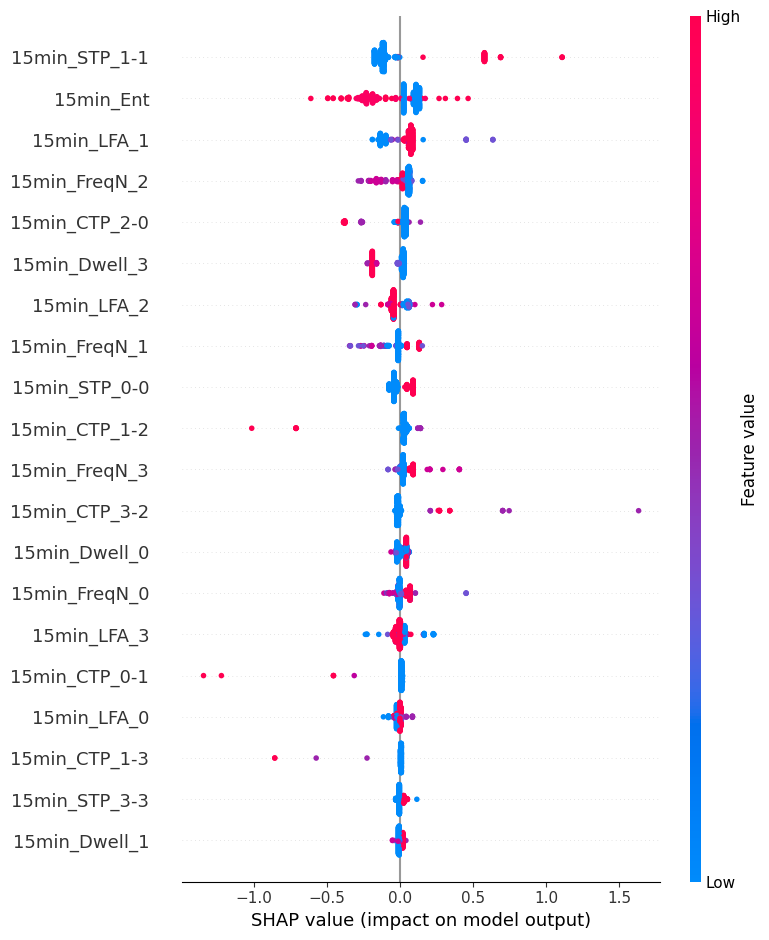

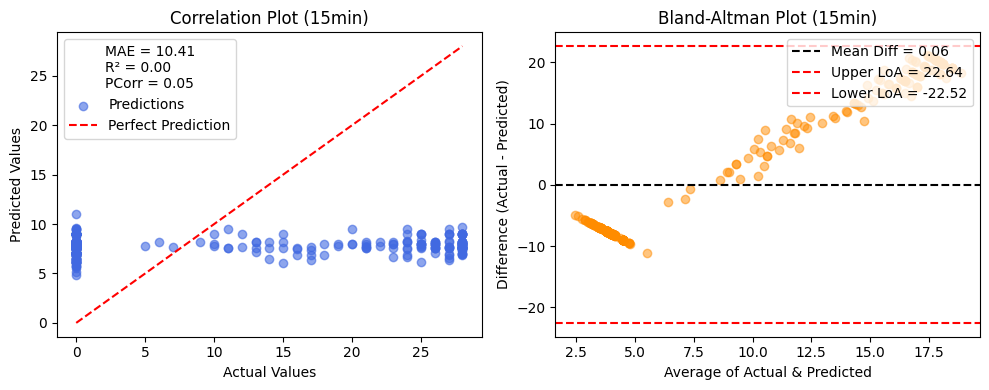

============== PREDICTION OF 28-DAY VFD WITH 30min DATA ==============
MAE: 10.39, R²: 0.00, Pearson Corr: 0.03
[SHAP] Computing SHAP values...


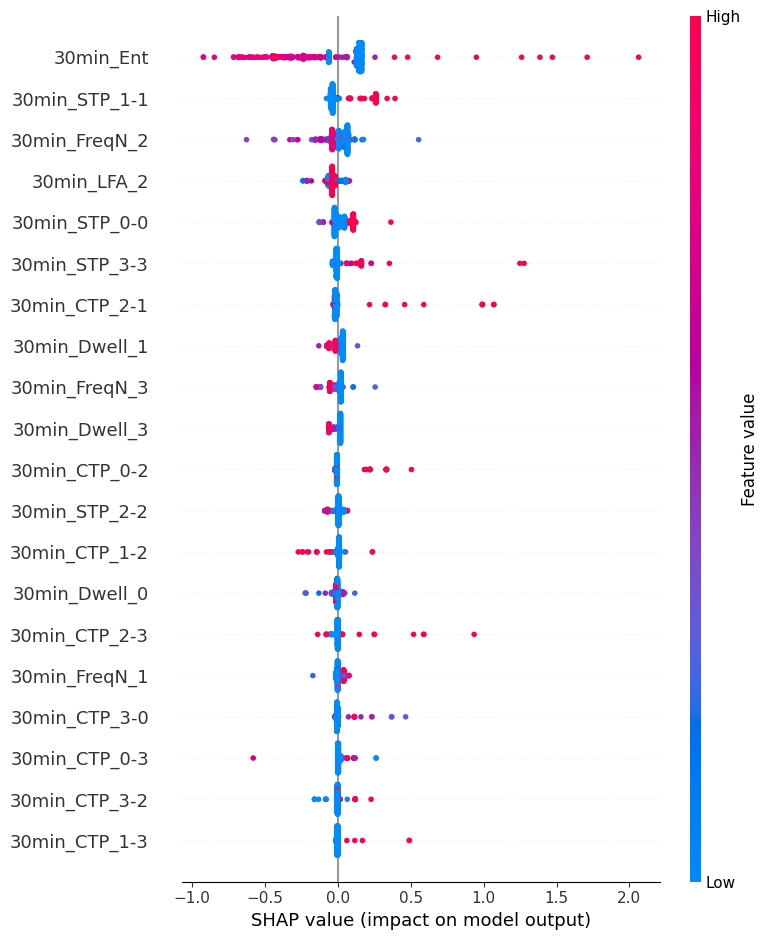

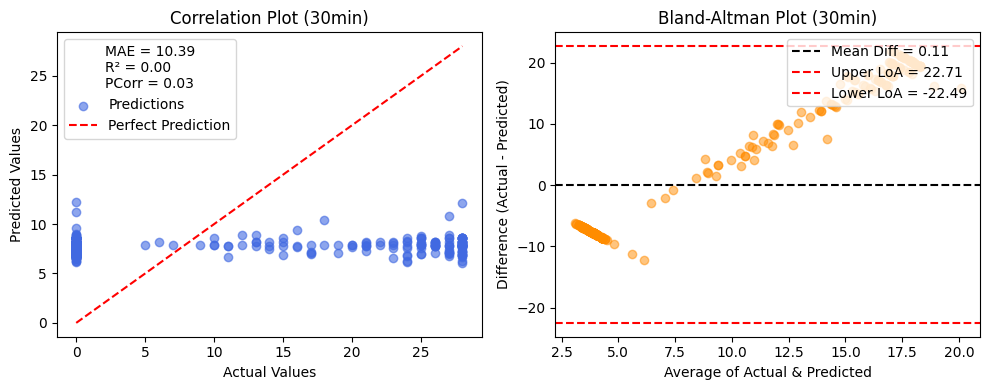

============== PREDICTION OF 28-DAY VFD WITH 1hr DATA ==============
MAE: 10.43, R²: -0.00, Pearson Corr: 0.00
[SHAP] Computing SHAP values...


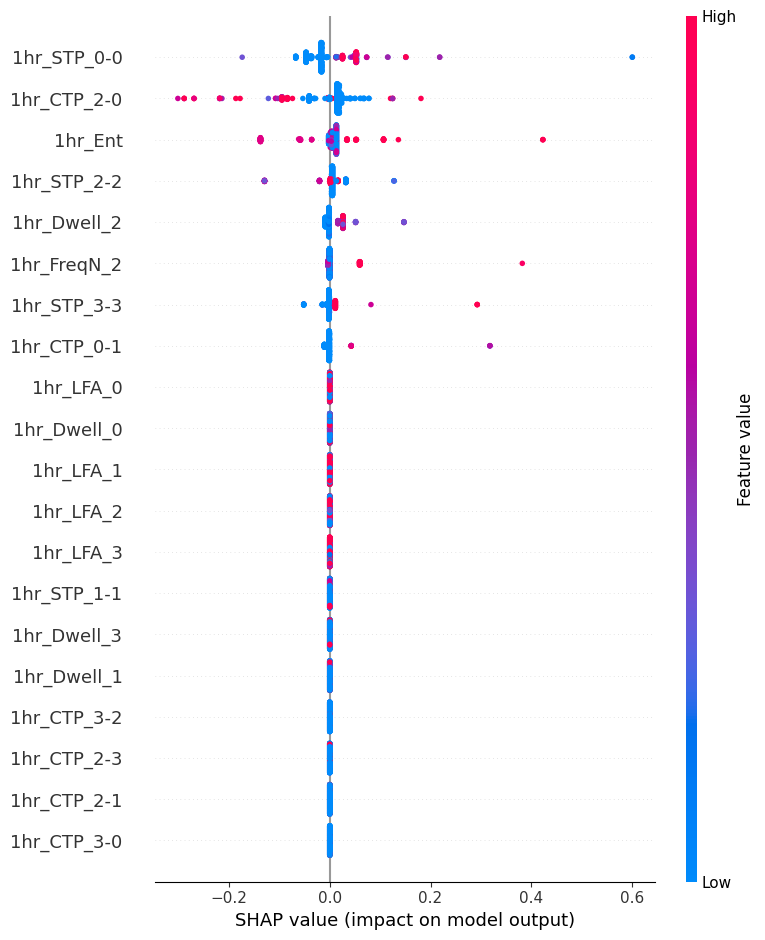

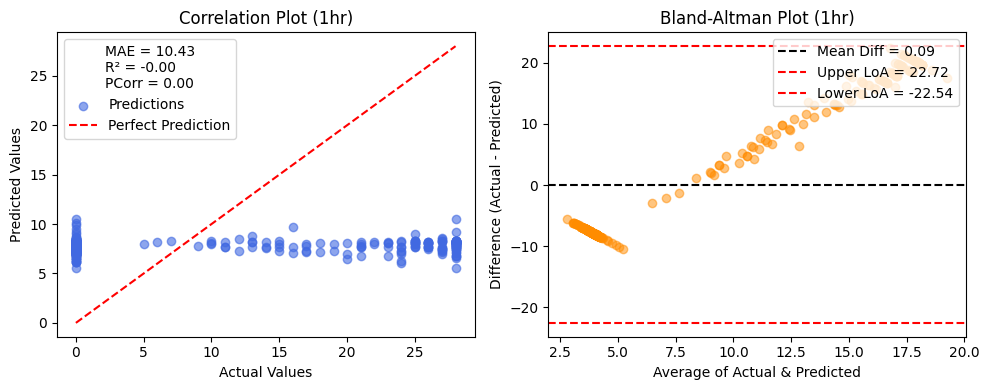

============== PREDICTION OF 28-DAY VFD WITH 3hr DATA ==============
MAE: 10.43, R²: -0.01, Pearson Corr: 0.00
[SHAP] Computing SHAP values...


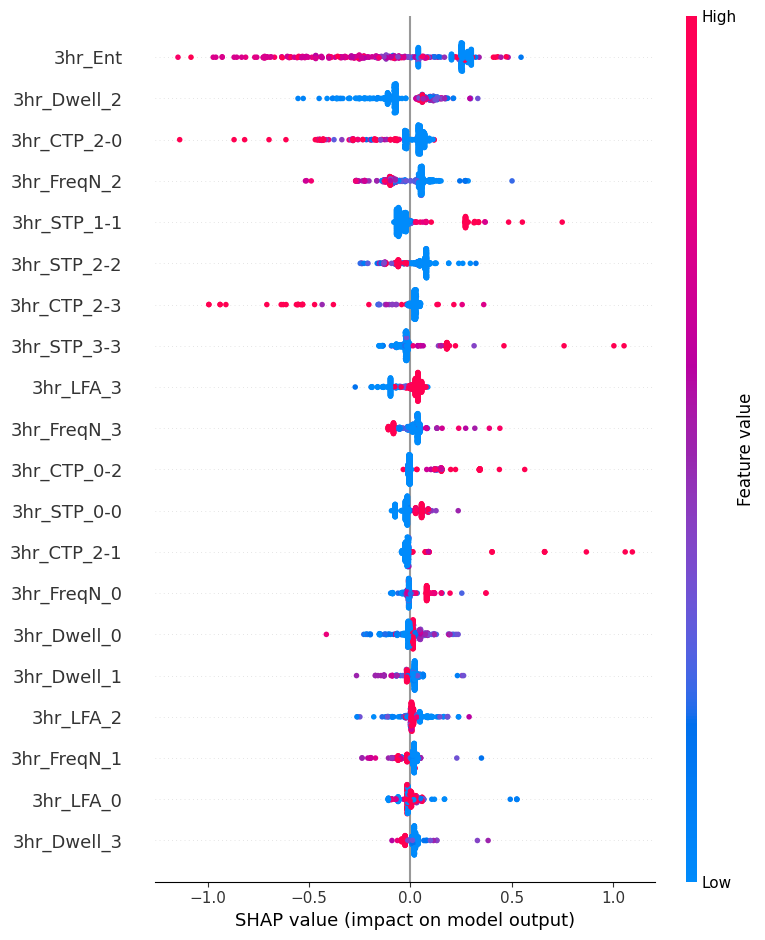

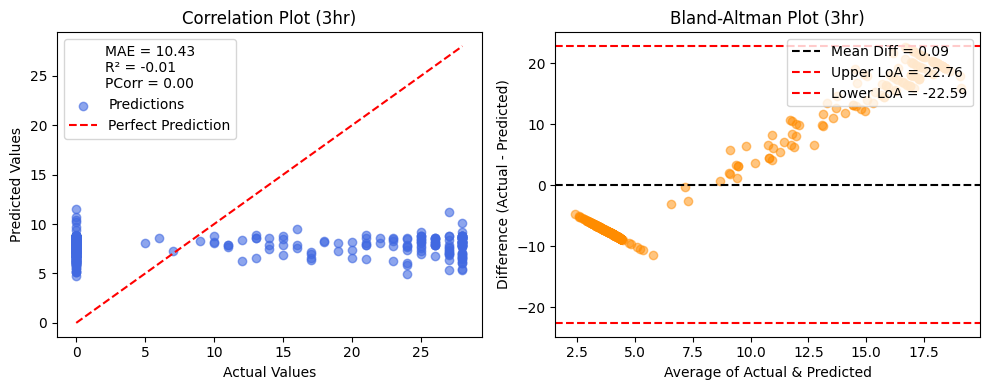

============== PREDICTION OF 28-DAY VFD WITH 6hr DATA ==============
MAE: 10.39, R²: 0.00, Pearson Corr: 0.04
[SHAP] Computing SHAP values...


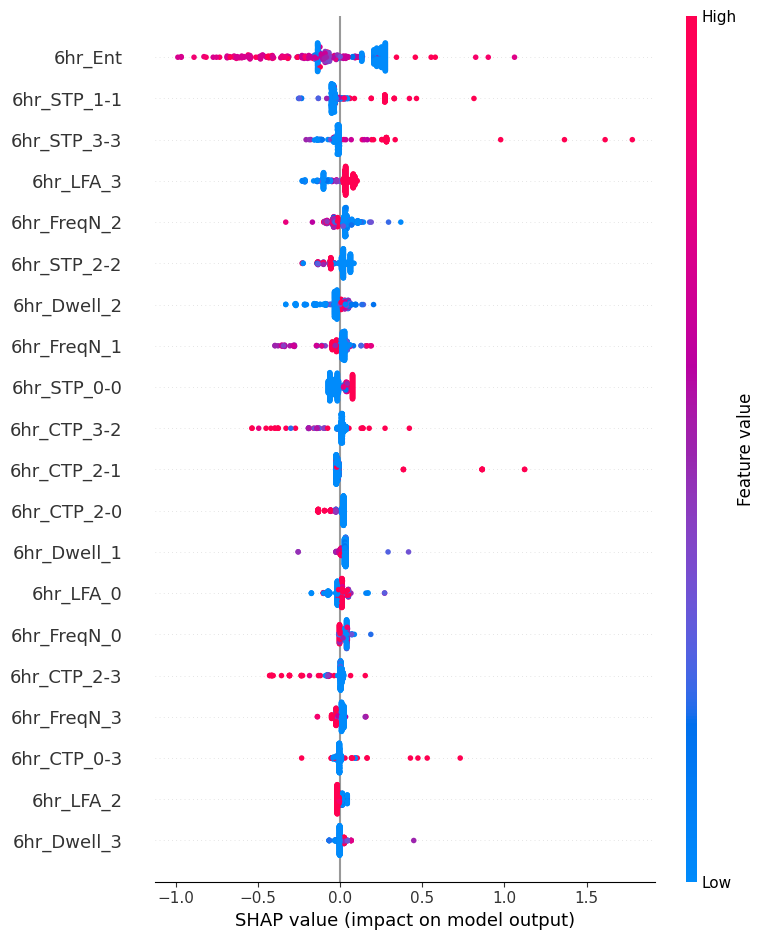

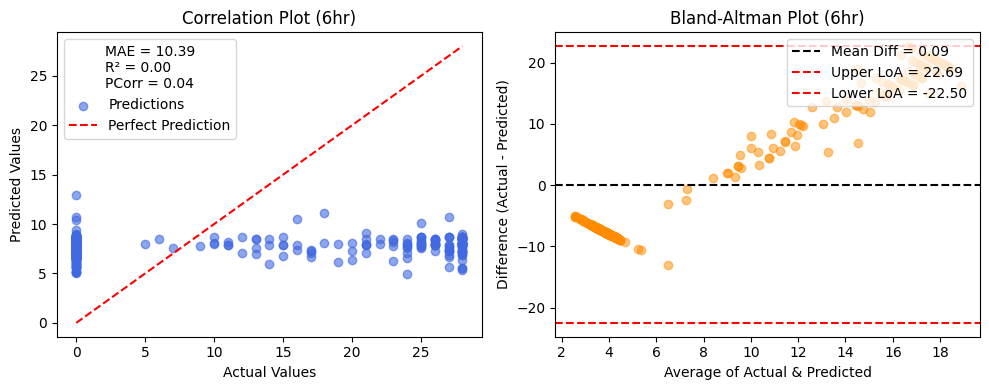

In [104]:
### VFD

_=Block_event_regression(df=df_allFIN.copy(), block_duration='15min',event_name='vfd28',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='30min',event_name='vfd28',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='1hr',event_name='vfd28',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='3hr',event_name='vfd28',df_origin=df_Sepsis_latest_wTarget.copy())
_=Block_event_regression(df=df_allFIN.copy(), block_duration='6hr',event_name='vfd28',df_origin=df_Sepsis_latest_wTarget.copy())